<a href="https://colab.research.google.com/github/khanmhmdi/Moe-llm-edge-computing/blob/main/Copy_of_Jalaseh_11_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#To Do list for the 12th Session
## 1.inding a good moe arch(more than one layer) for cifar10 to get good result
## 2.Adding the pervious session(coniditional probablity) to the new arch
## 3.Find the optimal boundary of the latency
## 4.Find the optimal params(now only grid search for showing in the image) of to balance the accuracy and latency for choosing the experts
## 5.Some visualization for understading the difference of experts(histogram of experts weights, gard cam of the experts features)

-------------------------------------------------------------------------------
# Some common things aboat the models:
## Add the accuracy of the test dataset during training
## Add the regularizations terms(dropout, L1, L2 ...)
## The number of times that each expert at each layer chooses during training(use the accruacy from 100 for each experts) to make sure that model doesnot bias on one specific expert




Using device: cuda
Epoch 1/50, Loss: 1.6804, Accuracy: 40.65%, Penalty: 0.0000, LoadBalanceLoss: 0.0036
Epoch 2/50, Loss: 1.4583, Accuracy: 48.53%, Penalty: 0.0000, LoadBalanceLoss: 0.0023
Epoch 3/50, Loss: 1.3442, Accuracy: 52.61%, Penalty: 0.0000, LoadBalanceLoss: 0.0034
Epoch 4/50, Loss: 1.2463, Accuracy: 55.98%, Penalty: 0.0000, LoadBalanceLoss: 0.0012
Epoch 5/50, Loss: 1.1532, Accuracy: 59.40%, Penalty: 0.0000, LoadBalanceLoss: 0.0023
Epoch 6/50, Loss: 1.0708, Accuracy: 62.24%, Penalty: 0.0000, LoadBalanceLoss: 0.0020
Epoch 7/50, Loss: 0.9733, Accuracy: 65.85%, Penalty: 0.0000, LoadBalanceLoss: 0.0019
Epoch 8/50, Loss: 0.8852, Accuracy: 68.90%, Penalty: 0.0000, LoadBalanceLoss: 0.0024
Epoch 9/50, Loss: 0.8016, Accuracy: 71.94%, Penalty: 0.0000, LoadBalanceLoss: 0.0026
Epoch 10/50, Loss: 0.7233, Accuracy: 74.65%, Penalty: 0.0000, LoadBalanceLoss: 0.0030
Epoch 11/50, Loss: 0.6525, Accuracy: 77.30%, Penalty: 0.0000, LoadBalanceLoss: 0.0030
Epoch 12/50, Loss: 0.6001, Accuracy: 79.13%,

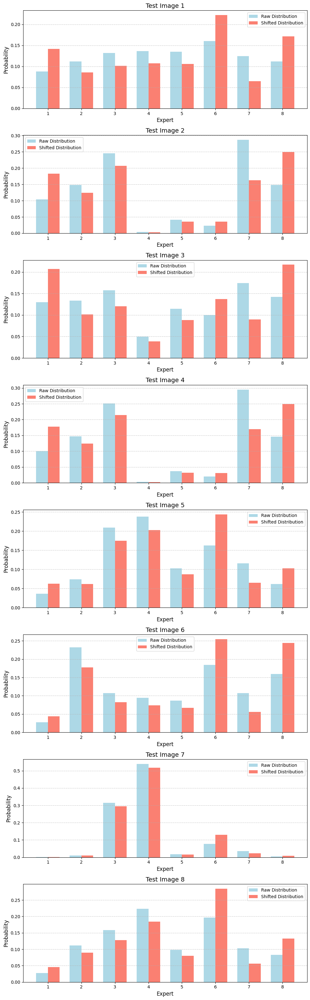

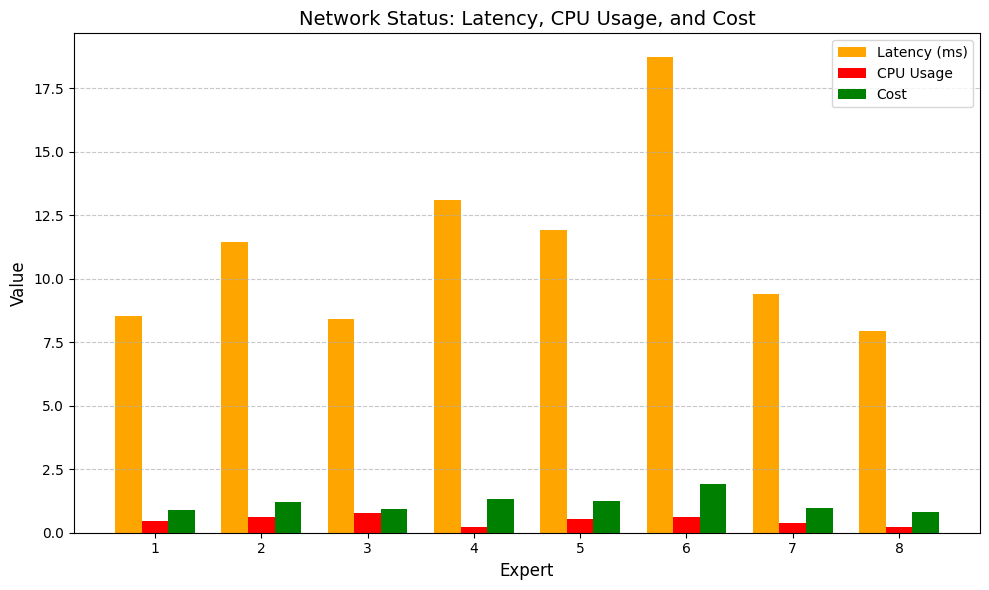

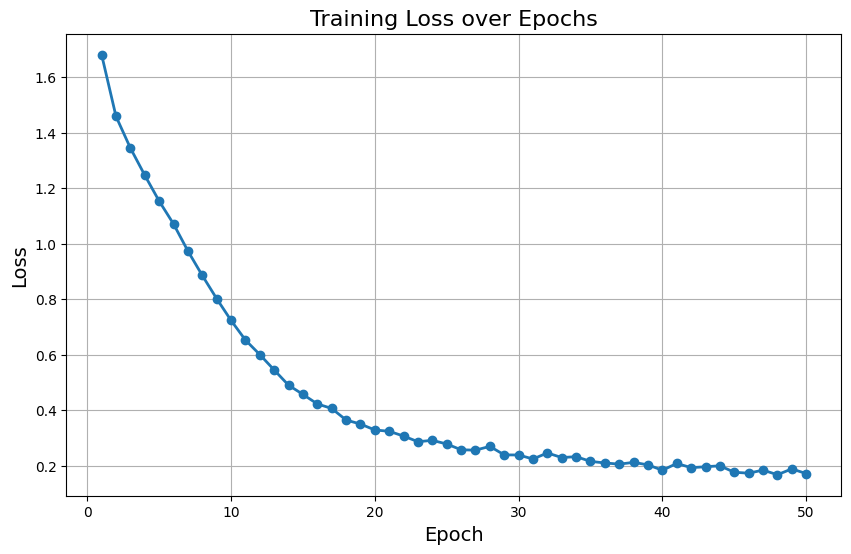

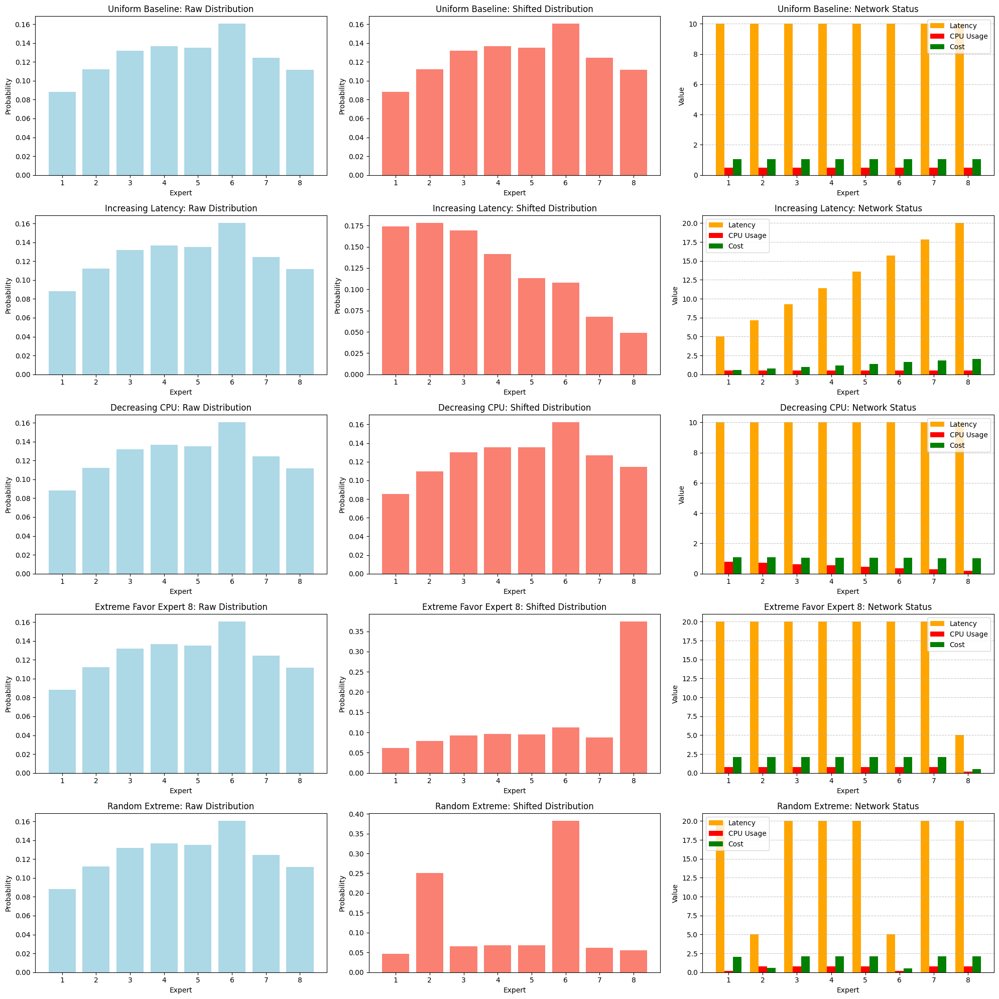

Saved distribution shift results for 100 trials to distribution_shift_results.csv


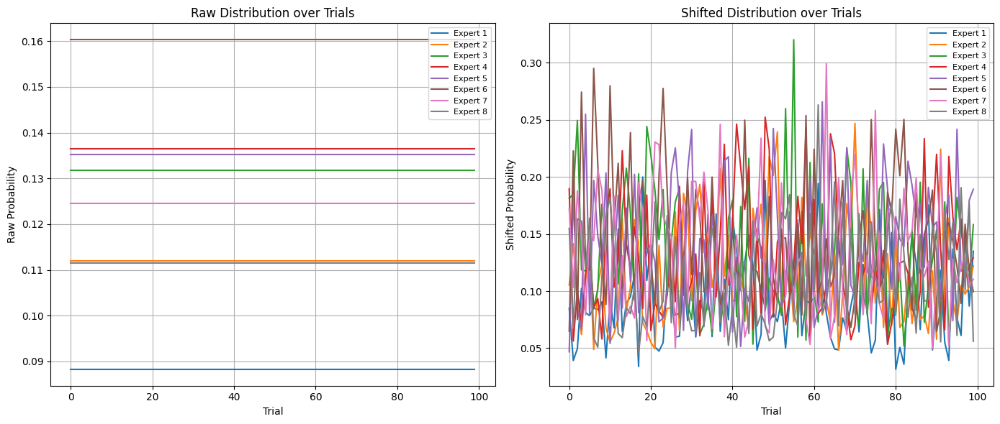

In [ ]:
"""
Updated Mixture of Experts (MoE) for CIFAR10 dataset with CUDA support,
Load Balancing Loss, Monitoring of Conditional Distribution Shift,
Network Status, Enhanced Analysis of Network Situations, Evaluation of Distribution Shift,
and plotting of the distribution shift results for each trial.
"""

import random
import csv
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

class Expert(nn.Module):
    """Expert network with additional fully-connected layers."""
    def __init__(self, input_dim: int, num_classes: int):
        super(Expert, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class GatingNetwork(nn.Module):
    """Gating network with additional fully-connected layers."""
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with deeper fully-connected experts and gating network.
    """
    def __init__(self, num_experts: int, input_dim: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(input_dim, num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim, num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    experts = list(range(1, len(debug_info["latency"]) + 1))
    bar_width = 0.25
    plt.figure(figsize=(10, 6))
    plt.bar([x - bar_width for x in experts],
            debug_info["latency"],
            width=bar_width,
            label="Latency (ms)",
            color='orange')
    plt.bar(experts,
            debug_info["cpu_usage"],
            width=bar_width,
            label="CPU Usage",
            color='red')
    plt.bar([x + bar_width for x in experts],
            debug_info["cost"],
            width=bar_width,
            label="Cost",
            color='green')
    plt.xlabel("Expert", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.title("Network Status: Latency, CPU Usage, and Cost", fontsize=14)
    plt.xticks(experts)
    plt.legend(fontsize=10)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

def analyze_network_situations(model: nn.Module, scenarios: dict, image: torch.Tensor):
    scenario_names = list(scenarios.keys())
    num_scenarios = len(scenario_names)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_scenarios, 3, figsize=(20, 4 * num_scenarios))
    if num_scenarios == 1:
        axs = [axs]

    for i, scenario in enumerate(scenario_names):
        sim_params = scenarios[scenario]
        with torch.no_grad():
            _, debug_info = model.forward_debug(image, sim_latency=sim_params["latency"], sim_cpu_usage=sim_params["cpu_usage"])

        ax1 = axs[i][0]
        ax1.bar(experts, debug_info["raw_p"][0], color='lightblue')
        ax1.set_title(f"{scenario}: Raw Distribution")
        ax1.set_xlabel("Expert")
        ax1.set_ylabel("Probability")
        ax1.set_xticks(experts)

        ax2 = axs[i][1]
        ax2.bar(experts, debug_info["p"][0], color='salmon')
        ax2.set_title(f"{scenario}: Shifted Distribution")
        ax2.set_xlabel("Expert")
        ax2.set_ylabel("Probability")
        ax2.set_xticks(experts)

        ax3 = axs[i][2]
        bar_width = 0.25
        ax3.bar([x - bar_width for x in experts],
                debug_info["latency"],
                width=bar_width,
                label="Latency",
                color='orange')
        ax3.bar(experts,
                debug_info["cpu_usage"],
                width=bar_width,
                label="CPU Usage",
                color='red')
        ax3.bar([x + bar_width for x in experts],
                debug_info["cost"],
                width=bar_width,
                label="Cost",
                color='green')
        ax3.set_title(f"{scenario}: Network Status")
        ax3.set_xlabel("Expert")
        ax3.set_ylabel("Value")
        ax3.set_xticks(experts)
        ax3.legend(fontsize=10)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("analyze_network_situations.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_distribution_shift(model: nn.Module, image: torch.Tensor, trials: int = 100, filename: str = "distribution_shift_results.csv"):
    """
    Evaluate the distribution shift for a given image over multiple trials, save the results,
    and return the results list.

    For each trial, the function collects:
      - The raw gating distribution (raw_p)
      - The final shifted distribution (p)
      - Expected cost and penalty
    and then writes them to a CSV file.
    """
    results = []
    for t in range(trials):
        with torch.no_grad():
            _, debug_info = model.forward_debug(image)
        raw_p = debug_info["raw_p"][0]      # shape: (num_experts,)
        shifted_p = debug_info["p"][0]        # shape: (num_experts,)
        expected_cost = debug_info["expected_cost"]
        penalty = debug_info["penalty"]
        row = {"trial": t}
        for i, value in enumerate(raw_p):
            row[f"raw_{i+1}"] = value
        for i, value in enumerate(shifted_p):
            row[f"shifted_{i+1}"] = value
        row["expected_cost"] = expected_cost
        row["penalty"] = penalty
        results.append(row)

    fieldnames = ["trial"] + [f"raw_{i+1}" for i in range(model.num_experts)] \
                 + [f"shifted_{i+1}" for i in range(model.num_experts)] \
                 + ["expected_cost", "penalty"]
    with open(filename, "w", newline="") as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for row in results:
            writer.writerow(row)
    print(f"Saved distribution shift results for {trials} trials to {filename}")
    return results

def plot_distribution_shift_results(results: list, num_experts: int):
    """
    Plot the raw and shifted distributions over trials.

    Two subplots are created:
      - Left: Raw distribution for each expert across trials.
      - Right: Shifted distribution for each expert across trials.
    """
    trials = [row["trial"] for row in results]

    plt.figure(figsize=(14, 6))

    # Plot Raw Distribution
    plt.subplot(1, 2, 1)
    for i in range(num_experts):
        prob = [row[f"raw_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Raw Probability")
    plt.title("Raw Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    # Plot Shifted Distribution
    plt.subplot(1, 2, 2)
    for i in range(num_experts):
        prob = [row[f"shifted_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Shifted Probability")
    plt.title("Shifted Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    plt.tight_layout()
    plt.savefig("distribution_shift_trials.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

def main():
    # Use CUDA if available, else fallback to CPU.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Define CIFAR10 transforms (including normalization)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 8
    # For CIFAR10 images (3x32x32), the flattened input dimension is 3*32*32 = 3072.
    model = MoE(
        num_experts=num_experts,
        input_dim=3 * 32 * 32,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 50
    loss_history = []
    accuracy_history = []

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        correct_train = 0
        total_train = 0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()
        avg_loss = total_loss / len(train_loader)
        train_accuracy = 100 * correct_train / total_train  # Accuracy percentage
        loss_history.append(avg_loss)
        accuracy_history.append(train_accuracy)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Accuracy: {train_accuracy:.2f}%, "
              f"Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy: {100 * correct / total:.2f}%")

    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)
    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)
    plot_training_loss(loss_history, num_epochs)

    scenarios = {
        "Uniform Baseline": {"latency": [10.0] * num_experts, "cpu_usage": [0.5] * num_experts},
        "Increasing Latency": {"latency": [5.0 + 15.0 * (i/(num_experts-1)) for i in range(num_experts)], "cpu_usage": [0.5] * num_experts},
        "Decreasing CPU": {"latency": [10.0] * num_experts, "cpu_usage": [0.8 - 0.6 * (i/(num_experts-1)) for i in range(num_experts)]},
        "Extreme Favor Expert 8": {"latency": [20.0 if i != 7 else 5.0 for i in range(num_experts)], "cpu_usage": [0.8 if i != 7 else 0.2 for i in range(num_experts)]},
        "Random Extreme": {"latency": [random.choice([5.0, 20.0]) for _ in range(num_experts)], "cpu_usage": [random.choice([0.2, 0.8]) for _ in range(num_experts)]}
    }
    test_image = images[:1]
    analyze_network_situations(model, scenarios, test_image)

    # Evaluate the distribution shift for 100 trials, save results, and plot them.
    results = evaluate_distribution_shift(model, test_image, trials=100, filename="distribution_shift_results.csv")
    plot_distribution_shift_results(results, num_experts)

if __name__ == "__main__":
    main()


Using device: cuda
Epoch 1/50, Loss: 1.6092, Train Accuracy: 41.21%, Test Accuracy: 53.94%
Epoch 2/50, Loss: 1.2822, Train Accuracy: 54.06%, Test Accuracy: 60.08%
Epoch 3/50, Loss: 1.1458, Train Accuracy: 59.26%, Test Accuracy: 60.64%
Epoch 4/50, Loss: 1.0449, Train Accuracy: 63.19%, Test Accuracy: 65.46%
Epoch 5/50, Loss: 0.9728, Train Accuracy: 65.67%, Test Accuracy: 67.60%
Epoch 6/50, Loss: 0.9278, Train Accuracy: 67.57%, Test Accuracy: 69.05%
Epoch 7/50, Loss: 0.8849, Train Accuracy: 69.17%, Test Accuracy: 68.42%
Epoch 8/50, Loss: 0.8492, Train Accuracy: 70.45%, Test Accuracy: 69.75%
Epoch 9/50, Loss: 0.8134, Train Accuracy: 71.41%, Test Accuracy: 68.83%
Epoch 10/50, Loss: 0.7862, Train Accuracy: 72.58%, Test Accuracy: 72.84%
Epoch 11/50, Loss: 0.7576, Train Accuracy: 73.70%, Test Accuracy: 71.65%
Epoch 12/50, Loss: 0.7345, Train Accuracy: 74.37%, Test Accuracy: 72.90%
Epoch 13/50, Loss: 0.7206, Train Accuracy: 75.12%, Test Accuracy: 72.13%
Epoch 14/50, Loss: 0.7010, Train Accuracy

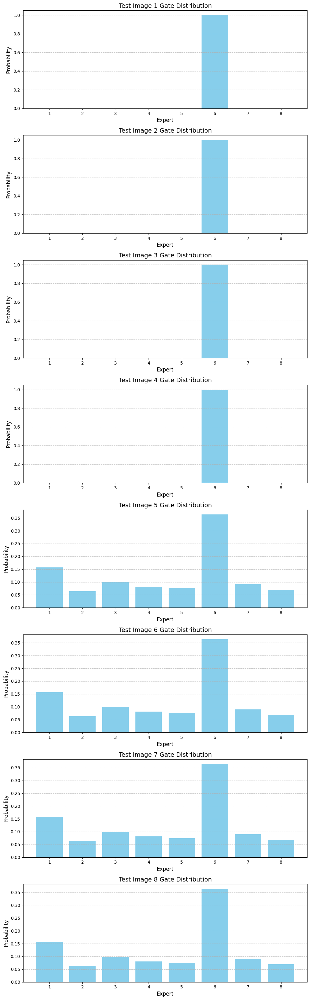

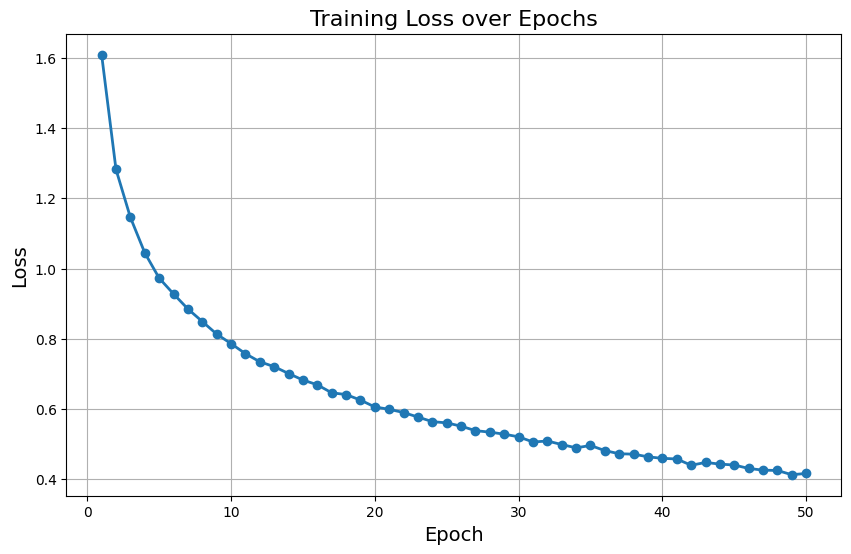

In [ ]:
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# Expert network with a CNN-based feature extractor, dropout regularization, and a fully connected classifier.
class Expert(nn.Module):
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # (B,32,32,32)
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # (B,32,16,16)

            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # (B,64,16,16)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # (B,64,8,8)

            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # (B,128,8,8)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2)   # (B,128,4,4)
        )
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.cnn(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

# Simple gating network that uses a fully-connected network on flattened images.
class GatingNetwork(nn.Module):
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.fc(x)

class MoE(nn.Module):
    def __init__(self, num_experts: int, num_classes: int, lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim=3*32*32, num_experts=num_experts)
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor) -> tuple:
        # Compute gating scores and convert them to probabilities.
        f = self.gate(x)  # Shape: (batch, num_experts)
        p = torch.softmax(f, dim=1)

        # Get outputs from all experts.
        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]  # Each: (batch, num_classes, 1)
        expert_outputs = torch.cat(expert_outputs, dim=2)  # Shape: (batch, num_classes, num_experts)

        # Select the top one expert per sample based on the highest gating probability.
        top1_idx = torch.argmax(p, dim=1)  # Shape: (batch,)
        # Reshape to gather along the expert dimension.
        top1_idx = top1_idx.view(-1, 1, 1).expand(-1, expert_outputs.size(1), 1)
        final_output = torch.gather(expert_outputs, dim=2, index=top1_idx).squeeze(2)

        return final_output, p

# Plot the gating network's distribution over experts for a few test images.
def plot_gate_distribution(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    with torch.no_grad():
        outputs, p = model(images[:num_images])
    experts = list(range(1, model.num_experts + 1))
    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]
    for i in range(num_images):
        ax = axs[i]
        ax.bar(experts, p[i].cpu().numpy(), color='skyblue')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1} Gate Distribution", fontsize=14)
        ax.set_xticks(experts)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("gate_distribution.png", dpi=300, bbox_inches="tight")
    plt.show()

# Plot training loss over epochs.
def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

# Use CUDA if available.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define CIFAR10 transforms with data augmentation for training.
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

num_experts = 8
model = MoE(num_experts=num_experts, num_classes=10, lambda_balance=0.1).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

num_epochs = 50
loss_history = []
train_accuracy_history = []
test_accuracy_history = []

# Training loop.
for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs, p = model(images)
        loss_ce = criterion(outputs, labels)
        # Load balancing loss to encourage even expert utilization.
        importance = p.sum(dim=0)
        load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
        loss = loss_ce + model.lambda_balance * load_balance_loss
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    avg_loss = total_loss / len(train_loader)
    train_accuracy = 100 * correct_train / total_train
    loss_history.append(avg_loss)
    train_accuracy_history.append(train_accuracy)

    # Evaluate on the test dataset after each epoch.
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
    test_accuracy = 100 * correct_test / total_test
    test_accuracy_history.append(test_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Test Accuracy: {test_accuracy:.2f}%")

# Final evaluation on test data.
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
print(f"Final Test Accuracy: {100 * correct / total:.2f}%")

# Plot the gating network's distribution for a few test images.
dataiter = iter(test_loader)
images, _ = next(dataiter)
images = images.to(device)
plot_gate_distribution(model, images, num_images=8)
# Plot training loss.
plot_training_loss(loss_history, num_epochs)



Using device: cuda
Epoch 1/30 - Loss: 1.9179 - Train Accuracy: 27.94% - Test Accuracy: 30.25%
Expert Selection Distribution per Layer:
  Layer 1: Expert 1: 12.16%, Expert 2: 13.51%, Expert 3: 22.21%, Expert 4: 19.50%, Expert 5: 20.45%, Expert 6: 12.18%
  Layer 2: Expert 1: 15.51%, Expert 2: 20.93%, Expert 3: 25.12%, Expert 4: 14.34%, Expert 5: 8.55%, Expert 6: 15.55%
  Layer 3: Expert 1: 17.80%, Expert 2: 18.79%, Expert 3: 13.14%, Expert 4: 14.14%, Expert 5: 22.45%, Expert 6: 13.68%
Epoch 2/30 - Loss: 1.7334 - Train Accuracy: 34.56% - Test Accuracy: 36.72%
Expert Selection Distribution per Layer:
  Layer 1: Expert 1: 17.99%, Expert 2: 3.76%, Expert 3: 22.72%, Expert 4: 19.16%, Expert 5: 20.54%, Expert 6: 15.83%
  Layer 2: Expert 1: 16.85%, Expert 2: 21.92%, Expert 3: 27.61%, Expert 4: 12.12%, Expert 5: 8.19%, Expert 6: 13.30%
  Layer 3: Expert 1: 15.74%, Expert 2: 23.16%, Expert 3: 10.76%, Expert 4: 19.73%, Expert 5: 17.18%, Expert 6: 13.44%
Epoch 3/30 - Loss: 1.6561 - Train Accuracy: 

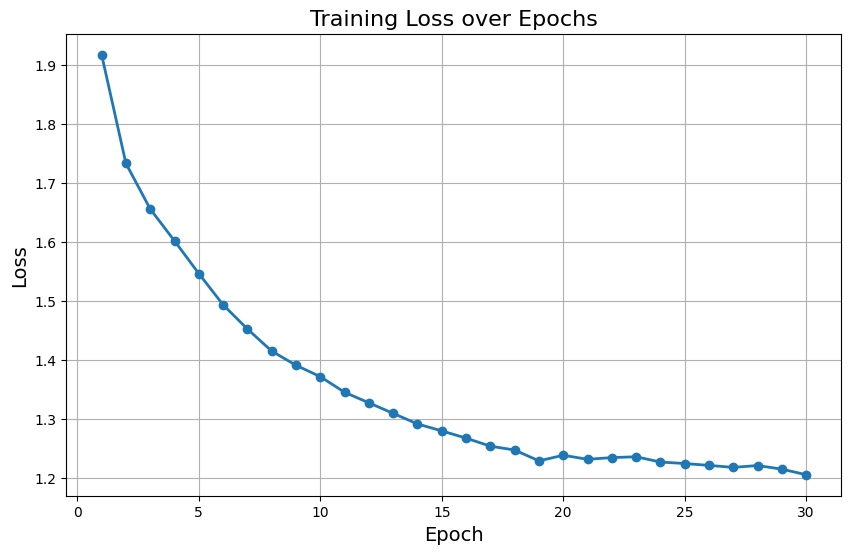

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Define a single Mixture-of-Experts block.
class MoEBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, num_experts: int, use_top1: bool = True):
        """
        Args:
            in_channels: Number of input channels.
            out_channels: Number of output channels for each expert.
            num_experts: Number of experts in this block.
            use_top1: Whether to use top-1 selection (non-differentiable) or weighted sum.
        """
        super(MoEBlock, self).__init__()
        self.num_experts = num_experts
        # Each expert is a simple conv block.
        self.experts = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ) for _ in range(num_experts)
        ])
        # Gating network: use adaptive average pooling to reduce spatial dimensions,
        # then a small FC network to produce gating logits.
        self.gate = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),  # Output: (batch, in_channels, 1, 1)
            nn.Flatten(),                  # Output: (batch, in_channels)
            nn.Linear(in_channels, 128),
            nn.ReLU(inplace=True),
            nn.Linear(128, num_experts)
        )
        self.use_top1 = use_top1

    def forward(self, x: torch.Tensor) -> tuple:
        # x shape: (batch, in_channels, H, W)
        gate_logits = self.gate(x)  # (batch, num_experts)
        p = torch.softmax(gate_logits, dim=1)  # (batch, num_experts)
        # Compute each expert's output: each has shape (batch, out_channels, H, W)
        expert_outputs = [expert(x).unsqueeze(1) for expert in self.experts]
        # Concatenate along a new expert dimension → shape: (batch, num_experts, out_channels, H, W)
        expert_outputs = torch.cat(expert_outputs, dim=1)

        if self.use_top1:
            top1_idx = torch.argmax(p, dim=1)
            B, E, C, H, W = expert_outputs.size()
            # CORRECTED: Added 5D reshaping
            index = top1_idx.view(B, 1, 1, 1, 1).expand(B, 1, C, H, W)
            output = torch.gather(expert_outputs, dim=1, index=index).squeeze(1)
        else:
            # Compute a weighted sum over expert outputs.
            p_exp = p.view(p.size(0), p.size(1), 1, 1, 1)
            output = torch.sum(expert_outputs * p_exp, dim=1)

        return output, p

# Define the overall deep MoE model by stacking multiple MoE blocks.
class DeepMoE(nn.Module):
    def __init__(self, num_layers: int, in_channels: int, num_experts_per_layer: int, hidden_channels: int, num_classes: int, use_top1: bool = True):
        """
        Args:
            num_layers: Number of MoE blocks to stack.
            in_channels: Number of channels in the input image.
            num_experts_per_layer: Number of experts in each MoE block.
            hidden_channels: Number of output channels for each block (and input channels for the next block).
            num_classes: Number of classification classes.
            use_top1: Whether to use top-1 expert selection.
        """
        super(DeepMoE, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(num_layers):
            # For the first block, input channels come from the image.
            input_c = in_channels if i == 0 else hidden_channels
            self.layers.append(MoEBlock(input_c, hidden_channels, num_experts=num_experts_per_layer, use_top1=use_top1))

        # Final classifier: pool features and map to class logits.
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),  # Pool spatial dimensions.
            nn.Flatten(),                  # (batch, hidden_channels)
            nn.Linear(hidden_channels, num_classes)
        )

    def forward(self, x: torch.Tensor) -> tuple:
        gating_probs = []  # Save gating distributions from each layer.
        for layer in self.layers:
            x, p = layer(x)
            gating_probs.append(p)
        logits = self.classifier(x)
        return logits, gating_probs

#############################################
# Example usage with CIFAR10
#############################################

# Set device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define data transforms.
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# Load CIFAR10 datasets.
train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

# Define model hyperparameters.
num_layers = 3
num_experts_per_layer = 6
hidden_channels = 64   # output channels from each MoE block
num_classes = 10

# Instantiate the deep MoE model.
model = DeepMoE(num_layers=num_layers, in_channels=3, num_experts_per_layer=num_experts_per_layer,
                hidden_channels=hidden_channels, num_classes=num_classes, use_top1=True).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Hyperparameter for load balancing loss.
lambda_load_balance = 0.1

num_epochs = 30
loss_history = []

# Initialize expert selection counters for each MoE block.
expert_selection_counts = [torch.zeros(num_experts_per_layer, dtype=torch.int64) for _ in range(num_layers)]
total_samples = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    # Initialize per-epoch expert selection counters for each MoE layer.
    epoch_expert_selection_counts = [torch.zeros(num_experts_per_layer, dtype=torch.int64) for _ in range(num_layers)]
    epoch_total_samples = 0  # Total samples processed in this epoch.

    # Training loop
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs, gating_probs = model(images)

        # Base classification loss.
        loss = criterion(outputs, labels)

        # Compute load balancing loss across MoE layers.
        load_balance_loss = 0.0
        for p in gating_probs:
            # p has shape (batch, num_experts)
            importance = torch.mean(p, dim=0)  # Average gating probability per expert.
            mean_importance = torch.mean(importance)
            std_importance = torch.std(importance)
            cv_squared = (std_importance / mean_importance) ** 2
            load_balance_loss += cv_squared
        load_balance_loss = load_balance_loss / len(gating_probs)

        # Add the load balancing loss to the total loss.
        loss = loss + lambda_load_balance * load_balance_loss

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

        batch_size = images.size(0)
        epoch_total_samples += batch_size

        # Update expert selection counts for each MoE layer.
        for layer_idx, p in enumerate(gating_probs):
            top1 = torch.argmax(p, dim=1)  # shape: (batch,)
            for expert in range(num_experts_per_layer):
                epoch_expert_selection_counts[layer_idx][expert] += (top1 == expert).sum().item()

    epoch_loss = running_loss / total_train
    epoch_train_acc = 100 * correct_train / total_train
    loss_history.append(epoch_loss)

    # Evaluate on test set.
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
    epoch_test_acc = 100 * correct_test / total_test

    # Print results for the current epoch.
    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {epoch_loss:.4f} - Train Accuracy: {epoch_train_acc:.2f}% - Test Accuracy: {epoch_test_acc:.2f}%")
    print("Expert Selection Distribution per Layer:")
    for layer_idx in range(num_layers):
        counts = epoch_expert_selection_counts[layer_idx].float()
        percentages = (counts / epoch_total_samples) * 100.0
        dist_str = ", ".join([f"Expert {expert+1}: {percentages[expert].item():.2f}%" for expert in range(num_experts_per_layer)])
        print(f"  Layer {layer_idx+1}: {dist_str}")

# Evaluate on test data.
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
test_acc = 100 * correct / total
print(f"Test Accuracy: {test_acc:.2f}%")

# After training, print the expert selection percentages for each MoE block.
print("\nExpert Selection Percentages per Layer:")
for layer_idx in range(num_layers):
    counts = expert_selection_counts[layer_idx].float()  # convert to float for division
    percentages = (counts / total_samples) * 100.0  # total_samples is the number of examples per layer
    print(f"\nLayer {layer_idx+1}:")
    for expert in range(num_experts_per_layer):
         print(f"  Expert {expert+1}: {percentages[expert].item():.2f}%")

# Plot training loss.
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
plt.title("Training Loss over Epochs", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.grid(True)
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import math

# Expert network with a CNN-based feature extractor, dropout regularization, and a fully connected classifier.
class Expert(nn.Module):
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        # For MNIST, input channel = 1.
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),  # (B,32,28,28)
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # (B,32,14,14)

            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # (B,64,14,14)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # (B,64,7,7)

            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # (B,128,7,7)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2)   # (B,128,3,3) - note: 7//2 = 3
        )
        self.dropout = nn.Dropout(0.5)
        # Adjusted input features for MNIST.
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 3 * 3, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.cnn(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

# Simple gating network that uses a fully-connected network on flattened images.
class GatingNetwork(nn.Module):
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.fc(x)

# Mixture of Experts (MoE) model combining several experts using the simplified gating network.
# This version simulates an edge computing scenario by modifying the gating network output
# with network topology (latency) and device status (CPU utilization) using conditional probability.
class MoE(nn.Module):
    def __init__(self, num_experts: int, num_classes: int, lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        # For MNIST images (1x28x28), input dimension = 28*28 = 784.
        self.gate = GatingNetwork(input_dim=28*28, num_experts=num_experts)
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor) -> tuple:
        # Compute gating weights and apply softmax to get a probability distribution over experts.
        f = self.gate(x)  # Shape: (batch, num_experts)
        p = torch.softmax(f, dim=1)  # Base probabilities: P0(e|x)

        # --- Simulate Edge Computing Conditions ---
        # For each expert, we simulate network latency and CPU utilization.
        # In a real scenario these values would be collected from edge devices.
        # Here we use fixed example values for demonstration.

        # Sensitivity parameter for latency
        alpha = 0.1

        # Simulated latencies for each expert (in ms)
        simulated_latencies = torch.tensor([10.0, 5.0, 20.0, 15.0, 8.0, 12.0, 18.0, 7.0], device=x.device)
        latencies = simulated_latencies[:self.num_experts]

        # Simulated CPU utilizations for each expert (values between 0 and 1)
        simulated_cpus = torch.tensor([0.8, 0.3, 0.5, 0.6, 0.4, 0.7, 0.9, 0.2], device=x.device)
        cpus = simulated_cpus[:self.num_experts]

        # Compute network suitability factor: lower latency gives a higher factor.
        N_f = torch.exp(-alpha * latencies)  # e.g., exp(-0.1*latency)

        # Compute device status factor: lower CPU utilization gives a higher factor.
        S_f = 1.0 - cpus  # e.g., if CPU utilization is 0.8 then factor is 0.2

        # Combine the suitability factors with the original gating probabilities.
        factors = N_f.unsqueeze(0) * S_f.unsqueeze(0)  # Broadcast to (1, num_experts)
        p_modified_unnorm = p * factors
        # Normalize to get a valid probability distribution.
        normalization = p_modified_unnorm.sum(dim=1, keepdim=True)
        p_modified = p_modified_unnorm / normalization

        # --- Compute Expert Outputs and Aggregate ---
        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]  # Each: (batch, num_classes, 1)
        expert_outputs = torch.cat(expert_outputs, dim=2)  # Shape: (batch, num_classes, num_experts)
        final_output = torch.sum(expert_outputs * p_modified.unsqueeze(1), dim=2)
        return final_output, p_modified

# Plot the gating network's distribution over experts for a few test images.
def plot_gate_distribution(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    with torch.no_grad():
        outputs, p = model(images[:num_images])
    experts = list(range(1, model.num_experts + 1))
    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]
    for i in range(num_images):
        ax = axs[i]
        ax.bar(experts, p[i].cpu().numpy(), color='skyblue')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1} Gate Distribution", fontsize=14)
        ax.set_xticks(experts)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("gate_distribution.png", dpi=300, bbox_inches="tight")
    plt.show()

# Plot training loss over epochs.
def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

# Use CUDA if available.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define MNIST transforms.
transform_train = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

# Load MNIST datasets.
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
test_dataset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

num_experts = 8
model = MoE(num_experts=num_experts, num_classes=10, lambda_balance=0.1).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

num_epochs = 1
loss_history = []
train_accuracy_history = []
test_accuracy_history = []

# Training loop.
for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs, p = model(images)
        loss_ce = criterion(outputs, labels)
        # Load balancing loss to encourage even expert utilization.
        importance = p.sum(dim=0)
        load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
        loss = loss_ce + model.lambda_balance * load_balance_loss
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    avg_loss = total_loss / len(train_loader)
    train_accuracy = 100 * correct_train / total_train
    loss_history.append(avg_loss)
    train_accuracy_history.append(train_accuracy)

    # Evaluate on the test dataset after each epoch.
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
    test_accuracy = 100 * correct_test / total_test
    test_accuracy_history.append(test_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Test Accuracy: {test_accuracy:.2f}%")

# Final evaluation on test data.
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs, _ = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
print(f"Final Test Accuracy: {100 * correct / total:.2f}%")

# Plot the gating network's distribution for a few test images.
dataiter = iter(test_loader)
images, _ = next(dataiter)
images = images.to(device)
plot_gate_distribution(model, images, num_images=8)
# Plot training loss.
plot_training_loss(loss_history, num_epochs)


Using device: cpu


100%|██████████| 9.91M/9.91M [00:00<00:00, 42.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.89MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 12.6MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 1.57MB/s]


KeyboardInterrupt: 

True label: 3 Predicted label: 3


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


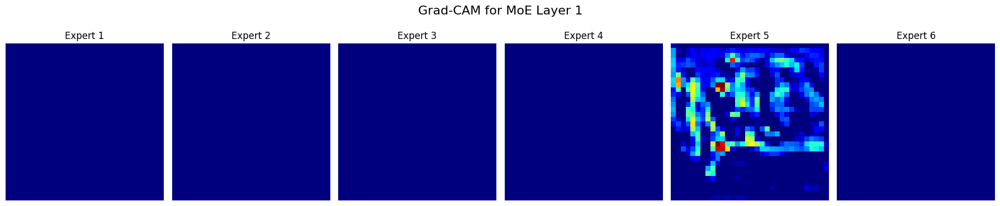

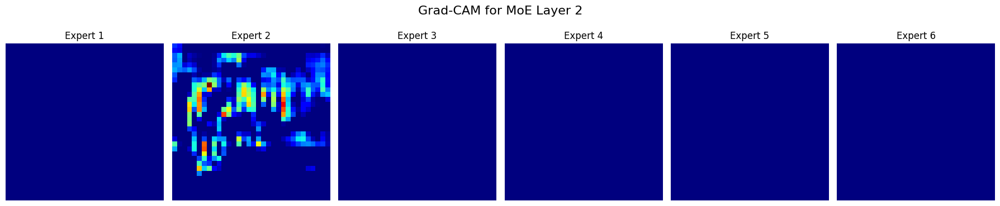

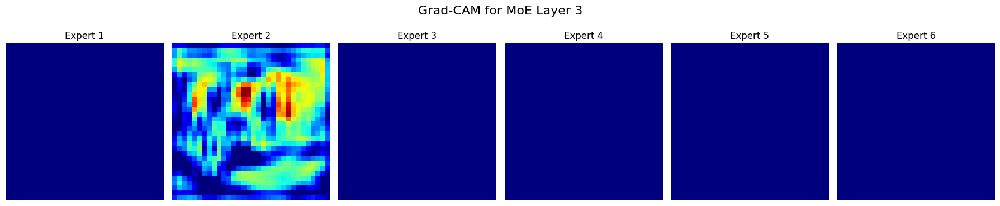

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

# GradCAM helper class.
class GradCAM:
    def __init__(self, model: torch.nn.Module, target_layer: torch.nn.Module):
        """
        Args:
            model: The full model.
            target_layer: The layer from which we want to capture activations and gradients.
        """
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()

    def _register_hooks(self):
        # Hook to capture the forward activations.
        def forward_hook(module, input, output):
            self.activations = output.detach()
        # Hook to capture the gradients on the target layer.
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        handle_forward = self.target_layer.register_forward_hook(forward_hook)
        handle_backward = self.target_layer.register_backward_hook(backward_hook)
        self.hook_handles.extend([handle_forward, handle_backward])

    def __call__(self, input_tensor: torch.Tensor, target_class: int = None):
        """
        Args:
            input_tensor: Input image tensor of shape (1, C, H, W).
            target_class: Target class index for which Grad-CAM is computed. If None, uses the model's prediction.
        Returns:
            cam: The computed Grad-CAM heatmap (numpy array).
        """
        self.model.zero_grad()
        output, _ = self.model(input_tensor)  # get logits (and gating probabilities)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        # Compute the loss for the target class.
        score = output[0, target_class]
        score.backward(retain_graph=True)

        # Global average pooling over the gradients
        weights = self.gradients[0].mean(dim=(1, 2))  # shape: (channels,)

        # Weighted sum of the activations
        cam = torch.zeros(self.activations.shape[2:], device=self.activations.device)
        for i, w in enumerate(weights):
            cam += w * self.activations[0, i, :, :]

        # Apply ReLU and normalize the heatmap.
        cam = F.relu(cam)
        cam -= cam.min()
        if cam.max() != 0:
            cam /= cam.max()
        return cam.cpu().numpy()

    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()

# ---------------------------
# Visualize Grad-CAM for each expert.
# ---------------------------

# Assume you already have your trained model, test_loader, and device defined.
# For example, use the first image from the test set:
model.eval()
sample_images, sample_labels = next(iter(test_loader))
input_tensor = sample_images[0:1].to(device)  # take one image
true_label = sample_labels[0].item()

# Get the predicted class.
with torch.no_grad():
    output, _ = model(input_tensor)
predicted_class = output.argmax(dim=1).item()
print("True label:", true_label, "Predicted label:", predicted_class)

# Dictionary to store Grad-CAM maps for each expert in each MoE layer.
gradcam_maps = {}

# Loop over each MoE block (layer) in the model.
for layer_idx, moe_layer in enumerate(model.layers):
    gradcam_maps[layer_idx] = {}
    # For each expert in the MoE block.
    for expert_idx, expert in enumerate(moe_layer.experts):
        # Here we choose the first layer of the expert (a Conv2d) as the target.
        target_layer = expert[0]
        gradcam = GradCAM(model, target_layer)
        # Compute the Grad-CAM heatmap for the given expert.
        cam_map = gradcam(input_tensor, target_class=predicted_class)
        gradcam_maps[layer_idx][expert_idx] = cam_map
        gradcam.remove_hooks()

# ---------------------------
# Plot the Grad-CAM heatmaps.
# ---------------------------
num_layers = len(gradcam_maps)
num_experts_per_layer = len(gradcam_maps[0])

for layer_idx in range(num_layers):
    fig, axs = plt.subplots(1, num_experts_per_layer, figsize=(3 * num_experts_per_layer, 4))
    fig.suptitle(f"Grad-CAM for MoE Layer {layer_idx+1}", fontsize=16)
    for expert_idx in range(num_experts_per_layer):
        ax = axs[expert_idx] if num_experts_per_layer > 1 else axs
        cam = gradcam_maps[layer_idx][expert_idx]
        # Display the heatmap. Optionally, overlay on the original image.
        ax.imshow(cam, cmap='jet')
        ax.set_title(f"Expert {expert_idx+1}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()


Layer 1 | Forced Expert 1: 54.60% accuracy
Layer 1 | Forced Expert 2: 51.38% accuracy
Layer 1 | Forced Expert 3: 56.49% accuracy
Layer 1 | Forced Expert 4: 56.59% accuracy
Layer 1 | Forced Expert 5: 55.61% accuracy
Layer 1 | Forced Expert 6: 55.71% accuracy
Layer 2 | Forced Expert 1: 53.30% accuracy
Layer 2 | Forced Expert 2: 56.63% accuracy
Layer 2 | Forced Expert 3: 56.02% accuracy
Layer 2 | Forced Expert 4: 56.67% accuracy
Layer 2 | Forced Expert 5: 54.96% accuracy
Layer 2 | Forced Expert 6: 55.59% accuracy
Layer 3 | Forced Expert 1: 54.06% accuracy
Layer 3 | Forced Expert 2: 55.96% accuracy
Layer 3 | Forced Expert 3: 55.55% accuracy
Layer 3 | Forced Expert 4: 55.66% accuracy
Layer 3 | Forced Expert 5: 56.15% accuracy
Layer 3 | Forced Expert 6: 55.69% accuracy


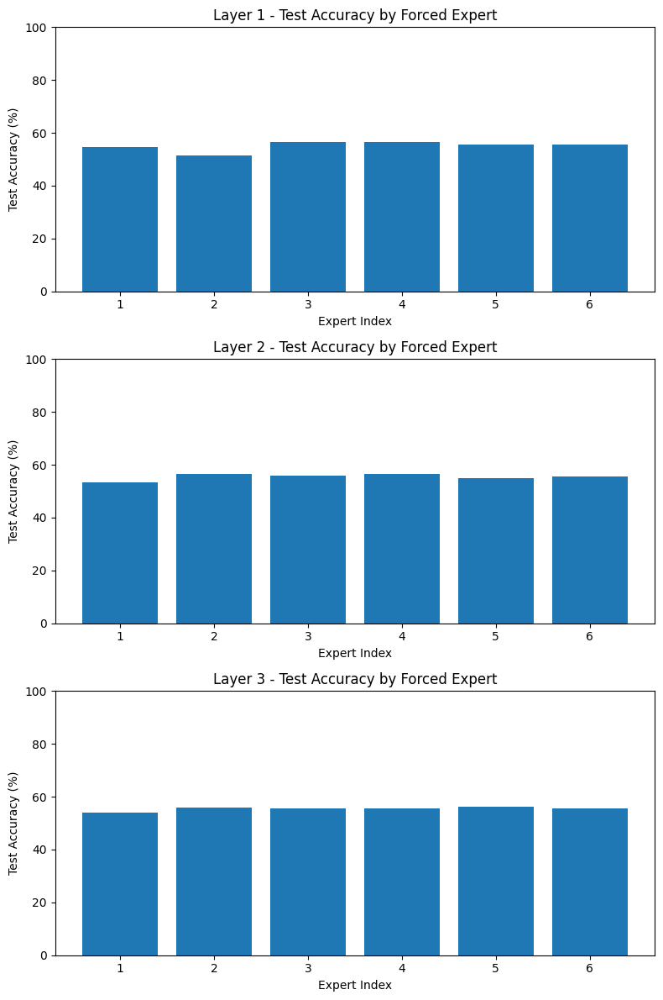

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Helper function to forward an MoE block using only a specified expert.
def forward_force_expert(moe_block, x, expert_idx):
    """
    Instead of using the gating network, force the MoE block to use the expert at expert_idx.

    Args:
        moe_block: An instance of MoEBlock.
        x: Input tensor.
        expert_idx: The index of the expert to use.

    Returns:
        output: The output of the forced expert.
        gating_prob: A dummy gating probability (one-hot) for compatibility.
    """
    # Directly pass x through the specified expert.
    output = moe_block.experts[expert_idx](x)
    batch_size = x.shape[0]
    # Create a one-hot gating probability: 1 for the forced expert, 0 for others.
    gating_prob = torch.zeros(batch_size, moe_block.num_experts, device=x.device)
    gating_prob[:, expert_idx] = 1.0
    return output, gating_prob

# Evaluation function that forces a specific expert at a chosen MoE layer while leaving other layers unchanged.
def evaluate_forced(model, test_loader, forced_layer_idx, forced_expert_idx, device):
    """
    Evaluate the model on the test set while forcing the MoE block at forced_layer_idx to use forced_expert_idx.

    Args:
        model: The trained DeepMoE model.
        test_loader: The test DataLoader.
        forced_layer_idx: Index of the MoE layer to override.
        forced_expert_idx: Expert index to force in that layer.
        device: torch.device

    Returns:
        accuracy: Test accuracy (in percentage) when forcing that expert.
    """
    model.eval()
    total, correct = 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            x = images
            # Loop through each MoE block.
            for i, layer in enumerate(model.layers):
                # For the forced layer, override the forward pass.
                if i == forced_layer_idx:
                    x, _ = forward_force_expert(layer, x, forced_expert_idx)
                else:
                    x, _ = layer(x)
            logits = model.classifier(x)
            preds = logits.argmax(dim=1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()
    return 100 * correct / total

# ------------------------------------------------------------------------------
# Now, assume that you already have your trained model, test_loader, and device defined.
# For example, these are as defined in your training code.
# ------------------------------------------------------------------------------
# For each MoE layer, evaluate the test accuracy when forcing each expert in that layer.
num_layers = len(model.layers)
num_experts = model.layers[0].num_experts  # assuming same number of experts per layer

# Dictionary to store the accuracies.
forced_accuracies = {}

for layer_idx in range(num_layers):
    forced_accuracies[layer_idx] = []
    for expert_idx in range(num_experts):
        acc = evaluate_forced(model, test_loader, forced_layer_idx=layer_idx, forced_expert_idx=expert_idx, device=device)
        forced_accuracies[layer_idx].append(acc)
        print(f"Layer {layer_idx+1} | Forced Expert {expert_idx+1}: {acc:.2f}% accuracy")

# ------------------------------------------------------------------------------
# Plot the results: one bar chart per MoE layer showing the test accuracy when forcing each expert.
fig, axs = plt.subplots(num_layers, 1, figsize=(8, 4 * num_layers), squeeze=False)
for layer_idx in range(num_layers):
    ax = axs[layer_idx, 0]
    experts = list(range(1, num_experts + 1))
    accs = forced_accuracies[layer_idx]
    ax.bar(experts, accs)
    ax.set_xlabel("Expert Index")
    ax.set_ylabel("Test Accuracy (%)")
    ax.set_title(f"Layer {layer_idx+1} - Test Accuracy by Forced Expert")
    ax.set_xticks(experts)
    ax.set_ylim(0, 100)
plt.tight_layout()
plt.show()


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Epoch 1/3, Loss: 1.7503, Penalty: 0.0000, LoadBalanceLoss: 0.0206
Epoch 2/3, Loss: 1.5256, Penalty: 0.0000, LoadBalanceLoss: 0.0265
Epoch 3/3, Loss: 1.4326, Penalty: 0.0000, LoadBalanceLoss: 0.0247
Test Accuracy: 47.35%


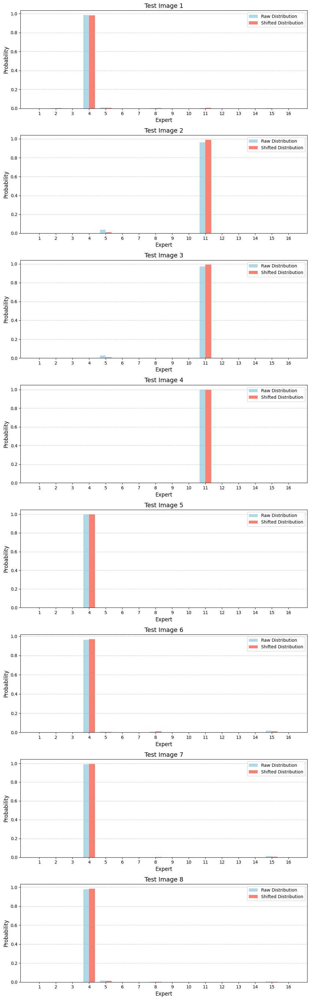

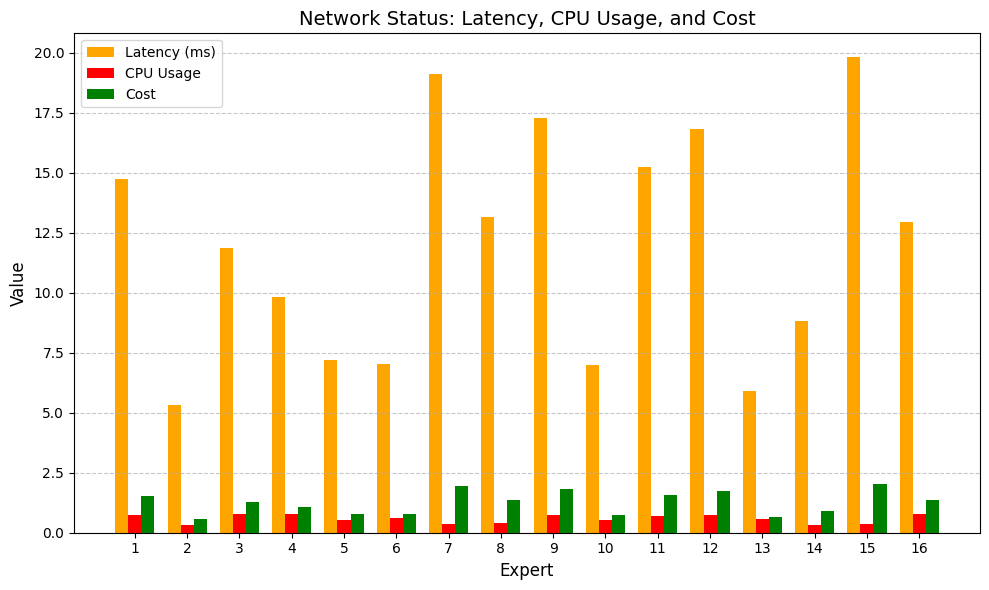

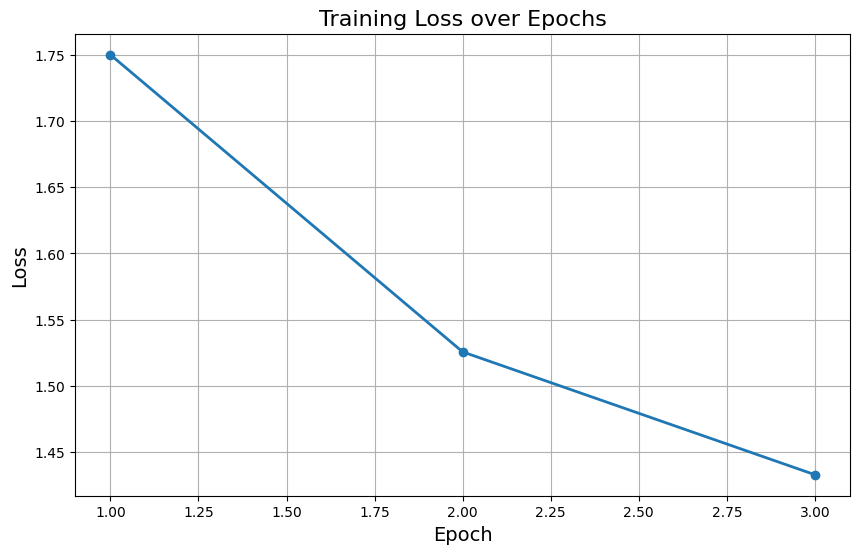

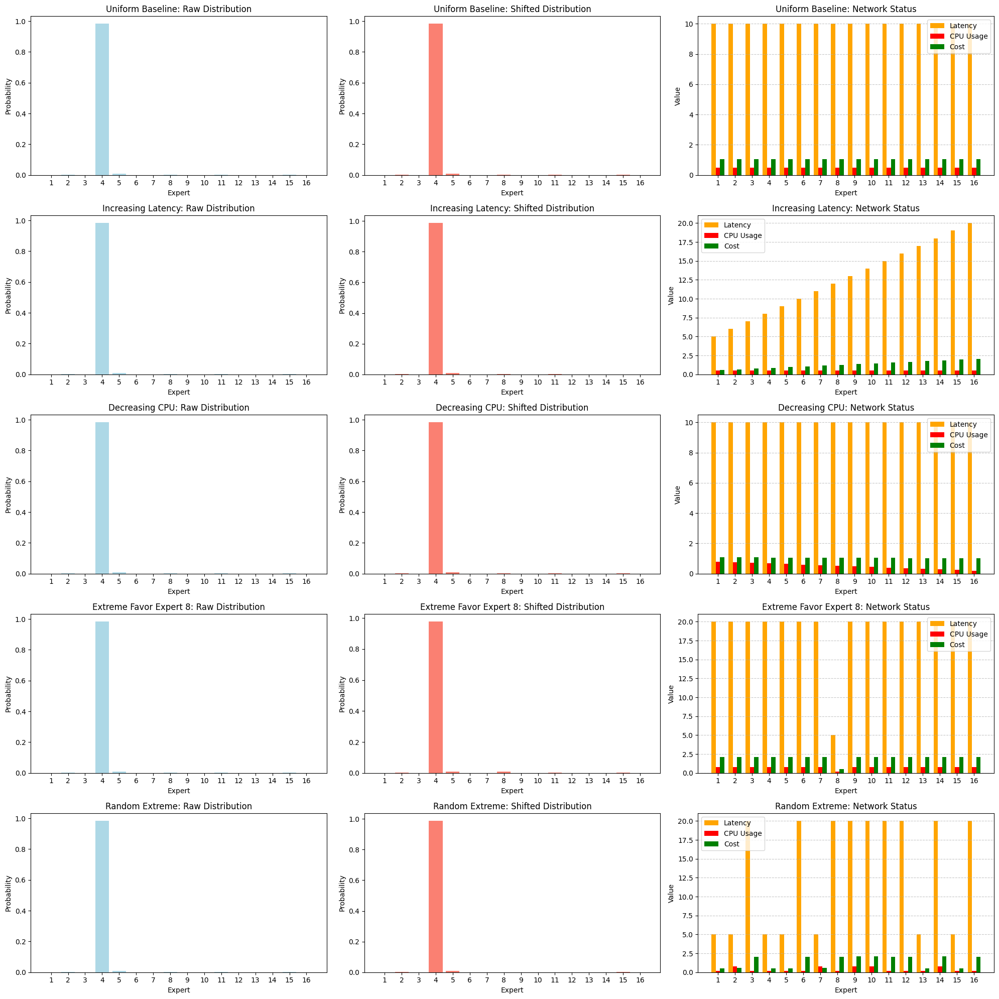

Saved distribution shift results for 100 trials to distribution_shift_test_image_1.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_2.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_3.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_4.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_5.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_6.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_7.csv
Saved distribution shift results for 100 trials to distribution_shift_test_image_8.csv


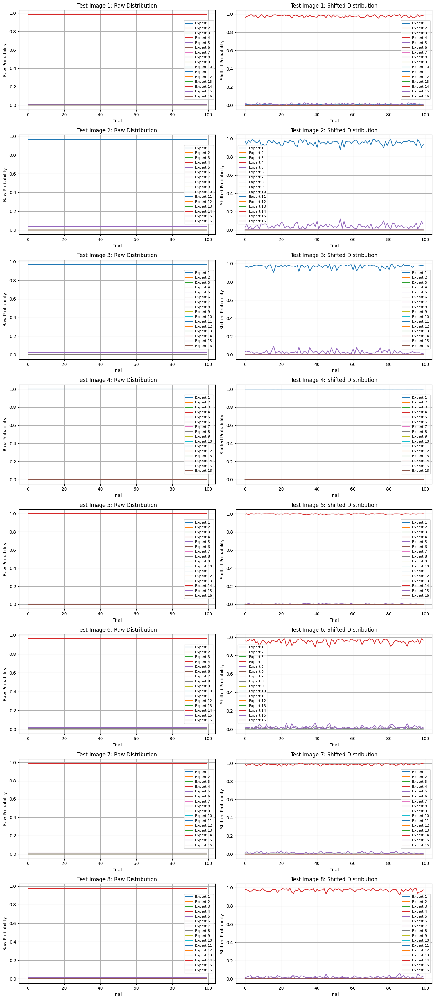

In [ ]:
."""
Updated Mixture of Experts (MoE) for CIFAR10 dataset with CUDA support,
Load Balancing Loss, Monitoring of Conditional Distribution Shift,
Network Status, Enhanced Analysis of Network Situations, Evaluation of Distribution Shift,
and plotting distribution shift results for each test image in the test loader.
"""

import random
import csv
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

class Expert(nn.Module):
    """Expert network that processes input data."""
    def __init__(self, input_dim: int, num_classes: int):
        super(Expert, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class GatingNetwork(nn.Module):
    """Gating network that outputs raw relevance scores."""
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with probabilistic expert selection using
    a conditional distribution shift based on system constraints.
    """
    def __init__(self, num_experts: int, input_dim: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        """
        Args:
            num_experts: Number of expert networks.
            input_dim: Dimension of input features.
            num_classes: Number of output classes.
            alpha1, alpha2: Weights for latency and CPU usage in cost.
            beta: Trade-off parameter for cost in the gating assignment.
            lambda_penalty: Coefficient for the constraint penalty.
            tau: Threshold for the expected cost constraint.
            lambda_balance: Weight for the load balancing loss.
        """
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(input_dim, num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim, num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    experts = list(range(1, len(debug_info["latency"]) + 1))
    bar_width = 0.25
    plt.figure(figsize=(10, 6))
    plt.bar([x - bar_width for x in experts],
            debug_info["latency"],
            width=bar_width,
            label="Latency (ms)",
            color='orange')
    plt.bar(experts,
            debug_info["cpu_usage"],
            width=bar_width,
            label="CPU Usage",
            color='red')
    plt.bar([x + bar_width for x in experts],
            debug_info["cost"],
            width=bar_width,
            label="Cost",
            color='green')
    plt.xlabel("Expert", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.title("Network Status: Latency, CPU Usage, and Cost", fontsize=14)
    plt.xticks(experts)
    plt.legend(fontsize=10)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

def analyze_network_situations(model: nn.Module, scenarios: dict, image: torch.Tensor):
    scenario_names = list(scenarios.keys())
    num_scenarios = len(scenario_names)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_scenarios, 3, figsize=(20, 4 * num_scenarios))
    if num_scenarios == 1:
        axs = [axs]

    for i, scenario in enumerate(scenario_names):
        sim_params = scenarios[scenario]
        with torch.no_grad():
            _, debug_info = model.forward_debug(image, sim_latency=sim_params["latency"], sim_cpu_usage=sim_params["cpu_usage"])

        ax1 = axs[i][0]
        ax1.bar(experts, debug_info["raw_p"][0], color='lightblue')
        ax1.set_title(f"{scenario}: Raw Distribution")
        ax1.set_xlabel("Expert")
        ax1.set_ylabel("Probability")
        ax1.set_xticks(experts)

        ax2 = axs[i][1]
        ax2.bar(experts, debug_info["p"][0], color='salmon')
        ax2.set_title(f"{scenario}: Shifted Distribution")
        ax2.set_xlabel("Expert")
        ax2.set_ylabel("Probability")
        ax2.set_xticks(experts)

        ax3 = axs[i][2]
        bar_width = 0.25
        ax3.bar([x - bar_width for x in experts],
                debug_info["latency"],
                width=bar_width,
                label="Latency",
                color='orange')
        ax3.bar(experts,
                debug_info["cpu_usage"],
                width=bar_width,
                label="CPU Usage",
                color='red')
        ax3.bar([x + bar_width for x in experts],
                debug_info["cost"],
                width=bar_width,
                label="Cost",
                color='green')
        ax3.set_title(f"{scenario}: Network Status")
        ax3.set_xlabel("Expert")
        ax3.set_ylabel("Value")
        ax3.set_xticks(experts)
        ax3.legend(fontsize=10)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("analyze_network_situations.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_distribution_shift(model: nn.Module, image: torch.Tensor, trials: int = 100, filename: str = "distribution_shift_results.csv"):
    """
    Evaluate the distribution shift for a given image over multiple trials, save the results,
    and return the results list.

    For each trial, the function collects:
      - The raw gating distribution (raw_p)
      - The final shifted distribution (p)
      - Expected cost and penalty
    and then writes them to a CSV file.
    """
    results = []
    for t in range(trials):
        with torch.no_grad():
            _, debug_info = model.forward_debug(image)
        raw_p = debug_info["raw_p"][0]      # shape: (num_experts,)
        shifted_p = debug_info["p"][0]        # shape: (num_experts,)
        expected_cost = debug_info["expected_cost"]
        penalty = debug_info["penalty"]
        row = {"trial": t}
        for i, value in enumerate(raw_p):
            row[f"raw_{i+1}"] = value
        for i, value in enumerate(shifted_p):
            row[f"shifted_{i+1}"] = value
        row["expected_cost"] = expected_cost
        row["penalty"] = penalty
        results.append(row)

    fieldnames = ["trial"] + [f"raw_{i+1}" for i in range(model.num_experts)] \
                 + [f"shifted_{i+1}" for i in range(model.num_experts)] \
                 + ["expected_cost", "penalty"]
    with open(filename, "w", newline="") as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for row in results:
            writer.writerow(row)
    print(f"Saved distribution shift results for {trials} trials to {filename}")
    return results

def plot_distribution_shift_results(results: list, num_experts: int):
    """
    Plot the raw and shifted distributions over trials.

    Two subplots are created:
      - Left: Raw distribution for each expert across trials.
      - Right: Shifted distribution for each expert across trials.
    """
    trials = [row["trial"] for row in results]

    plt.figure(figsize=(14, 6))

    # Plot Raw Distribution
    plt.subplot(1, 2, 1)
    for i in range(num_experts):
        prob = [row[f"raw_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Raw Probability")
    plt.title("Raw Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    # Plot Shifted Distribution
    plt.subplot(1, 2, 2)
    for i in range(num_experts):
        prob = [row[f"shifted_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Shifted Probability")
    plt.title("Shifted Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    plt.tight_layout()
    plt.savefig("distribution_shift_trials.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_distribution_shift_for_test_images(model: nn.Module, test_loader, num_images: int = 8, trials: int = 100):
    """
    For a batch from the test loader, evaluate and plot the distribution shift results
    for each image over multiple trials.

    This function creates a figure with `num_images` rows and 2 columns:
      - Left column: Raw distribution over trials for each image.
      - Right column: Shifted distribution over trials for each image.
    """
    model.eval()
    # Get one batch from test_loader
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:num_images].to(next(model.parameters()).device)

    experts = list(range(1, model.num_experts + 1))
    fig, axs = plt.subplots(num_images, 2, figsize=(14, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    for idx in range(num_images):
        single_image = images[idx:idx+1]  # keep batch dimension
        results = evaluate_distribution_shift(model, single_image, trials=trials, filename=f"distribution_shift_test_image_{idx+1}.csv")
        trial_nums = [row["trial"] for row in results]

        # Plot Raw Distribution
        ax_raw = axs[idx][0]
        for i in range(model.num_experts):
            raw_probs = [row[f"raw_{i+1}"] for row in results]
            ax_raw.plot(trial_nums, raw_probs, label=f"Expert {i+1}")
        ax_raw.set_xlabel("Trial")
        ax_raw.set_ylabel("Raw Probability")
        ax_raw.set_title(f"Test Image {idx+1}: Raw Distribution")
        ax_raw.legend(fontsize=8)
        ax_raw.grid(True)

        # Plot Shifted Distribution
        ax_shifted = axs[idx][1]
        for i in range(model.num_experts):
            shifted_probs = [row[f"shifted_{i+1}"] for row in results]
            ax_shifted.plot(trial_nums, shifted_probs, label=f"Expert {i+1}")
        ax_shifted.set_xlabel("Trial")
        ax_shifted.set_ylabel("Shifted Probability")
        ax_shifted.set_title(f"Test Image {idx+1}: Shifted Distribution")
        ax_shifted.legend(fontsize=8)
        ax_shifted.grid(True)

    plt.tight_layout()
    plt.savefig("distribution_shift_test_images.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

def main():
    # Use CUDA if available, else fallback to CPU.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Define CIFAR10 transforms (including normalization)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    # For CIFAR10 images (3x32x32), the flattened input dimension is 3*32*32 = 3072.
    model = MoE(
        num_experts=num_experts,
        input_dim=3 * 32 * 32,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=0.1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 3
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy: {100 * correct / total:.2f}%")

    # Plot gate shift for a few test images.
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)
    plot_training_loss(loss_history, num_epochs)

    scenarios = {
        "Uniform Baseline": {"latency": [10.0] * num_experts, "cpu_usage": [0.5] * num_experts},
        "Increasing Latency": {"latency": [5.0 + 15.0 * (i/(num_experts-1)) for i in range(num_experts)], "cpu_usage": [0.5] * num_experts},
        "Decreasing CPU": {"latency": [10.0] * num_experts, "cpu_usage": [0.8 - 0.6 * (i/(num_experts-1)) for i in range(num_experts)]},
        "Extreme Favor Expert 8": {"latency": [20.0 if i != 7 else 5.0 for i in range(num_experts)], "cpu_usage": [0.8 if i != 7 else 0.2 for i in range(num_experts)]},
        "Random Extreme": {"latency": [random.choice([5.0, 20.0]) for _ in range(num_experts)], "cpu_usage": [random.choice([0.2, 0.8]) for _ in range(num_experts)]}
    }
    test_image = images[:1]
    analyze_network_situations(model, scenarios, test_image)

    # Evaluate and plot the distribution shift results for each image in the test loader.
    plot_distribution_shift_for_test_images(model, test_loader, num_images=8, trials=100)

if __name__ == "__main__":
    main()


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Epoch 1/1, Loss: 1.7966, Penalty: 0.0000, LoadBalanceLoss: 0.0069
Test Accuracy: 44.17%


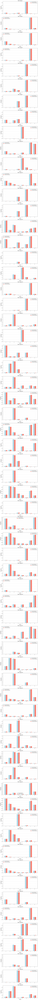

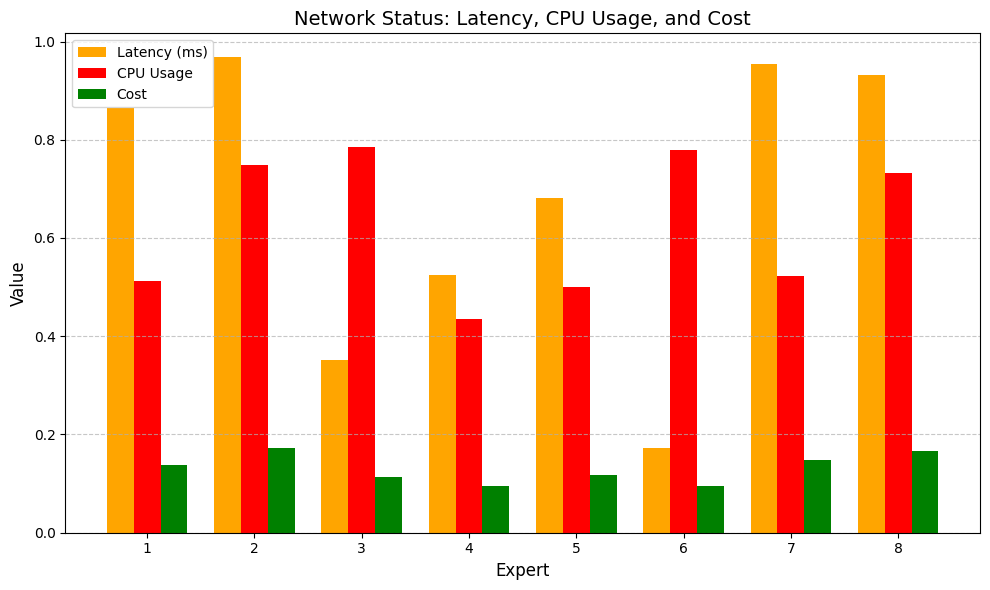

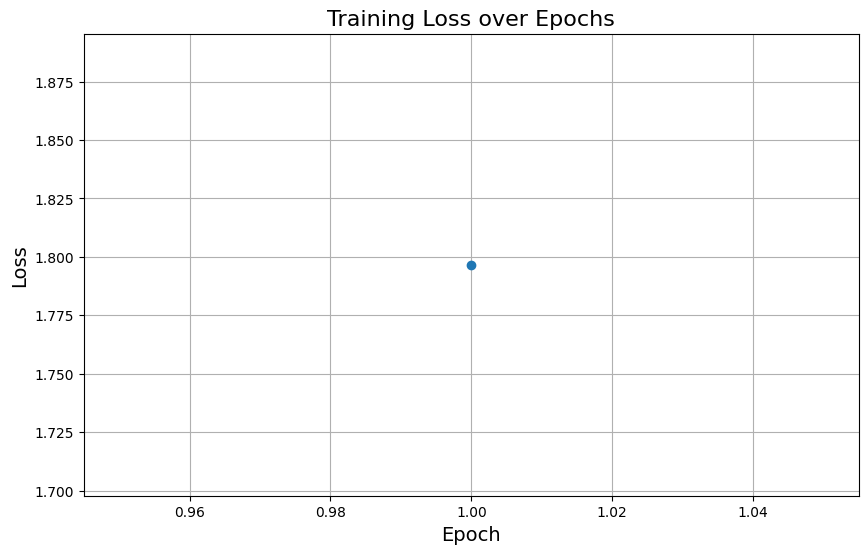

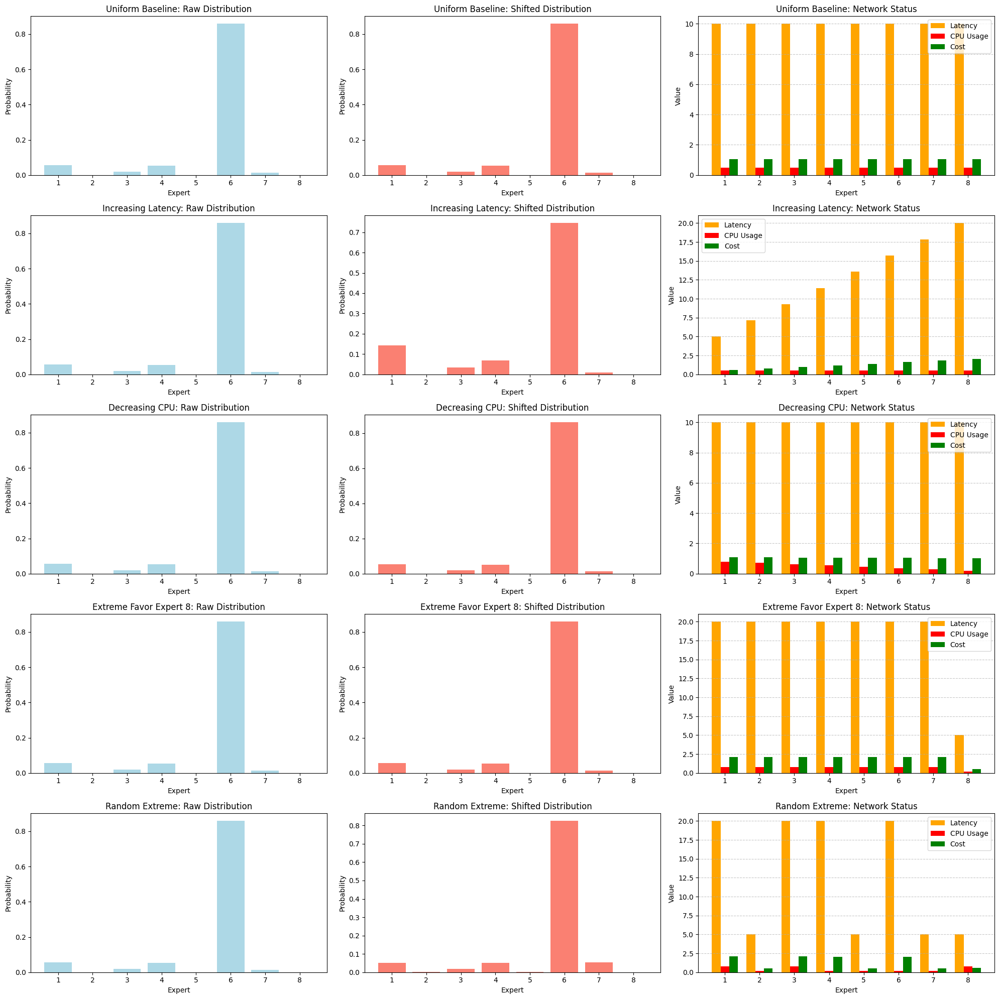

Saved distribution shift results for 100 trials to distribution_shift_results.csv


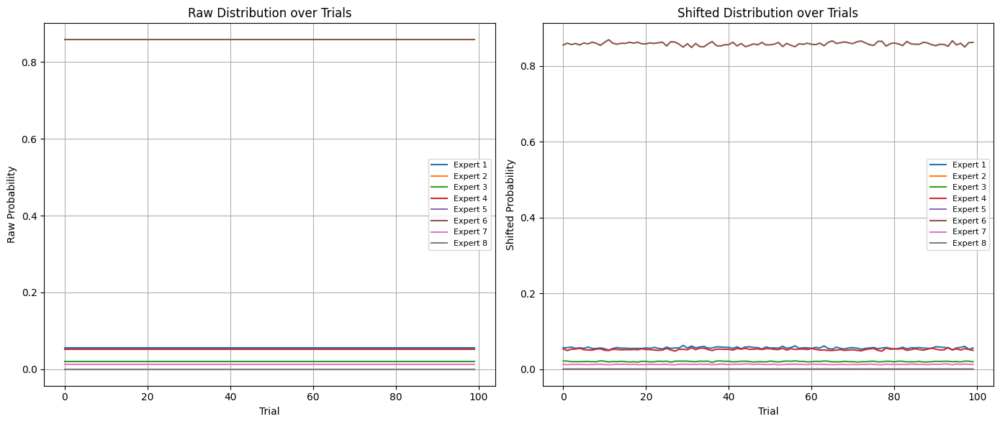

In [ ]:
"""
Updated Mixture of Experts (MoE) for CIFAR10 dataset with CUDA support,
Load Balancing Loss, Monitoring of Conditional Distribution Shift,
Network Status, Enhanced Analysis of Network Situations, and Evaluation of Distribution Shift.
The test images are plotted using the provided snippet.
"""

import random
import csv
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

class Expert(nn.Module):
    """Expert network that processes input data."""
    def __init__(self, input_dim: int, num_classes: int):
        super(Expert, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class GatingNetwork(nn.Module):
    """Gating network that outputs raw relevance scores."""
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with probabilistic expert selection using
    a conditional distribution shift based on system constraints.
    """
    def __init__(self, num_experts: int, input_dim: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        """
        Args:
            num_experts: Number of expert networks.
            input_dim: Dimension of input features.
            num_classes: Number of output classes.
            alpha1, alpha2: Weights for latency and CPU usage in cost.
            beta: Trade-off parameter for cost in the gating assignment.
            lambda_penalty: Coefficient for the constraint penalty.
            tau: Threshold for the expected cost constraint.
            lambda_balance: Weight for the load balancing loss.
        """
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(input_dim, num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim, num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(0.1, 1) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    """
    Plot the raw and shifted gating distributions for a batch of images.
    """
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    experts = list(range(1, len(debug_info["latency"]) + 1))
    bar_width = 0.25
    plt.figure(figsize=(10, 6))
    plt.bar([x - bar_width for x in experts],
            debug_info["latency"],
            width=bar_width,
            label="Latency (ms)",
            color='orange')
    plt.bar(experts,
            debug_info["cpu_usage"],
            width=bar_width,
            label="CPU Usage",
            color='red')
    plt.bar([x + bar_width for x in experts],
            debug_info["cost"],
            width=bar_width,
            label="Cost",
            color='green')
    plt.xlabel("Expert", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.title("Network Status: Latency, CPU Usage, and Cost", fontsize=14)
    plt.xticks(experts)
    plt.legend(fontsize=10)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

def analyze_network_situations(model: nn.Module, scenarios: dict, image: torch.Tensor):
    scenario_names = list(scenarios.keys())
    num_scenarios = len(scenario_names)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_scenarios, 3, figsize=(20, 4 * num_scenarios))
    if num_scenarios == 1:
        axs = [axs]

    for i, scenario in enumerate(scenario_names):
        sim_params = scenarios[scenario]
        with torch.no_grad():
            _, debug_info = model.forward_debug(image, sim_latency=sim_params["latency"], sim_cpu_usage=sim_params["cpu_usage"])

        ax1 = axs[i][0]
        ax1.bar(experts, debug_info["raw_p"][0], color='lightblue')
        ax1.set_title(f"{scenario}: Raw Distribution")
        ax1.set_xlabel("Expert")
        ax1.set_ylabel("Probability")
        ax1.set_xticks(experts)

        ax2 = axs[i][1]
        ax2.bar(experts, debug_info["p"][0], color='salmon')
        ax2.set_title(f"{scenario}: Shifted Distribution")
        ax2.set_xlabel("Expert")
        ax2.set_ylabel("Probability")
        ax2.set_xticks(experts)

        ax3 = axs[i][2]
        bar_width = 0.25
        ax3.bar([x - bar_width for x in experts],
                debug_info["latency"],
                width=bar_width,
                label="Latency",
                color='orange')
        ax3.bar(experts,
                debug_info["cpu_usage"],
                width=bar_width,
                label="CPU Usage",
                color='red')
        ax3.bar([x + bar_width for x in experts],
                debug_info["cost"],
                width=bar_width,
                label="Cost",
                color='green')
        ax3.set_title(f"{scenario}: Network Status")
        ax3.set_xlabel("Expert")
        ax3.set_ylabel("Value")
        ax3.set_xticks(experts)
        ax3.legend(fontsize=10)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("analyze_network_situations.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_distribution_shift(model: nn.Module, image: torch.Tensor, trials: int = 100, filename: str = "distribution_shift_results.csv"):
    """
    Evaluate the distribution shift for a given image over multiple trials, save the results,
    and return the results list.

    For each trial, the function collects:
      - The raw gating distribution (raw_p)
      - The final shifted distribution (p)
      - Expected cost and penalty
    and then writes them to a CSV file.
    """
    results = []
    for t in range(trials):
        with torch.no_grad():
            _, debug_info = model.forward_debug(image)
        raw_p = debug_info["raw_p"][0]      # shape: (num_experts,)
        shifted_p = debug_info["p"][0]        # shape: (num_experts,)
        expected_cost = debug_info["expected_cost"]
        penalty = debug_info["penalty"]
        row = {"trial": t}
        for i, value in enumerate(raw_p):
            row[f"raw_{i+1}"] = value
        for i, value in enumerate(shifted_p):
            row[f"shifted_{i+1}"] = value
        row["expected_cost"] = expected_cost
        row["penalty"] = penalty
        results.append(row)

    fieldnames = ["trial"] + [f"raw_{i+1}" for i in range(model.num_experts)] \
                 + [f"shifted_{i+1}" for i in range(model.num_experts)] \
                 + ["expected_cost", "penalty"]
    with open(filename, "w", newline="") as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for row in results:
            writer.writerow(row)
    print(f"Saved distribution shift results for {trials} trials to {filename}")
    return results

def plot_distribution_shift_results(results: list, num_experts: int):
    """
    Plot the raw and shifted distributions over trials.

    Two subplots are created:
      - Left: Raw distribution for each expert across trials.
      - Right: Shifted distribution for each expert across trials.
    """
    trials = [row["trial"] for row in results]

    plt.figure(figsize=(14, 6))

    # Plot Raw Distribution
    plt.subplot(1, 2, 1)
    for i in range(num_experts):
        prob = [row[f"raw_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Raw Probability")
    plt.title("Raw Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    # Plot Shifted Distribution
    plt.subplot(1, 2, 2)
    for i in range(num_experts):
        prob = [row[f"shifted_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Shifted Probability")
    plt.title("Shifted Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    plt.tight_layout()
    plt.savefig("distribution_shift_trials.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

def main():
    # Use CUDA if available, else fallback to CPU.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Define CIFAR10 transforms (including normalization)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 8
    # For CIFAR10 images (3x32x32), the flattened input dimension is 3*32*32 = 3072.
    model = MoE(
        num_experts=num_experts,
        input_dim=3 * 32 * 32,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=10
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 1
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy: {100 * correct / total:.2f}%")

    # Plot gate shift for a few test images (using the provided snippet).
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:100].to(device)
    plot_gate_shift_for_images(model, images, num_images=100)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)
    plot_training_loss(loss_history, num_epochs)

    scenarios = {
        "Uniform Baseline": {"latency": [10.0] * num_experts, "cpu_usage": [0.5] * num_experts},
        "Increasing Latency": {"latency": [5.0 + 15.0 * (i/(num_experts-1)) for i in range(num_experts)], "cpu_usage": [0.5] * num_experts},
        "Decreasing CPU": {"latency": [10.0] * num_experts, "cpu_usage": [0.8 - 0.6 * (i/(num_experts-1)) for i in range(num_experts)]},
        "Extreme Favor Expert 8": {"latency": [20.0 if i != 7 else 5.0 for i in range(num_experts)], "cpu_usage": [0.8 if i != 7 else 0.2 for i in range(num_experts)]},
        "Random Extreme": {"latency": [random.choice([5.0, 20.0]) for _ in range(num_experts)], "cpu_usage": [random.choice([0.2, 0.8]) for _ in range(num_experts)]}
    }
    test_image = images[:1]
    analyze_network_situations(model, scenarios, test_image)

    # Optionally, evaluate and plot distribution shift results for one image over multiple trials.
    results = evaluate_distribution_shift(model, test_image, trials=100, filename="distribution_shift_results.csv")
    plot_distribution_shift_results(results, num_experts)

if __name__ == "__main__":
    main()


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Epoch 1/3, Loss: 1.7465, Penalty: 0.0000, LoadBalanceLoss: 0.0129
Epoch 2/3, Loss: 1.5135, Penalty: 0.0000, LoadBalanceLoss: 0.0122
Epoch 3/3, Loss: 1.3948, Penalty: 0.0000, LoadBalanceLoss: 0.0096
Test Accuracy: 48.74%


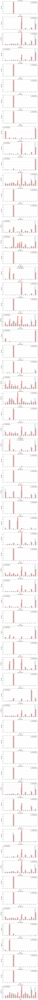

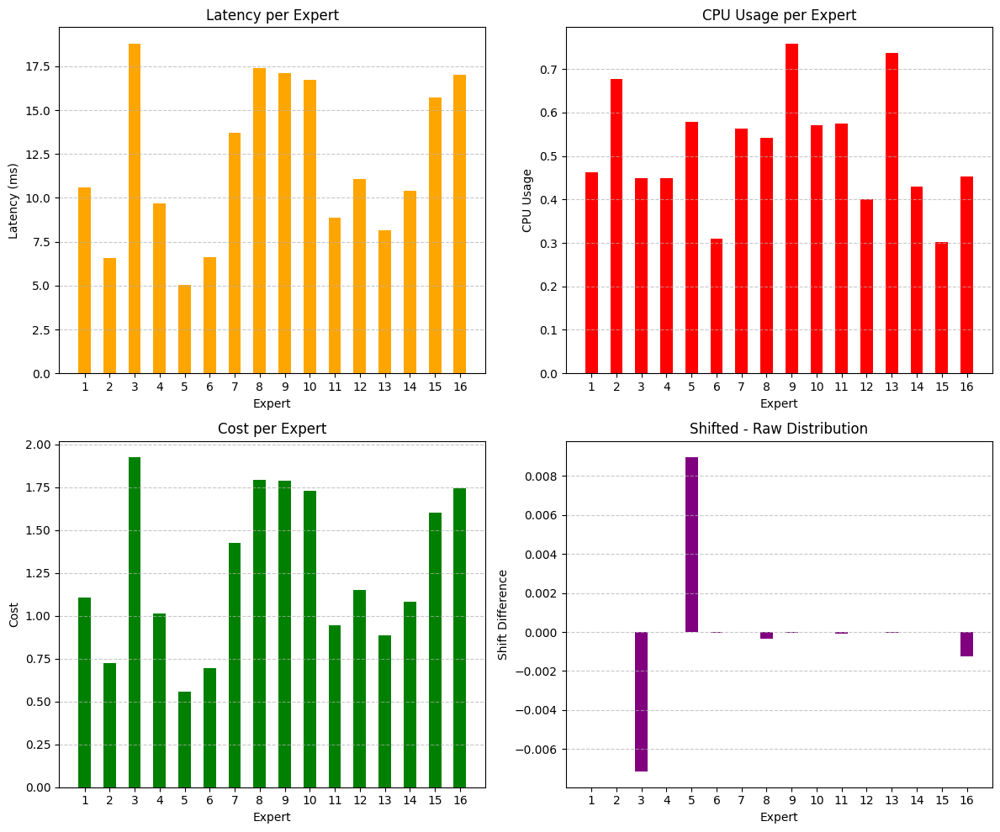

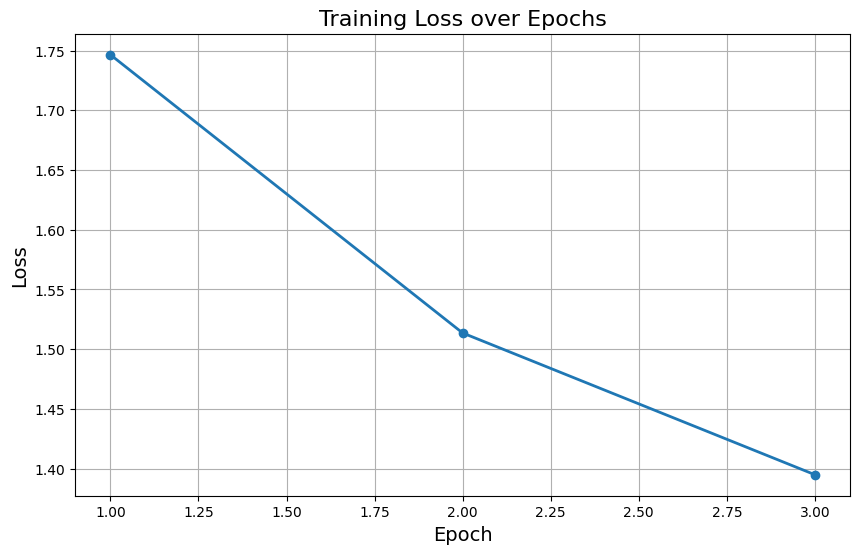

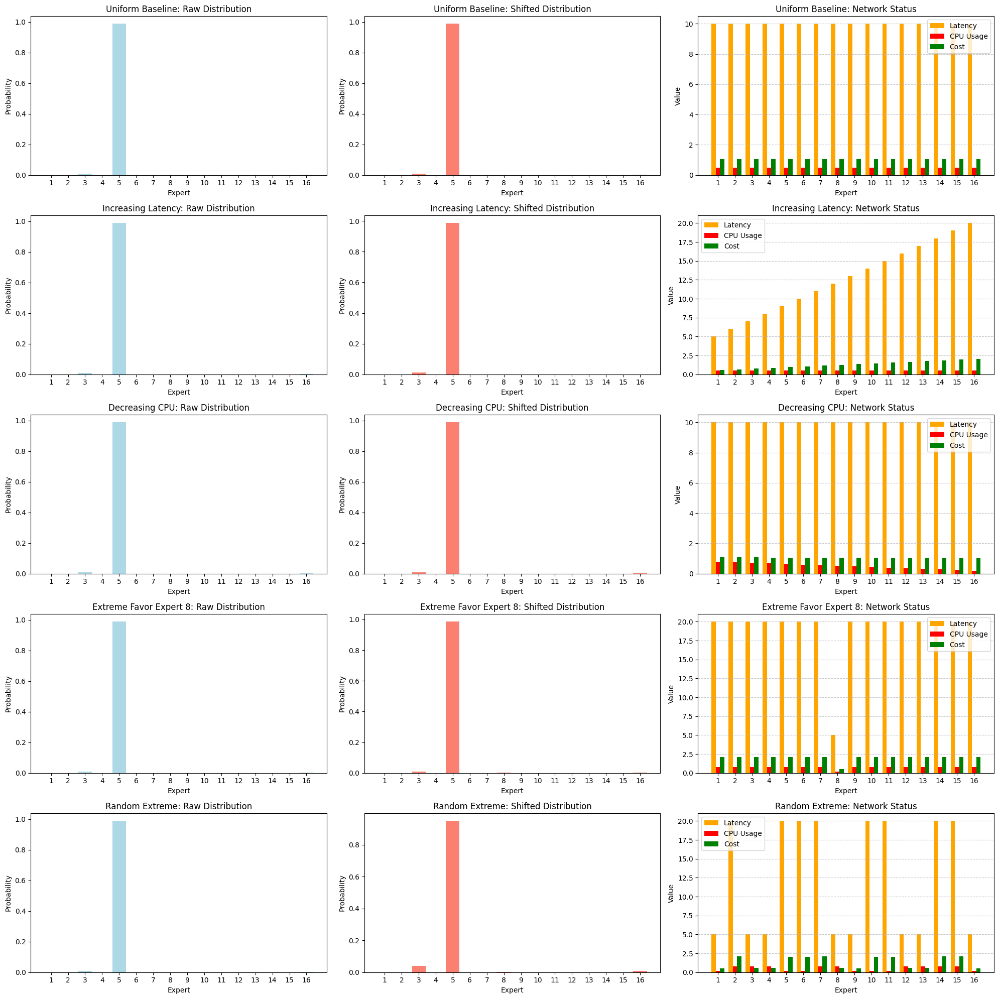

Saved distribution shift results for 100 trials to distribution_shift_results.csv


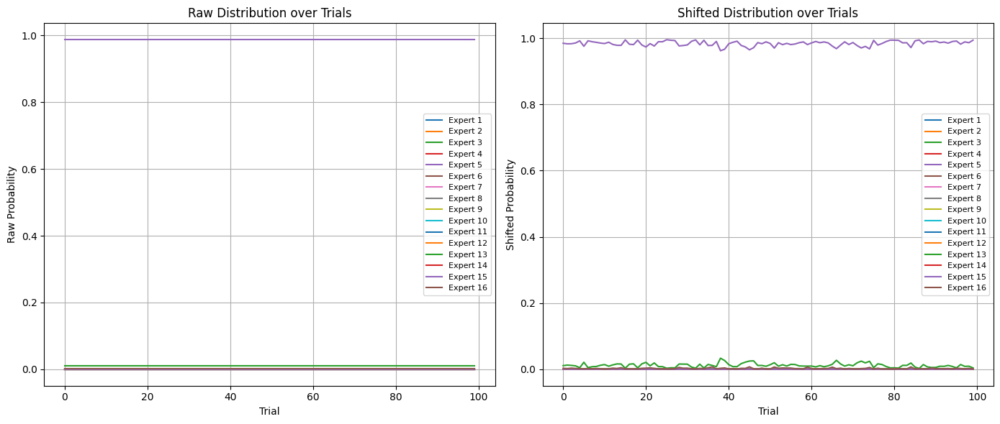

In [ ]:
"""
Updated Mixture of Experts (MoE) for CIFAR10 dataset with CUDA support,
Load Balancing Loss, Monitoring of Conditional Distribution Shift,
Enhanced Analysis of Network Situations, and Evaluation of Distribution Shift.
The network status plotting now includes an extra subplot to display the difference
between the shifted and raw gating distributions for each expert.
"""

import random
import csv
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

class Expert(nn.Module):
    """Expert network that processes input data."""
    def __init__(self, input_dim: int, num_classes: int):
        super(Expert, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class GatingNetwork(nn.Module):
    """Gating network that outputs raw relevance scores."""
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with probabilistic expert selection using
    a conditional distribution shift based on system constraints.
    """
    def __init__(self, num_experts: int, input_dim: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        """
        Args:
            num_experts: Number of expert networks.
            input_dim: Dimension of input features.
            num_classes: Number of output classes.
            alpha1, alpha2: Weights for latency and CPU usage in cost.
            beta: Trade-off parameter for cost in the gating assignment.
            lambda_penalty: Coefficient for the constraint penalty.
            tau: Threshold for the expected cost constraint.
            lambda_balance: Weight for the load balancing loss.
        """
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(input_dim, num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim, num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    """
    Plot the raw and shifted gating distributions for a batch of images.
    """
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    """
    Plot network status metrics along with the distribution shift (difference between shifted and raw probabilities)
    for each expert. Four subplots are created:
      1. Latency
      2. CPU Usage
      3. Cost
      4. Distribution Shift (Shifted - Raw)
    """
    import numpy as np

    experts = list(range(1, len(debug_info["latency"]) + 1))
    # Use the metrics from the first image in the debug info.
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5

    # Latency subplot
    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    # CPU Usage subplot
    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    # Cost subplot
    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    # Distribution Shift subplot
    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

def analyze_network_situations(model: nn.Module, scenarios: dict, image: torch.Tensor):
    scenario_names = list(scenarios.keys())
    num_scenarios = len(scenario_names)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_scenarios, 3, figsize=(20, 4 * num_scenarios))
    if num_scenarios == 1:
        axs = [axs]

    for i, scenario in enumerate(scenario_names):
        sim_params = scenarios[scenario]
        with torch.no_grad():
            _, debug_info = model.forward_debug(image, sim_latency=sim_params["latency"], sim_cpu_usage=sim_params["cpu_usage"])

        ax1 = axs[i][0]
        ax1.bar(experts, debug_info["raw_p"][0], color='lightblue')
        ax1.set_title(f"{scenario}: Raw Distribution")
        ax1.set_xlabel("Expert")
        ax1.set_ylabel("Probability")
        ax1.set_xticks(experts)

        ax2 = axs[i][1]
        ax2.bar(experts, debug_info["p"][0], color='salmon')
        ax2.set_title(f"{scenario}: Shifted Distribution")
        ax2.set_xlabel("Expert")
        ax2.set_ylabel("Probability")
        ax2.set_xticks(experts)

        ax3 = axs[i][2]
        bar_width = 0.25
        ax3.bar([x - bar_width for x in experts],
                debug_info["latency"],
                width=bar_width,
                label="Latency",
                color='orange')
        ax3.bar(experts,
                debug_info["cpu_usage"],
                width=bar_width,
                label="CPU Usage",
                color='red')
        ax3.bar([x + bar_width for x in experts],
                debug_info["cost"],
                width=bar_width,
                label="Cost",
                color='green')
        ax3.set_title(f"{scenario}: Network Status")
        ax3.set_xlabel("Expert")
        ax3.set_ylabel("Value")
        ax3.set_xticks(experts)
        ax3.legend(fontsize=10)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("analyze_network_situations.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_distribution_shift(model: nn.Module, image: torch.Tensor, trials: int = 100, filename: str = "distribution_shift_results.csv"):
    """
    Evaluate the distribution shift for a given image over multiple trials, save the results,
    and return the results list.

    For each trial, the function collects:
      - The raw gating distribution (raw_p)
      - The final shifted distribution (p)
      - Expected cost and penalty
    and then writes them to a CSV file.
    """
    results = []
    for t in range(trials):
        with torch.no_grad():
            _, debug_info = model.forward_debug(image)
        raw_p = debug_info["raw_p"][0]      # shape: (num_experts,)
        shifted_p = debug_info["p"][0]        # shape: (num_experts,)
        expected_cost = debug_info["expected_cost"]
        penalty = debug_info["penalty"]
        row = {"trial": t}
        for i, value in enumerate(raw_p):
            row[f"raw_{i+1}"] = value
        for i, value in enumerate(shifted_p):
            row[f"shifted_{i+1}"] = value
        row["expected_cost"] = expected_cost
        row["penalty"] = penalty
        results.append(row)

    fieldnames = ["trial"] + [f"raw_{i+1}" for i in range(model.num_experts)] \
                 + [f"shifted_{i+1}" for i in range(model.num_experts)] \
                 + ["expected_cost", "penalty"]
    with open(filename, "w", newline="") as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for row in results:
            writer.writerow(row)
    print(f"Saved distribution shift results for {trials} trials to {filename}")
    return results

def plot_distribution_shift_results(results: list, num_experts: int):
    """
    Plot the raw and shifted distributions over trials.

    Two subplots are created:
      - Left: Raw distribution for each expert across trials.
      - Right: Shifted distribution for each expert across trials.
    """
    trials = [row["trial"] for row in results]

    plt.figure(figsize=(14, 6))

    # Plot Raw Distribution
    plt.subplot(1, 2, 1)
    for i in range(num_experts):
        prob = [row[f"raw_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Raw Probability")
    plt.title("Raw Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    # Plot Shifted Distribution
    plt.subplot(1, 2, 2)
    for i in range(num_experts):
        prob = [row[f"shifted_{i+1}"] for row in results]
        plt.plot(trials, prob, label=f"Expert {i+1}")
    plt.xlabel("Trial")
    plt.ylabel("Shifted Probability")
    plt.title("Shifted Distribution over Trials")
    plt.legend(fontsize=8)
    plt.grid(True)

    plt.tight_layout()
    plt.savefig("distribution_shift_trials.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_training_loss(loss_history: list, num_epochs: int):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs", fontsize=16)
    plt.xlabel("Epoch", fontsize=14)
    plt.ylabel("Loss", fontsize=14)
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

def main():
    # Use CUDA if available, else fallback to CPU.
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Define CIFAR10 transforms (including normalization)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    # For CIFAR10 images (3x32x32), the flattened input dimension is 3*32*32 = 3072.
    model = MoE(
        num_experts=num_experts,
        input_dim=3 * 32 * 32,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=0.1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 3
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy: {100 * correct / total:.2f}%")

    # Plot gate shift for a few test images (using the provided snippet).
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:100].to(device)
    plot_gate_shift_for_images(model, images, num_images=100)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)
    plot_training_loss(loss_history, num_epochs)

    scenarios = {
        "Uniform Baseline": {"latency": [10.0] * num_experts, "cpu_usage": [0.5] * num_experts},
        "Increasing Latency": {"latency": [5.0 + 15.0 * (i/(num_experts-1)) for i in range(num_experts)], "cpu_usage": [0.5] * num_experts},
        "Decreasing CPU": {"latency": [10.0] * num_experts, "cpu_usage": [0.8 - 0.6 * (i/(num_experts-1)) for i in range(num_experts)]},
        "Extreme Favor Expert 8": {"latency": [20.0 if i != 7 else 5.0 for i in range(num_experts)], "cpu_usage": [0.8 if i != 7 else 0.2 for i in range(num_experts)]},
        "Random Extreme": {"latency": [random.choice([5.0, 20.0]) for _ in range(num_experts)], "cpu_usage": [random.choice([0.2, 0.8]) for _ in range(num_experts)]}
    }
    test_image = images[:1]
    analyze_network_situations(model, scenarios, test_image)

    # Optionally, evaluate and plot distribution shift results for one image over multiple trials.
    results = evaluate_distribution_shift(model, test_image, trials=100, filename="distribution_shift_results.csv")
    plot_distribution_shift_results(results, num_experts)

if __name__ == "__main__":
    main()


Using device: cuda


100%|██████████| 170M/170M [00:03<00:00, 44.1MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Epoch 1/3, Loss: 1.7568, Penalty: 0.0000, LoadBalanceLoss: 0.0259
Epoch 2/3, Loss: 1.5228, Penalty: 0.0000, LoadBalanceLoss: 0.0271
Epoch 3/3, Loss: 1.4246, Penalty: 0.0000, LoadBalanceLoss: 0.0271
Test Accuracy (MoE): 47.37%


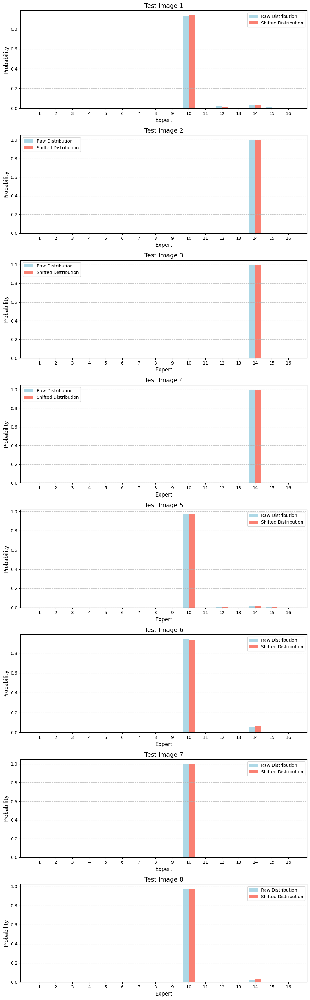

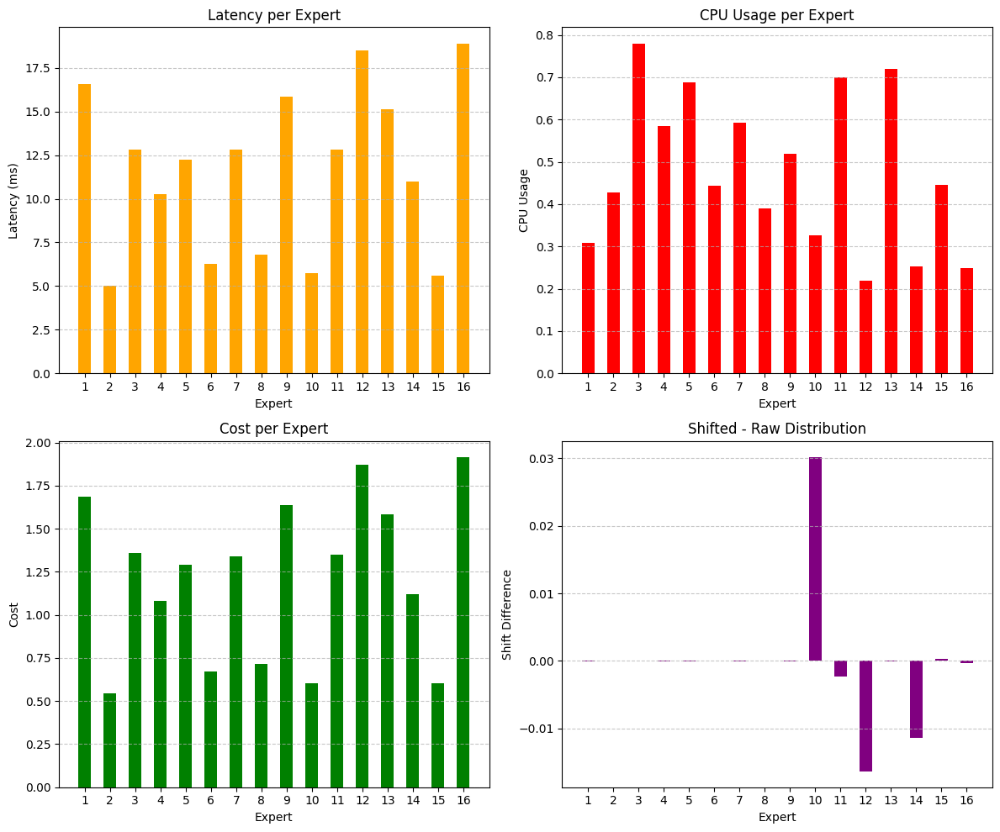

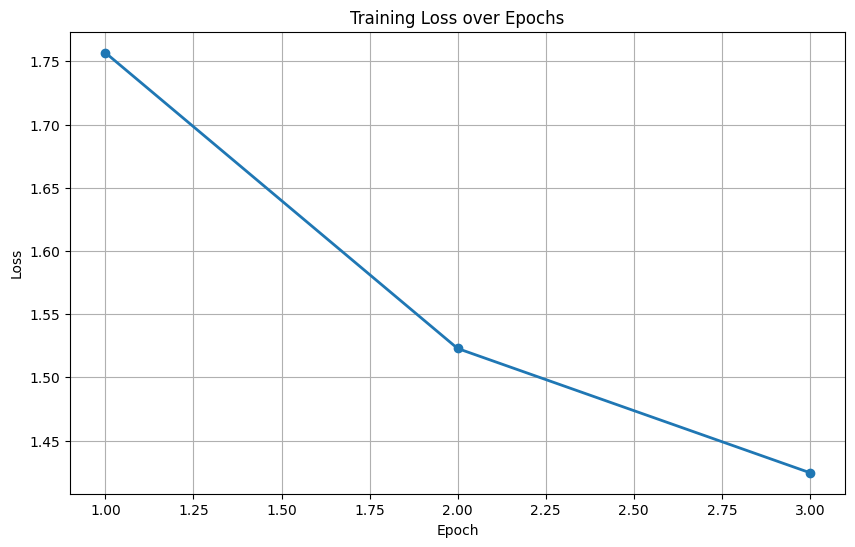

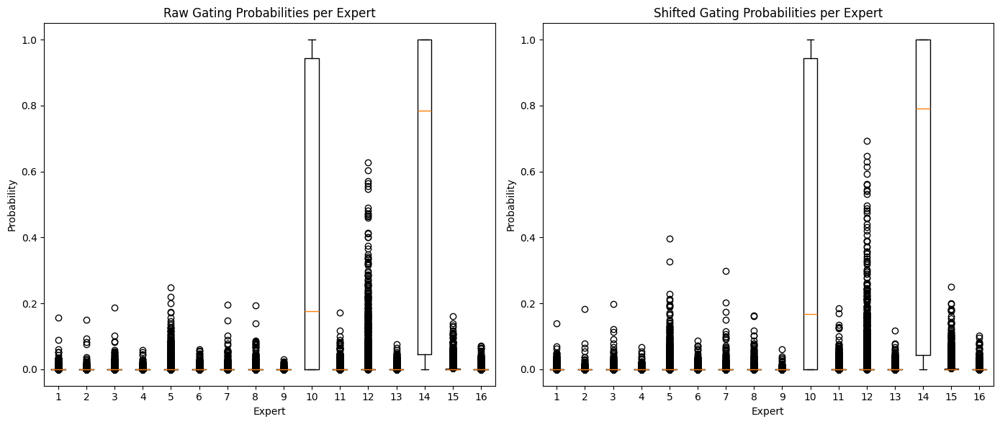

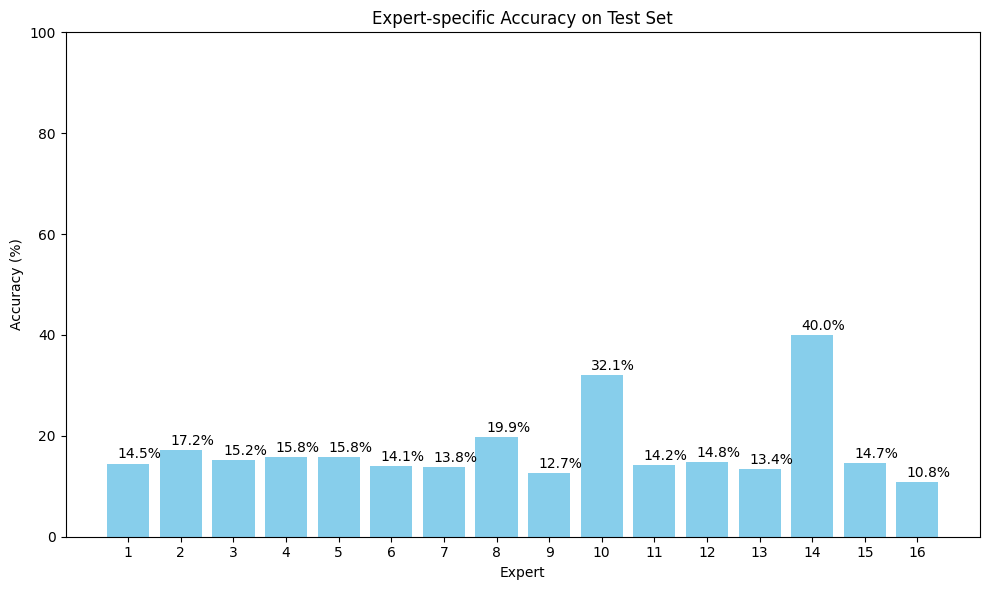

Expert-specific accuracies (%): [14.51, 17.17, 15.25, 15.77, 15.85, 14.08, 13.82, 19.86, 12.66, 32.15, 14.22, 14.81, 13.37, 40.0, 14.66, 10.81]


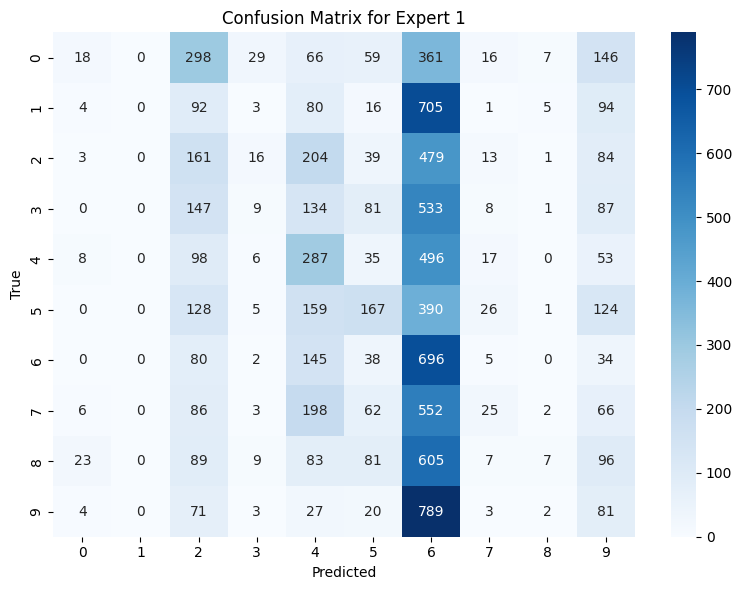

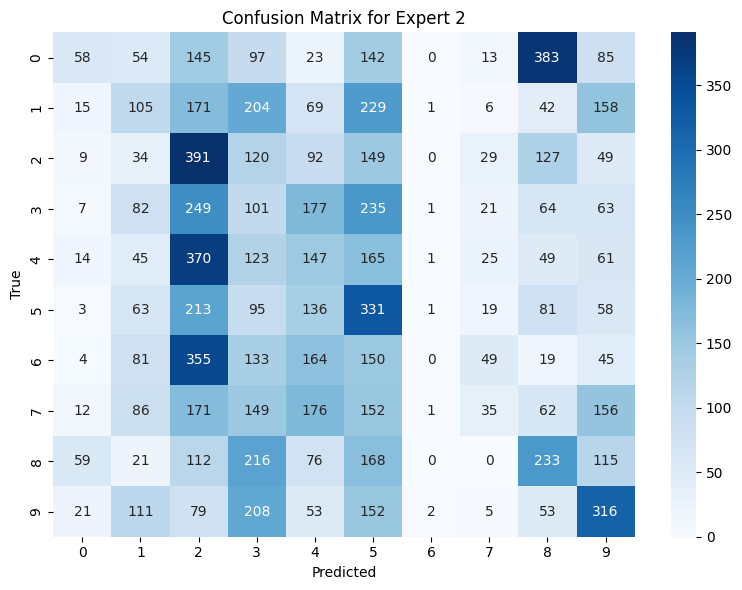

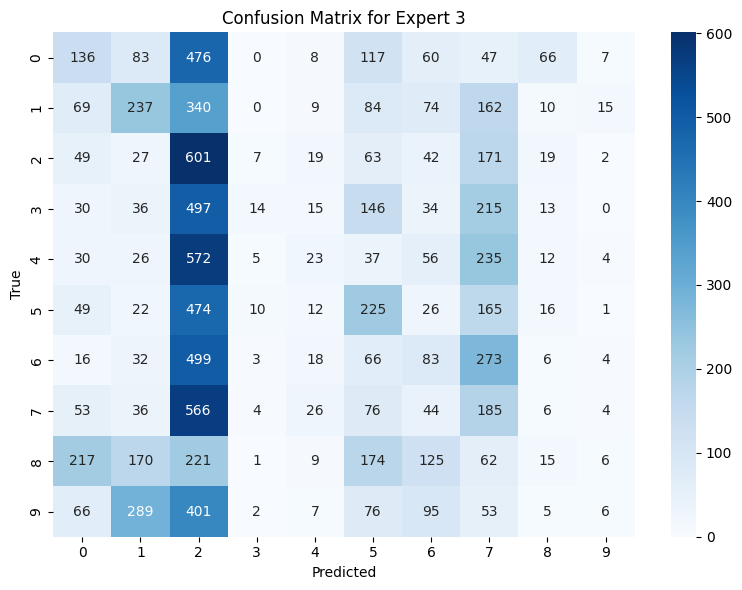

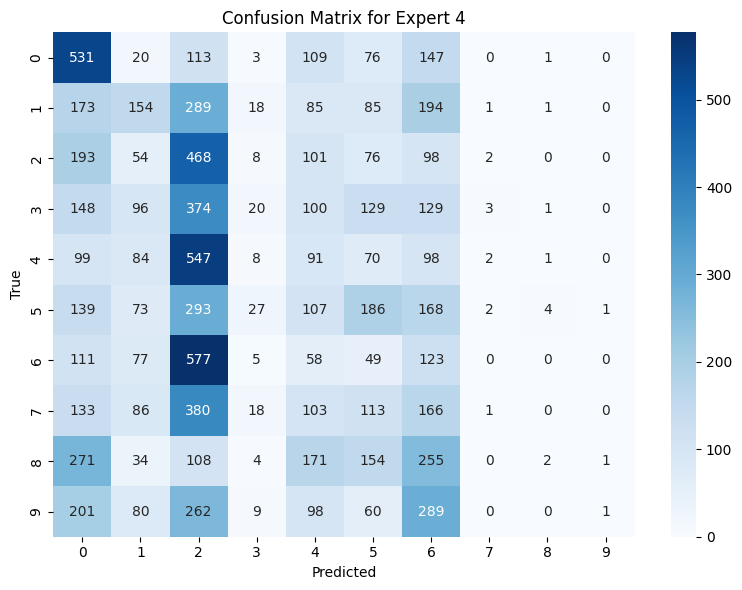

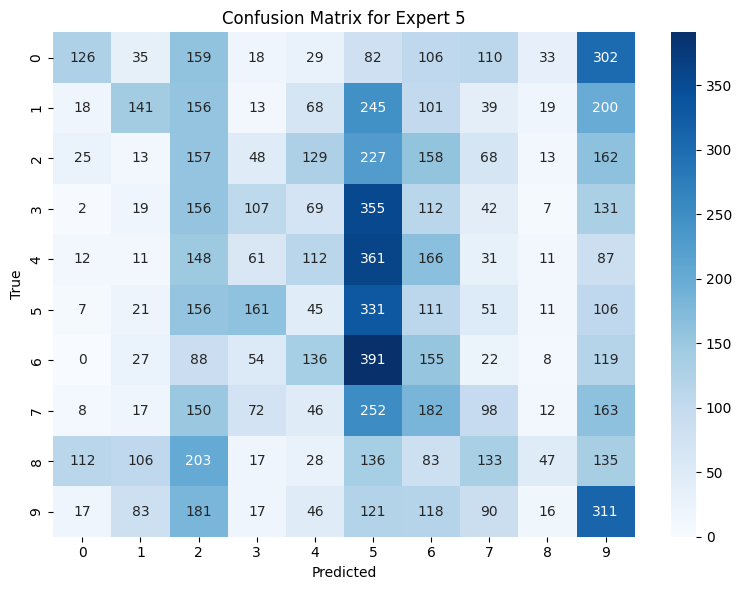

...

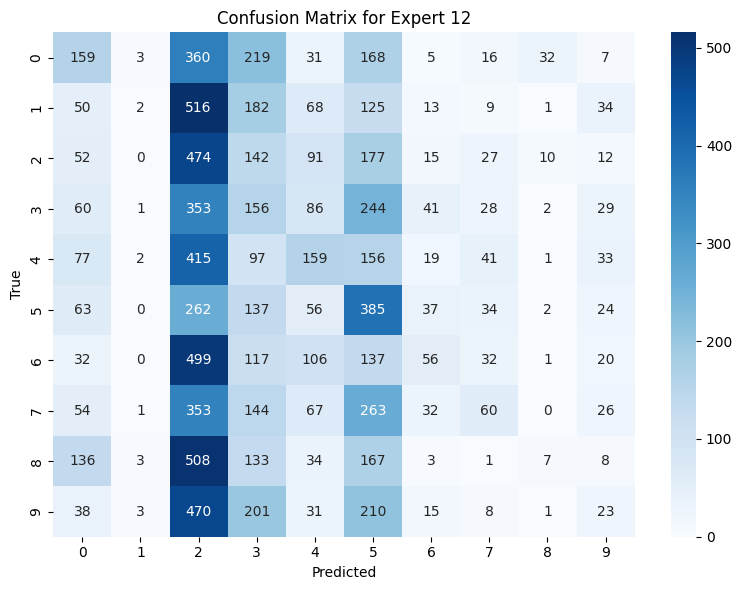

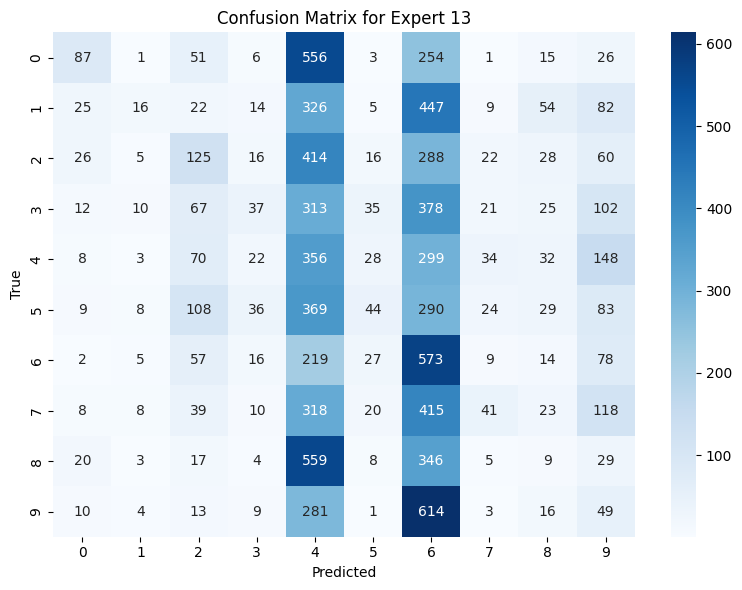

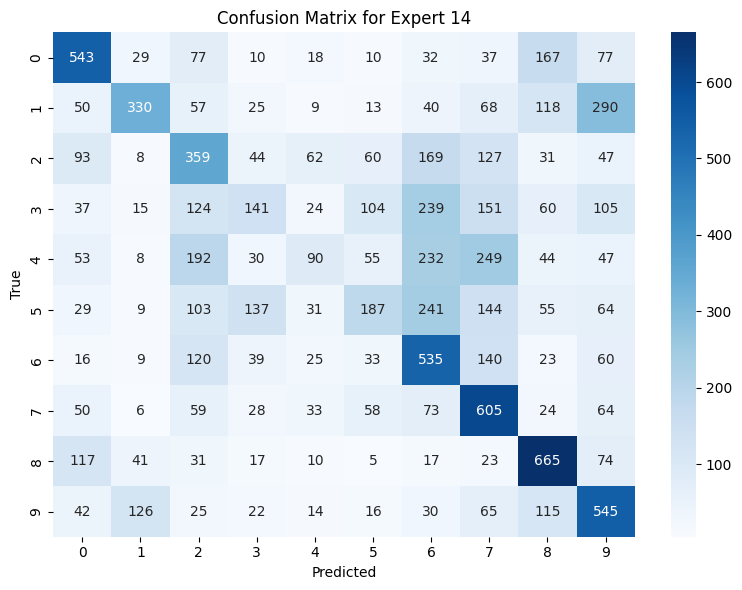

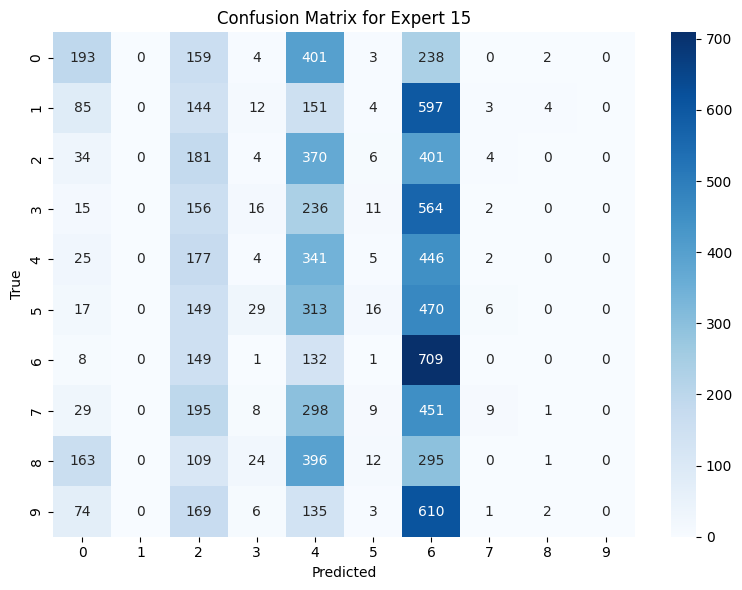

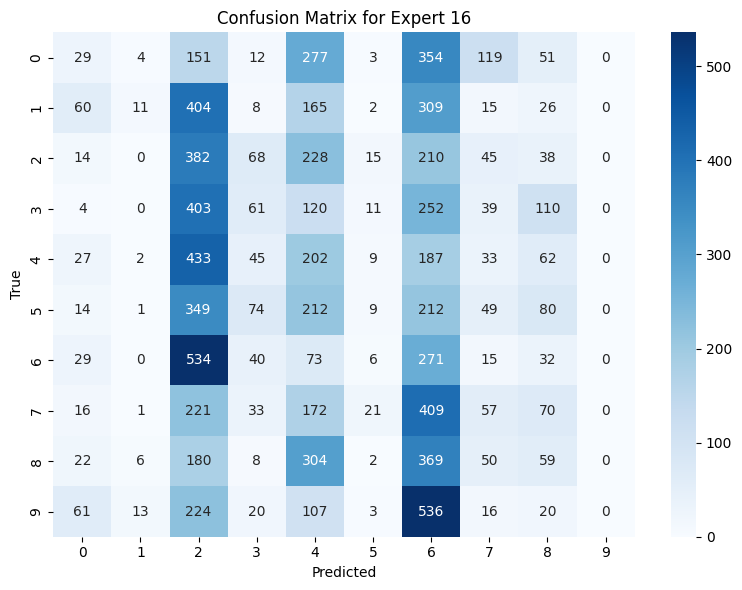

In [ ]:
"""
Extended Mixture of Experts (MoE) for CIFAR10 dataset with additional expert analysis:
1. Gating Distribution Statistics (box plots for raw and shifted probabilities).
2. Expert-specific Accuracy (accuracy for each expert used alone).
3. Class-wise Contribution (confusion matrices per expert).

The code uses CUDA if available.
"""

import random
import csv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ------------------------
# Model definitions
# ------------------------

class Expert(nn.Module):
    """Expert network that processes input data."""
    def __init__(self, input_dim: int, num_classes: int):
        super(Expert, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class GatingNetwork(nn.Module):
    """Gating network that outputs raw relevance scores."""
    def __init__(self, input_dim: int, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with probabilistic expert selection using
    a conditional distribution shift based on system constraints.
    """
    def __init__(self, num_experts: int, input_dim: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(input_dim, num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(input_dim, num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

# ------------------------
# Analysis Functions
# ------------------------

def plot_gating_distribution_statistics(model: nn.Module, test_loader, device):
    """
    For the entire test set, collect raw and shifted gating probabilities and
    plot box plots to show their distributions per expert.
    """
    model.eval()
    all_raw = []
    all_shifted = []

    with torch.no_grad():
        for images, _ in test_loader:
            images = images.to(device)
            # Get debug info for the batch
            _, debug_info = model.forward_debug(images)
            all_raw.append(debug_info['raw_p'])
            all_shifted.append(debug_info['p'])

    # Concatenate the probabilities for each batch
    all_raw = np.concatenate(all_raw, axis=0)  # shape: [N, num_experts]
    all_shifted = np.concatenate(all_shifted, axis=0)
    num_experts = model.num_experts

    # Plot box plots for raw and shifted probabilities per expert
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].boxplot([all_raw[:, i] for i in range(num_experts)])
    axs[0].set_title("Raw Gating Probabilities per Expert")
    axs[0].set_xlabel("Expert")
    axs[0].set_ylabel("Probability")
    axs[0].set_xticklabels(list(range(1, num_experts+1)))

    axs[1].boxplot([all_shifted[:, i] for i in range(num_experts)])
    axs[1].set_title("Shifted Gating Probabilities per Expert")
    axs[1].set_xlabel("Expert")
    axs[1].set_ylabel("Probability")
    axs[1].set_xticklabels(list(range(1, num_experts+1)))

    plt.tight_layout()
    plt.savefig("gating_distribution_statistics.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_expert_accuracy(model: nn.Module, test_loader, device):
    """
    Evaluate the accuracy of each expert individually on the test set.
    For each expert, we compute predictions using the expert network alone.
    """
    model.eval()
    num_experts = model.num_experts
    correct = [0] * num_experts
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0)
            # For each expert, compute its predictions
            for i, expert in enumerate(model.experts):
                outputs = expert(images)  # each expert processes the image
                _, predicted = torch.max(outputs, 1)
                correct[i] += (predicted == labels).sum().item()
    accuracy = [100.0 * c / total for c in correct]

    # Plot accuracy per expert
    experts = list(range(1, num_experts+1))
    plt.figure(figsize=(10,6))
    plt.bar(experts, accuracy, color='skyblue')
    plt.xlabel("Expert")
    plt.ylabel("Accuracy (%)")
    plt.title("Expert-specific Accuracy on Test Set")
    plt.xticks(experts)
    plt.ylim(0, 100)
    for i, acc in enumerate(accuracy):
        plt.text(experts[i] - 0.2, acc + 1, f"{acc:.1f}%", fontsize=10)
    plt.tight_layout()
    plt.savefig("expert_accuracy.png", dpi=300, bbox_inches="tight")
    plt.show()

    return accuracy

def plot_expert_confusion_matrices(model: nn.Module, test_loader, device):
    """
    Compute and plot a confusion matrix for each expert based on its predictions.
    """
    model.eval()
    num_experts = model.num_experts
    expert_preds = [[] for _ in range(num_experts)]
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            all_labels.extend(labels.cpu().numpy())
            # For each expert, get predictions
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                expert_preds[i].extend(predicted.cpu().numpy())

    # Plot confusion matrix for each expert
    for i in range(num_experts):
        cm = confusion_matrix(all_labels, expert_preds[i])
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix for Expert {i+1}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_expert_{i+1}.png", dpi=300, bbox_inches="tight")
        plt.show()

# ------------------------
# Other functions (plot_gate_shift_for_images, plot_network_status, etc.)
# (Same as your previous definitions.)
# ------------------------

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    """
    Plot network status metrics along with the distribution shift (difference between shifted and raw probabilities)
    for each expert.
    """
    experts = list(range(1, len(debug_info["latency"]) + 1))
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5

    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------
# Main training and evaluation
# ------------------------

def main():
    # Use CUDA if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    model = MoE(
        num_experts=num_experts,
        input_dim=3 * 32 * 32,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=0.1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 3
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy (MoE): {100 * correct / total:.2f}%")

    # Plot gate shift for test images
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)

    # Plot training loss over epochs
    plt.figure(figsize=(10,6))
    plt.plot(range(1, num_epochs+1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

    # ------------------------
    # Expert Utilization Analysis
    # ------------------------

    # 1. Gating Distribution Statistics over the test set
    plot_gating_distribution_statistics(model, test_loader, device)

    # 2. Expert-specific Accuracy
    expert_accuracies = evaluate_expert_accuracy(model, test_loader, device)
    print("Expert-specific accuracies (%):", expert_accuracies)

    # 3. Class-wise Contribution (Confusion Matrices for each expert)
    plot_expert_confusion_matrices(model, test_loader, device)

if __name__ == "__main__":
    main()


# Stronger version model of the above code


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Epoch 1/10, Loss: 1.2831, Penalty: 0.0000, LoadBalanceLoss: 0.0040
Epoch 2/10, Loss: 0.8893, Penalty: 0.0000, LoadBalanceLoss: 0.0016
Epoch 3/10, Loss: 0.7045, Penalty: 0.0000, LoadBalanceLoss: 0.0020
Epoch 4/10, Loss: 0.5421, Penalty: 0.0000, LoadBalanceLoss: 0.0028
Epoch 5/10, Loss: 0.4016, Penalty: 0.0000, LoadBalanceLoss: 0.0029
Epoch 6/10, Loss: 0.2775, Penalty: 0.0000, LoadBalanceLoss: 0.0022
Epoch 7/10, Loss: 0.1872, Penalty: 0.0000, LoadBalanceLoss: 0.0023
Epoch 8/10, Loss: 0.1354, Penalty: 0.0000, LoadBalanceLoss: 0.0019
Epoch 9/10, Loss: 0.1005, Penalty: 0.0000, LoadBalanceLoss: 0.0022
Epoch 10/10, Loss: 0.0810, Penalty: 0.0000, LoadBalanceLoss: 0.0018
Test Accuracy (MoE): 74.52%


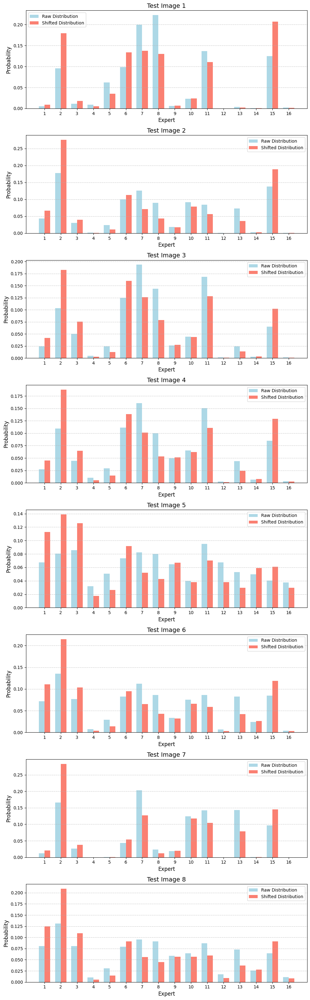

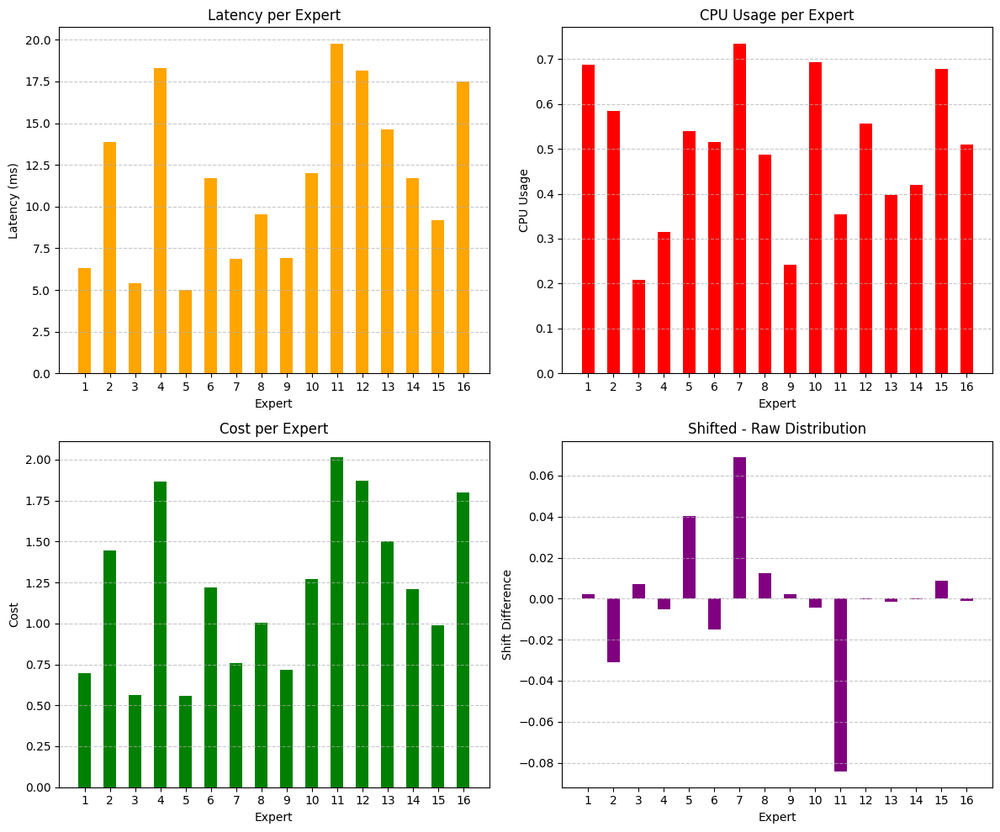

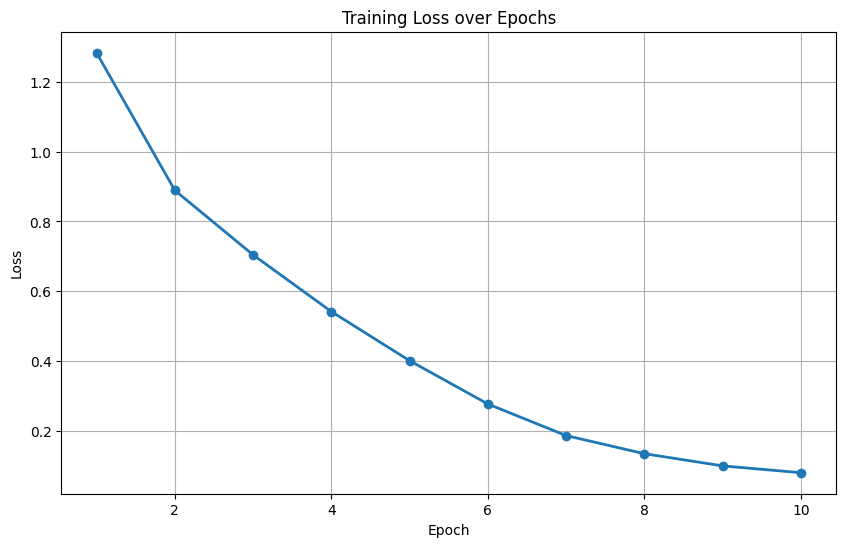

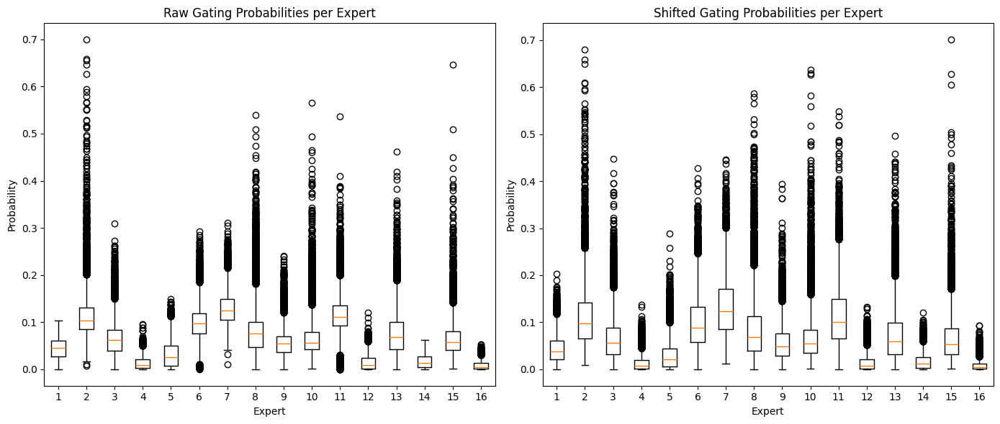

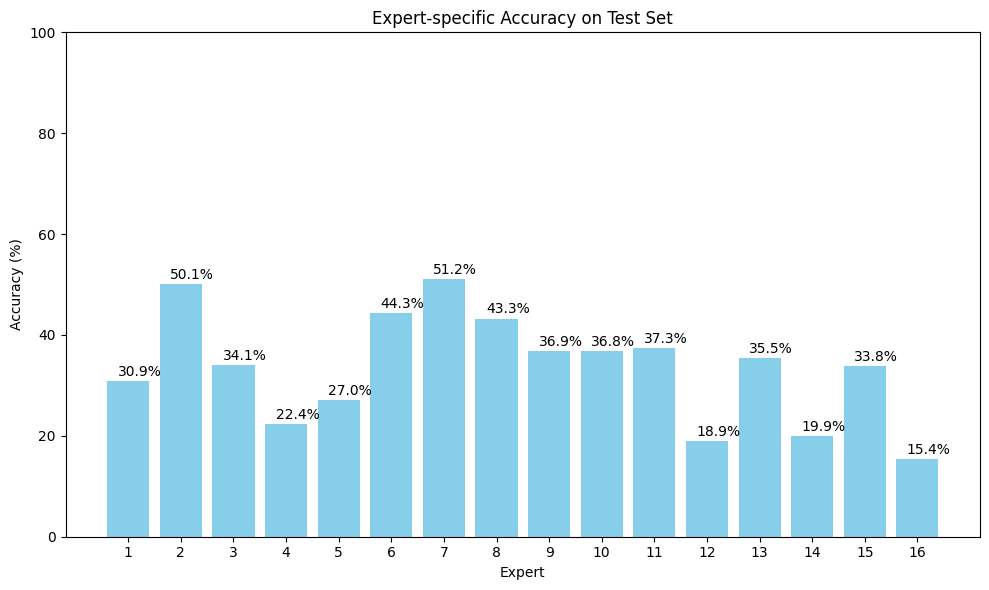

Expert-specific accuracies (%): [30.94, 50.13, 34.07, 22.4, 27.02, 44.33, 51.16, 43.26, 36.91, 36.81, 37.32, 18.9, 35.52, 19.93, 33.81, 15.44]


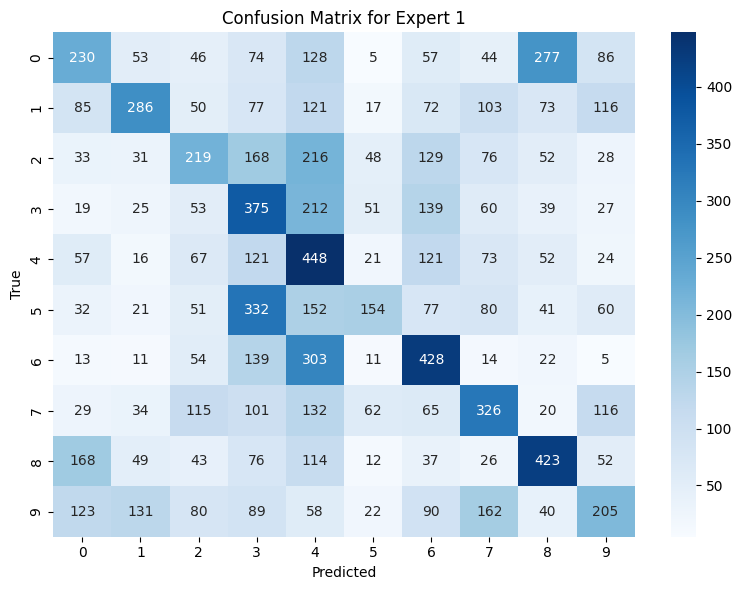

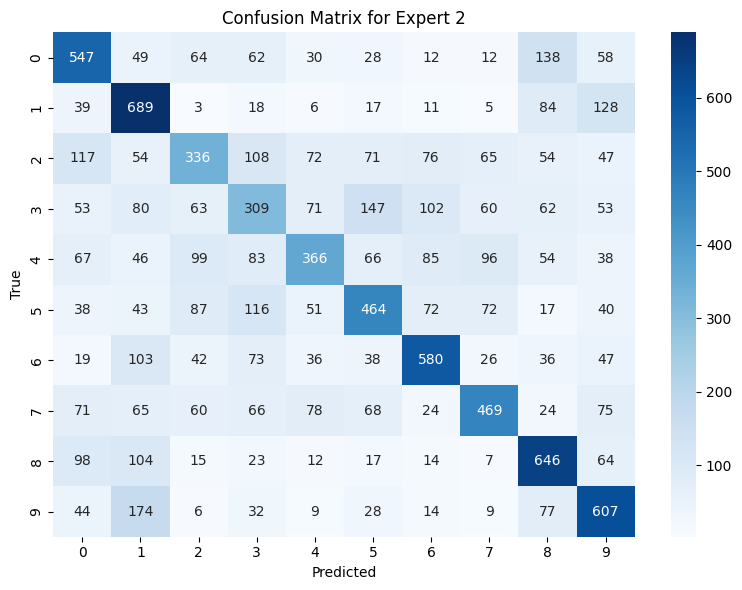

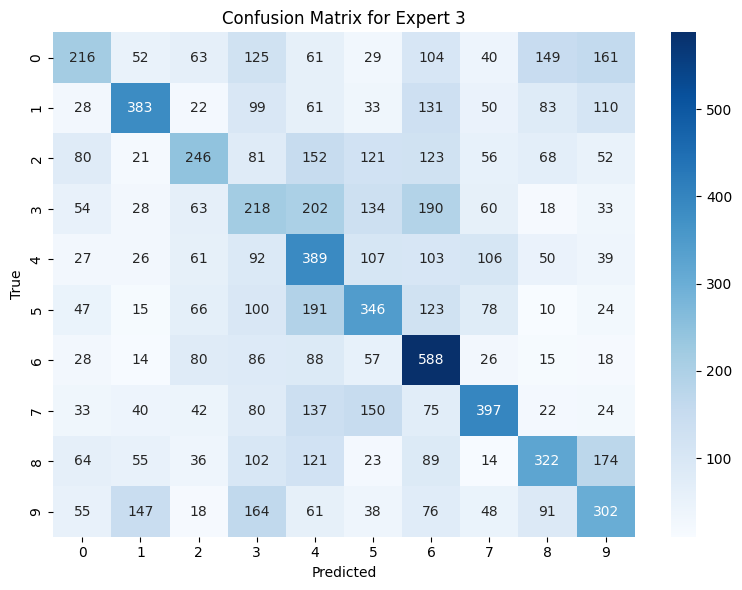

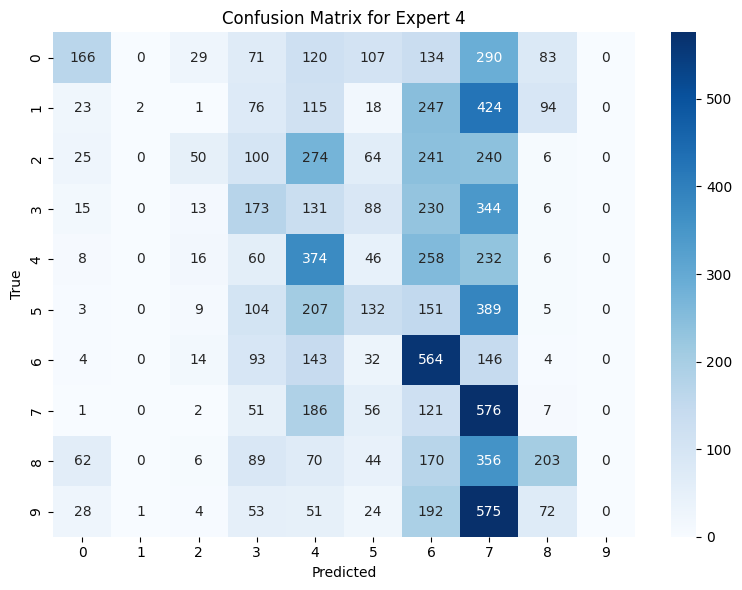

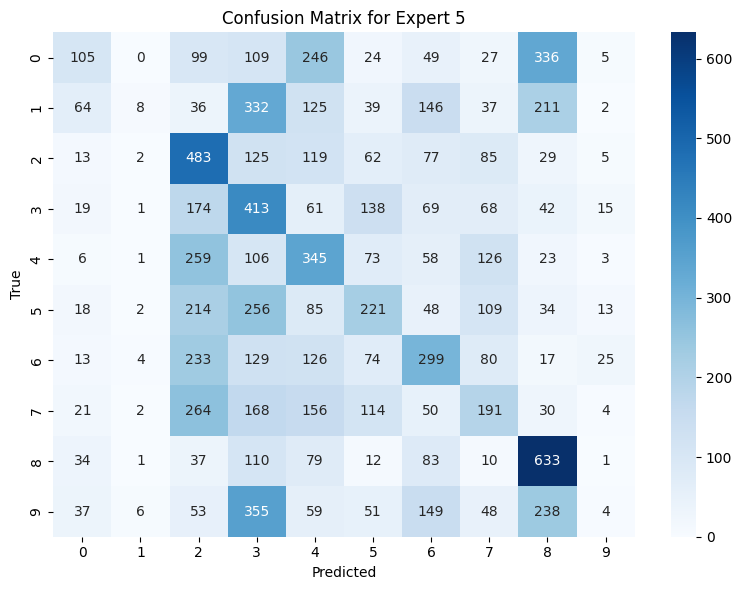

...

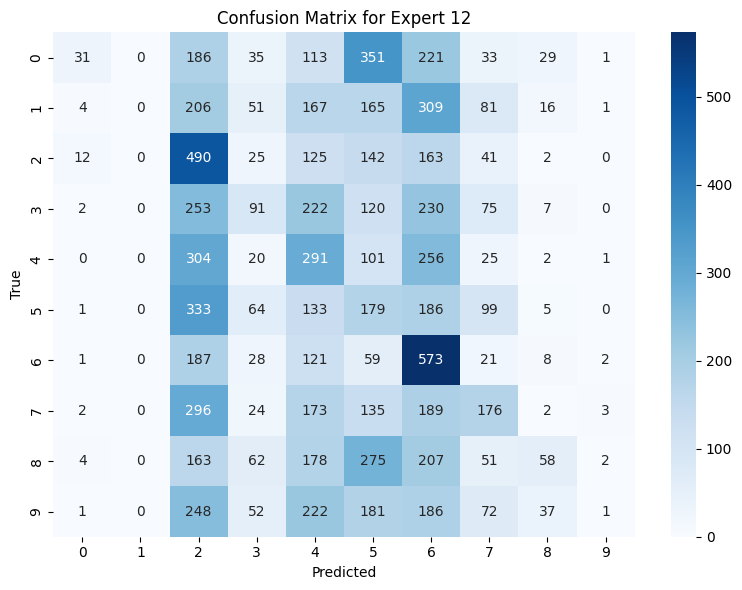

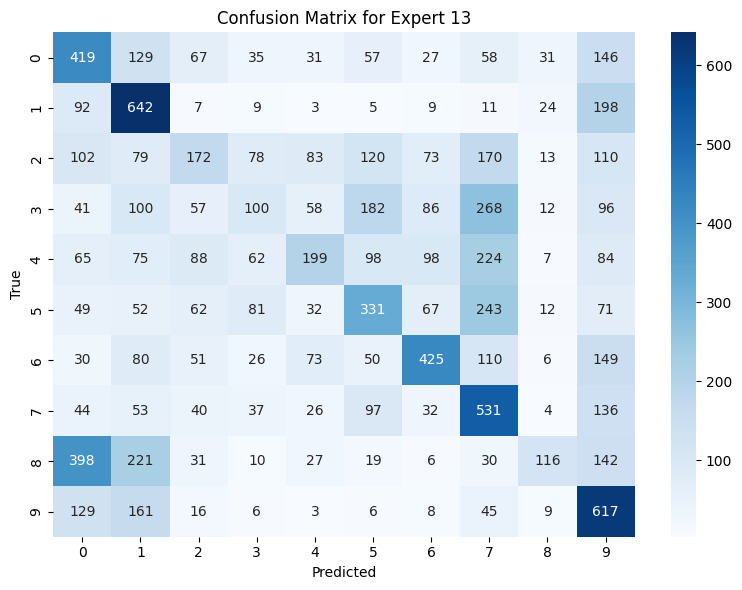

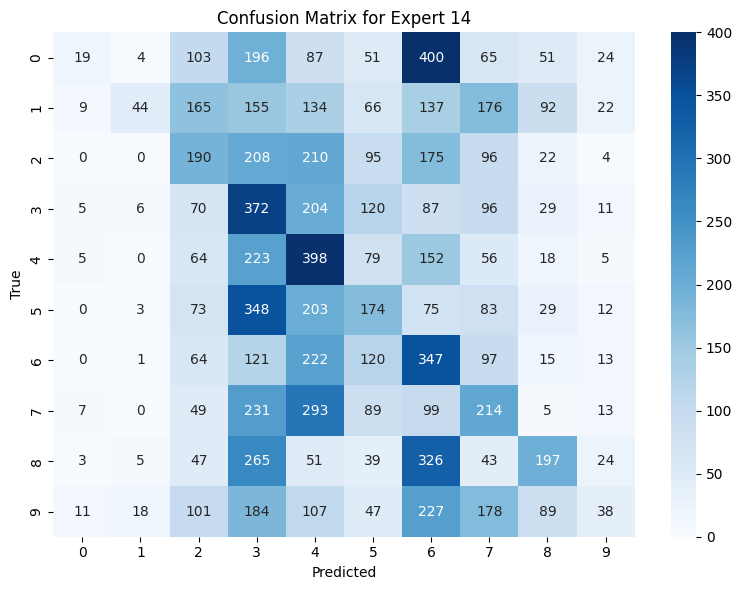

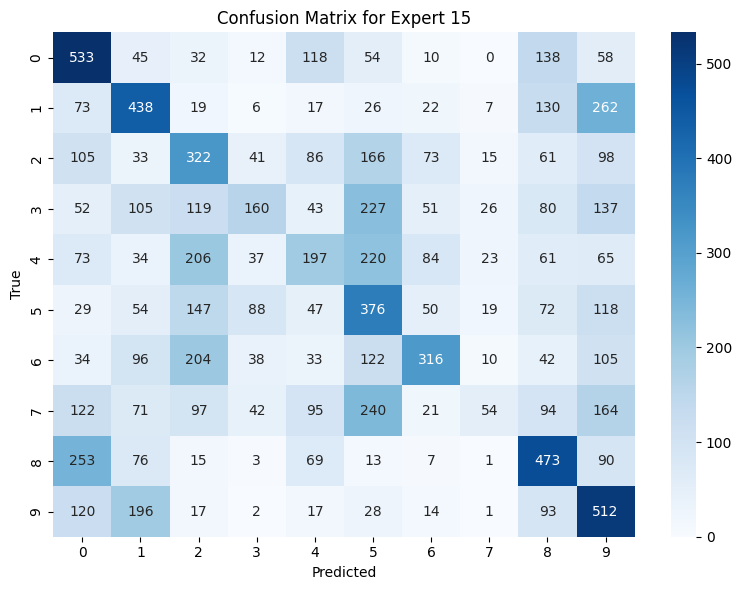

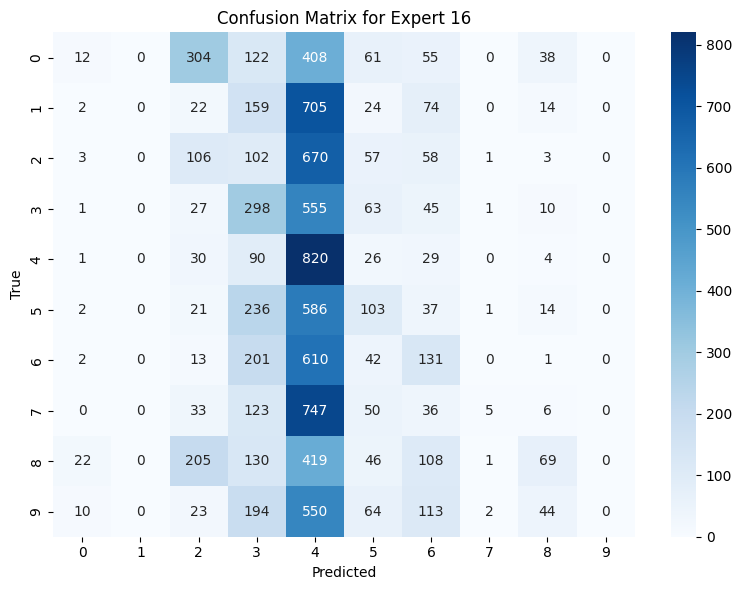

In [ ]:
"""
Extended Mixture of Experts (MoE) for CIFAR10 with a stronger convolutional backbone.
This version uses CNNs for both the experts and the gating network while keeping all
other ideas (cost, load balancing, distribution shift, and expert analysis) unchanged.
"""

import random
import csv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ------------------------
# Model definitions with CNN backbones
# ------------------------

class Expert(nn.Module):
    """Expert network with a convolutional feature extractor."""
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1), # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class GatingNetwork(nn.Module):
    """Gating network with a convolutional feature extractor."""
    def __init__(self, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1), # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with convolutional experts and gating network.
    Uses conditional distribution shift based on simulated system constraints.
    """
    def __init__(self, num_experts: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        """
        Args:
            num_experts: Number of expert networks.
            num_classes: Number of output classes.
            alpha1, alpha2: Weights for latency and CPU usage in cost.
            beta: Trade-off parameter for cost in the gating assignment.
            lambda_penalty: Coefficient for the constraint penalty.
            tau: Threshold for the expected cost constraint.
            lambda_balance: Weight for the load balancing loss.
        """
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        # Simulate system metrics if not provided
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

# ------------------------
# Analysis Functions (Expert Utilization Analysis)
# ------------------------

def plot_gating_distribution_statistics(model: nn.Module, test_loader, device):
    """
    Collect raw and shifted gating probabilities over the test set and
    plot box plots to show their distributions per expert.
    """
    model.eval()
    all_raw = []
    all_shifted = []

    with torch.no_grad():
        for images, _ in test_loader:
            images = images.to(device)
            _, debug_info = model.forward_debug(images)
            all_raw.append(debug_info['raw_p'])
            all_shifted.append(debug_info['p'])

    all_raw = np.concatenate(all_raw, axis=0)   # shape: [N, num_experts]
    all_shifted = np.concatenate(all_shifted, axis=0)
    num_experts = model.num_experts

    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].boxplot([all_raw[:, i] for i in range(num_experts)])
    axs[0].set_title("Raw Gating Probabilities per Expert")
    axs[0].set_xlabel("Expert")
    axs[0].set_ylabel("Probability")
    axs[0].set_xticklabels(list(range(1, num_experts+1)))

    axs[1].boxplot([all_shifted[:, i] for i in range(num_experts)])
    axs[1].set_title("Shifted Gating Probabilities per Expert")
    axs[1].set_xlabel("Expert")
    axs[1].set_ylabel("Probability")
    axs[1].set_xticklabels(list(range(1, num_experts+1)))

    plt.tight_layout()
    plt.savefig("gating_distribution_statistics.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_expert_accuracy(model: nn.Module, test_loader, device):
    """
    Evaluate and plot the accuracy of each expert (used independently) on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    correct = [0] * num_experts
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0)
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                correct[i] += (predicted == labels).sum().item()
    accuracy = [100.0 * c / total for c in correct]

    experts = list(range(1, num_experts+1))
    plt.figure(figsize=(10,6))
    plt.bar(experts, accuracy, color='skyblue')
    plt.xlabel("Expert")
    plt.ylabel("Accuracy (%)")
    plt.title("Expert-specific Accuracy on Test Set")
    plt.xticks(experts)
    plt.ylim(0, 100)
    for i, acc in enumerate(accuracy):
        plt.text(experts[i] - 0.2, acc + 1, f"{acc:.1f}%", fontsize=10)
    plt.tight_layout()
    plt.savefig("expert_accuracy.png", dpi=300, bbox_inches="tight")
    plt.show()

    return accuracy

def plot_expert_confusion_matrices(model: nn.Module, test_loader, device):
    """
    Compute and plot confusion matrices for each expert's predictions on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    expert_preds = [[] for _ in range(num_experts)]
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            all_labels.extend(labels.cpu().numpy())
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                expert_preds[i].extend(predicted.cpu().numpy())

    for i in range(num_experts):
        cm = confusion_matrix(all_labels, expert_preds[i])
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix for Expert {i+1}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_expert_{i+1}.png", dpi=300, bbox_inches="tight")
        plt.show()

# ------------------------
# Visualization Functions (Unchanged)
# ------------------------

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    """
    Plot network status metrics along with the distribution shift (shifted - raw)
    for each expert.
    """
    experts = list(range(1, len(debug_info["latency"]) + 1))
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5

    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------
# Main Training and Evaluation
# ------------------------

def main():
    # Use CUDA if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    model = MoE(
        num_experts=num_experts,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=2
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 10
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy (MoE): {100 * correct / total:.2f}%")

    # Plot gate shift for a few test images
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)

    # Plot training loss over epochs
    plt.figure(figsize=(10,6))
    plt.plot(range(1, num_epochs+1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

    # ------------------------
    # Expert Utilization Analysis
    # ------------------------

    # 1. Gating Distribution Statistics over the test set
    plot_gating_distribution_statistics(model, test_loader, device)

    # 2. Expert-specific Accuracy
    expert_accuracies = evaluate_expert_accuracy(model, test_loader, device)
    print("Expert-specific accuracies (%):", expert_accuracies)

    # 3. Class-wise Contribution (Confusion Matrices for each expert)
    plot_expert_confusion_matrices(model, test_loader, device)

if __name__ == "__main__":
    main()


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Epoch 1/10, Loss: 1.2852, Penalty: 0.0000, LoadBalanceLoss: 0.0053
Epoch 2/10, Loss: 0.8862, Penalty: 0.0000, LoadBalanceLoss: 0.0047
Epoch 3/10, Loss: 0.7043, Penalty: 0.0000, LoadBalanceLoss: 0.0063
Epoch 4/10, Loss: 0.5476, Penalty: 0.0000, LoadBalanceLoss: 0.0040
Epoch 5/10, Loss: 0.4057, Penalty: 0.0000, LoadBalanceLoss: 0.0044
Epoch 6/10, Loss: 0.2775, Penalty: 0.0000, LoadBalanceLoss: 0.0077
Epoch 7/10, Loss: 0.1884, Penalty: 0.0000, LoadBalanceLoss: 0.0150
Epoch 8/10, Loss: 0.1296, Penalty: 0.0000, LoadBalanceLoss: 0.0080
Epoch 9/10, Loss: 0.1060, Penalty: 0.0000, LoadBalanceLoss: 0.0057
Epoch 10/10, Loss: 0.0828, Penalty: 0.0000, LoadBalanceLoss: 0.0051
Test Accuracy (MoE): 75.11%


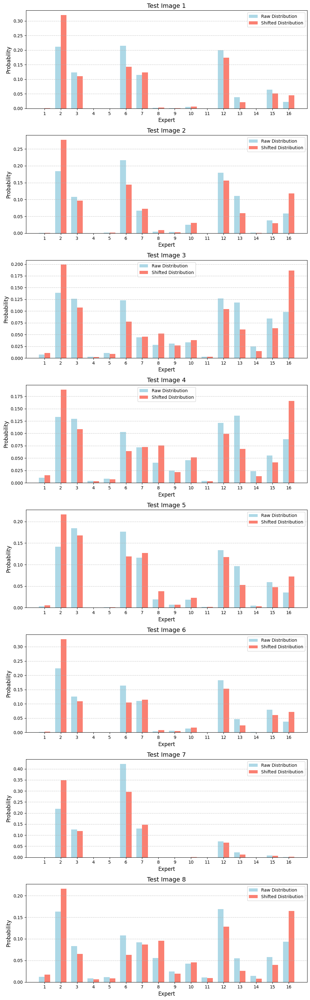

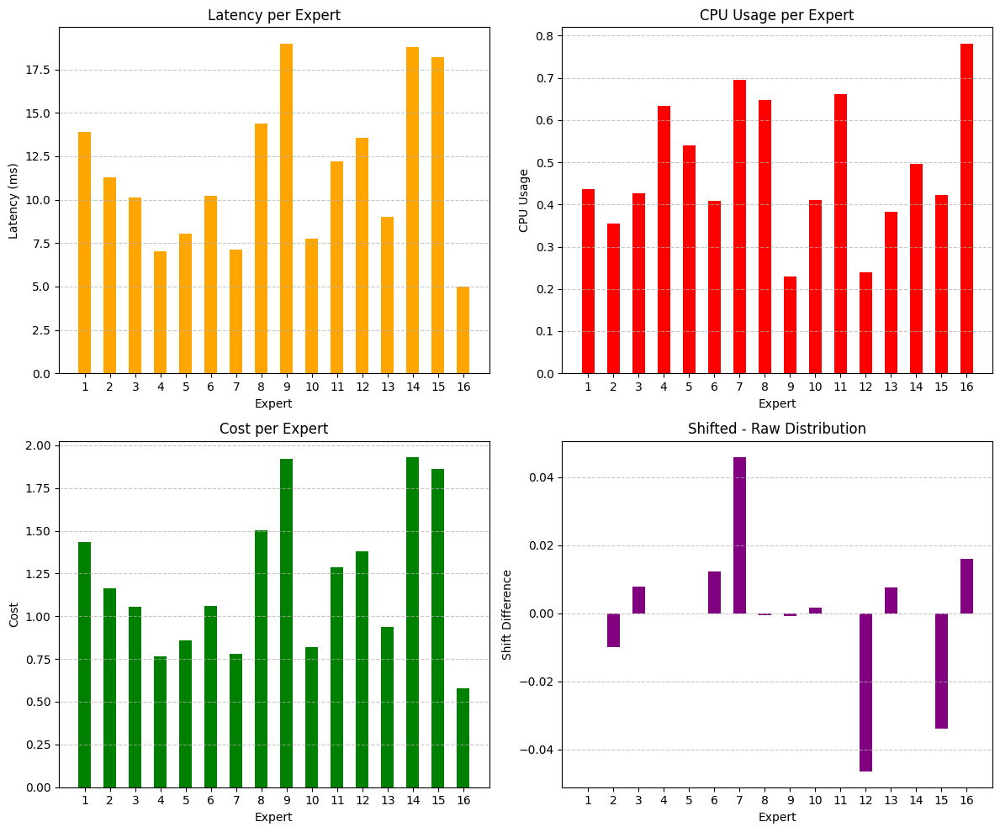

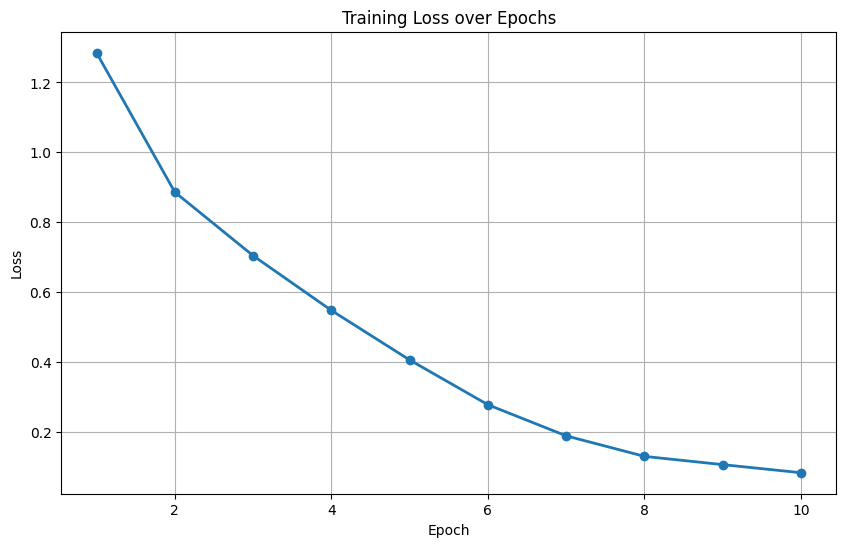

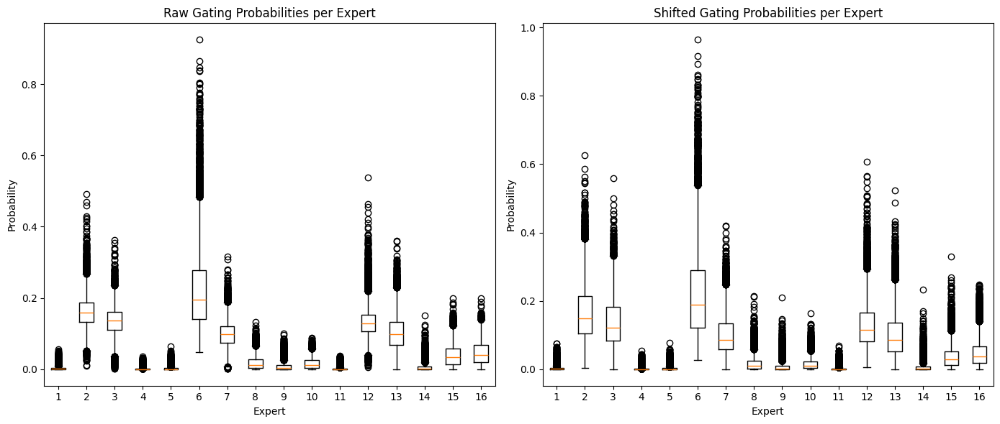

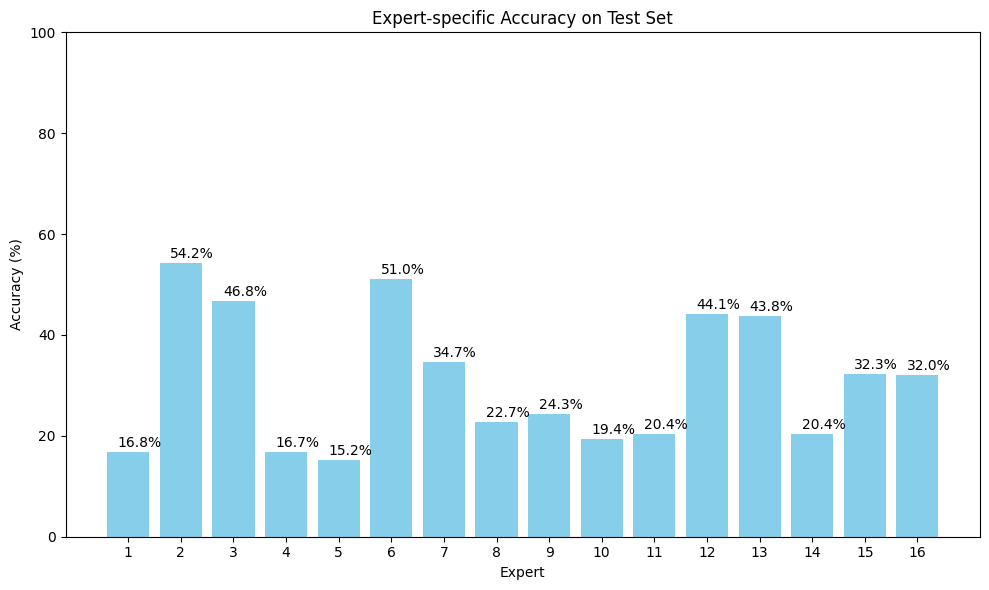

Expert-specific accuracies (%): [16.8, 54.18, 46.8, 16.74, 15.25, 51.0, 34.67, 22.67, 24.3, 19.39, 20.45, 44.12, 43.81, 20.36, 32.3, 32.01]


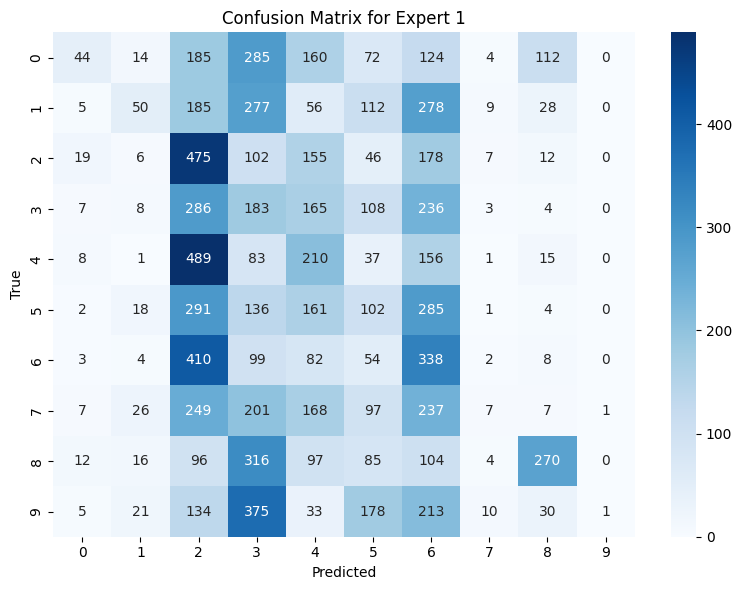

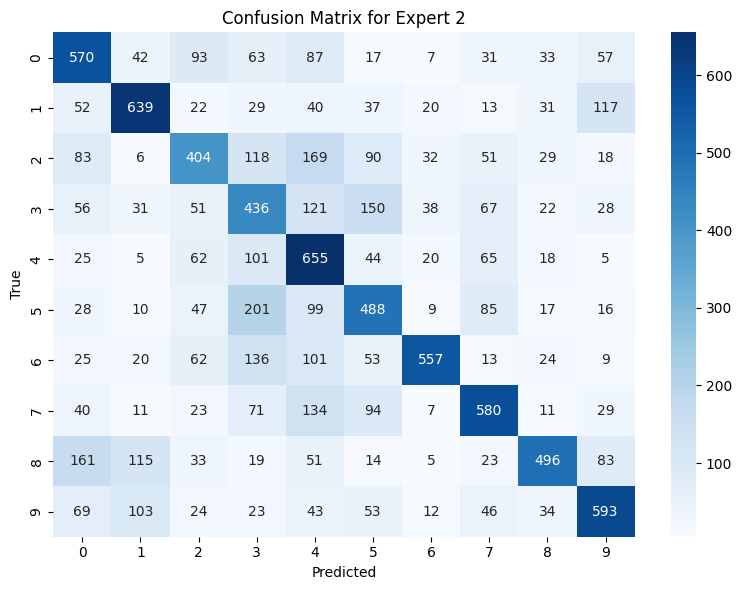

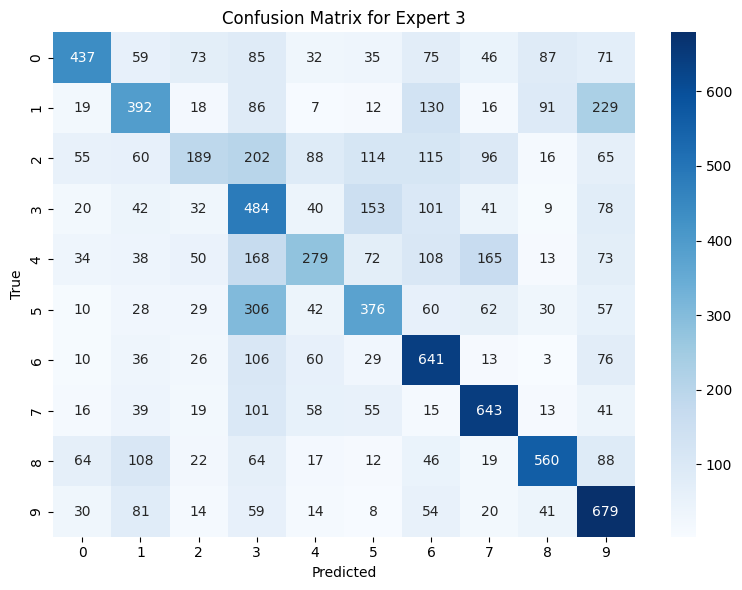

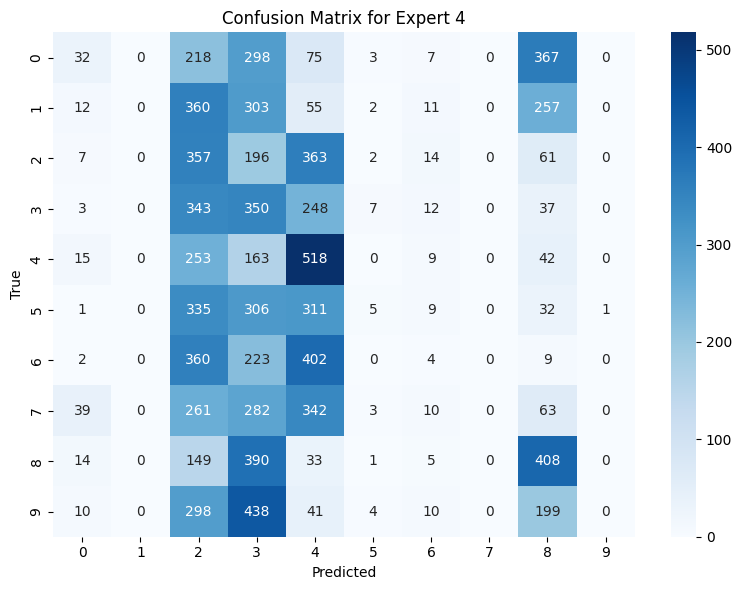

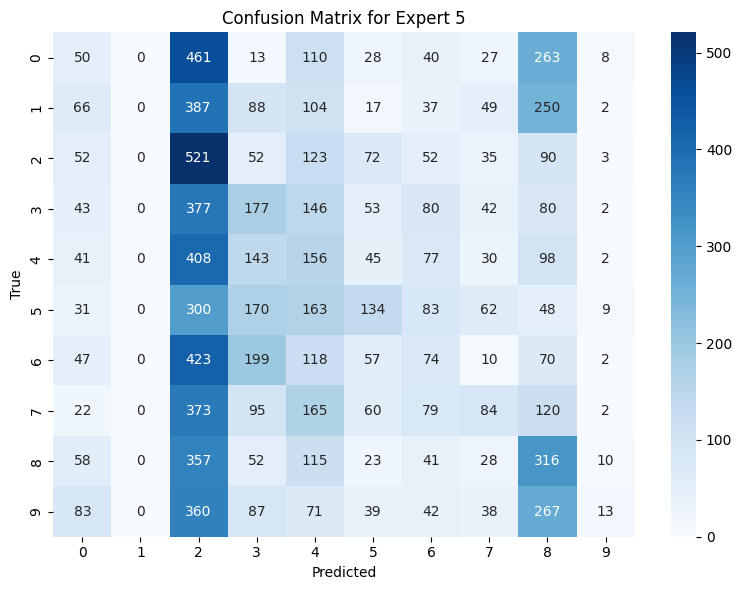

...

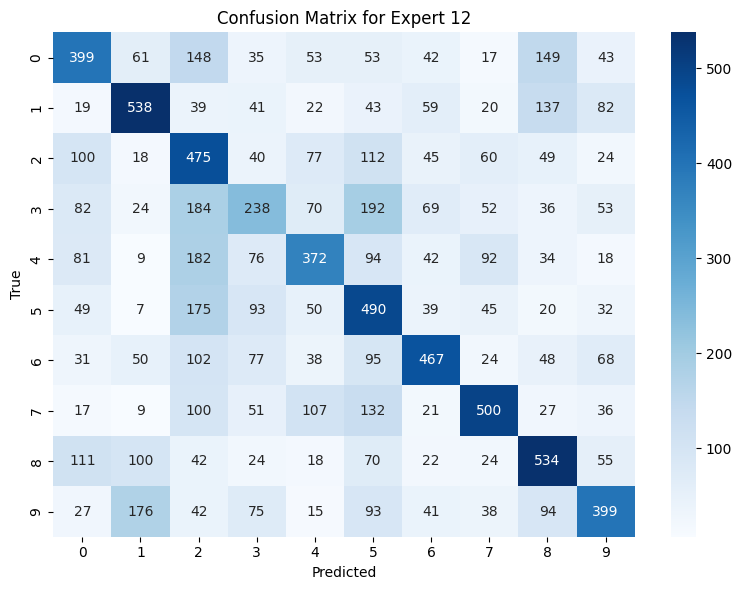

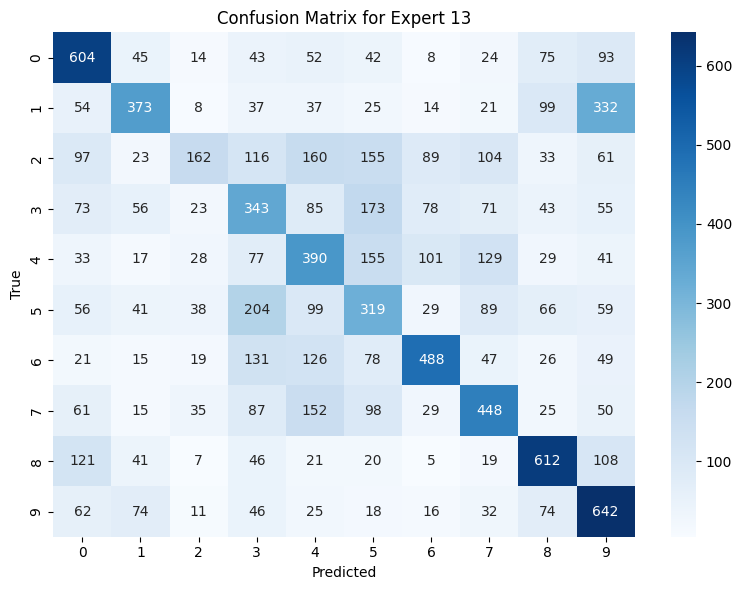

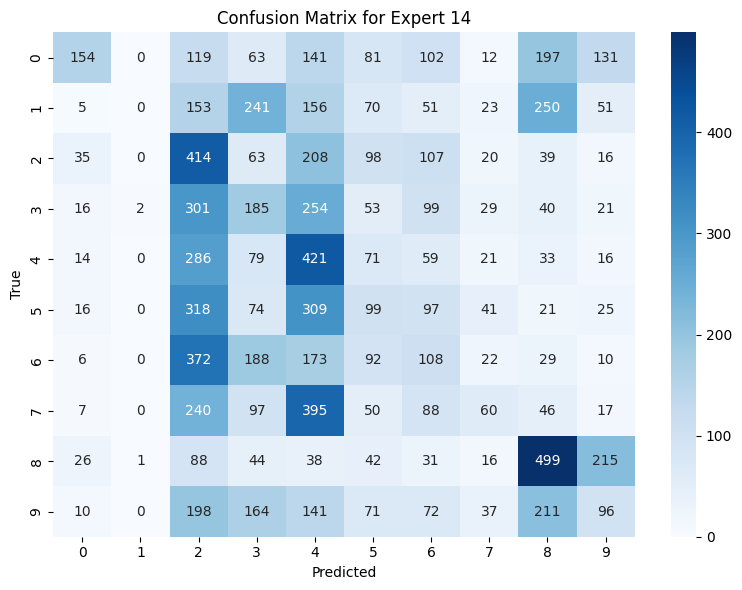

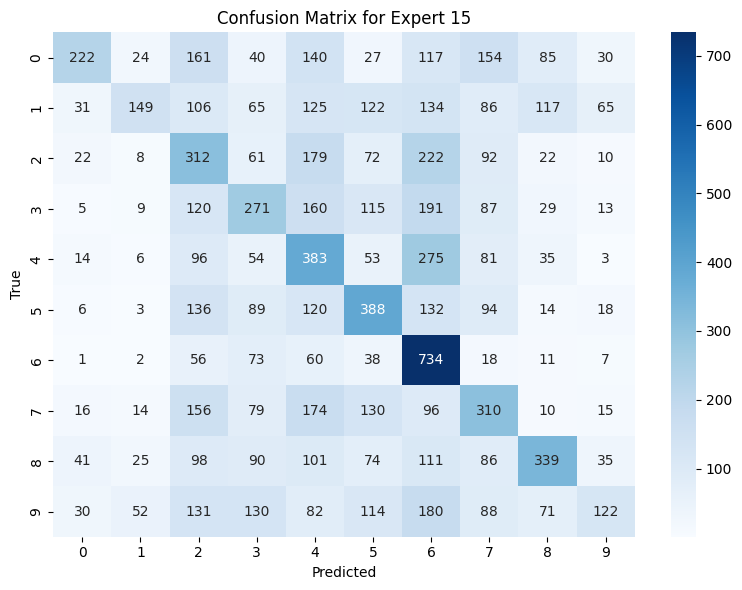

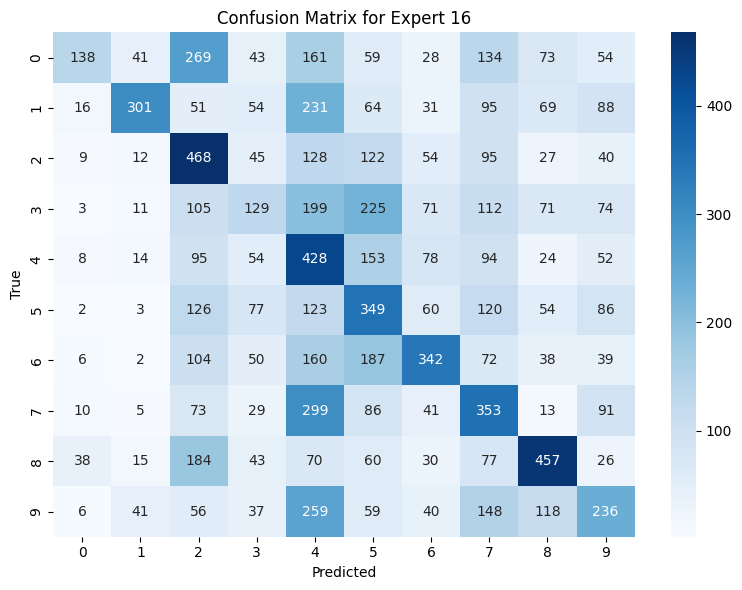

In [ ]:
"""
Extended Mixture of Experts (MoE) for CIFAR10 with a stronger convolutional backbone.
This version uses CNNs for both the experts and the gating network while keeping all
other ideas (cost, load balancing, distribution shift, and expert analysis) unchanged.
"""

import random
import csv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ------------------------
# Model definitions with CNN backbones
# ------------------------

class Expert(nn.Module):
    """Expert network with a convolutional feature extractor."""
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1), # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class GatingNetwork(nn.Module):
    """Gating network with a convolutional feature extractor."""
    def __init__(self, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1), # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with convolutional experts and gating network.
    Uses conditional distribution shift based on simulated system constraints.
    """
    def __init__(self, num_experts: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        """
        Args:
            num_experts: Number of expert networks.
            num_classes: Number of output classes.
            alpha1, alpha2: Weights for latency and CPU usage in cost.
            beta: Trade-off parameter for cost in the gating assignment.
            lambda_penalty: Coefficient for the constraint penalty.
            tau: Threshold for the expected cost constraint.
            lambda_balance: Weight for the load balancing loss.
        """
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        # Simulate system metrics if not provided
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

# ------------------------
# Analysis Functions (Expert Utilization Analysis)
# ------------------------

def plot_gating_distribution_statistics(model: nn.Module, test_loader, device):
    """
    Collect raw and shifted gating probabilities over the test set and
    plot box plots to show their distributions per expert.
    """
    model.eval()
    all_raw = []
    all_shifted = []

    with torch.no_grad():
        for images, _ in test_loader:
            images = images.to(device)
            _, debug_info = model.forward_debug(images)
            all_raw.append(debug_info['raw_p'])
            all_shifted.append(debug_info['p'])

    all_raw = np.concatenate(all_raw, axis=0)   # shape: [N, num_experts]
    all_shifted = np.concatenate(all_shifted, axis=0)
    num_experts = model.num_experts

    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].boxplot([all_raw[:, i] for i in range(num_experts)])
    axs[0].set_title("Raw Gating Probabilities per Expert")
    axs[0].set_xlabel("Expert")
    axs[0].set_ylabel("Probability")
    axs[0].set_xticklabels(list(range(1, num_experts+1)))

    axs[1].boxplot([all_shifted[:, i] for i in range(num_experts)])
    axs[1].set_title("Shifted Gating Probabilities per Expert")
    axs[1].set_xlabel("Expert")
    axs[1].set_ylabel("Probability")
    axs[1].set_xticklabels(list(range(1, num_experts+1)))

    plt.tight_layout()
    plt.savefig("gating_distribution_statistics.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_expert_accuracy(model: nn.Module, test_loader, device):
    """
    Evaluate and plot the accuracy of each expert (used independently) on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    correct = [0] * num_experts
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0)
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                correct[i] += (predicted == labels).sum().item()
    accuracy = [100.0 * c / total for c in correct]

    experts = list(range(1, num_experts+1))
    plt.figure(figsize=(10,6))
    plt.bar(experts, accuracy, color='skyblue')
    plt.xlabel("Expert")
    plt.ylabel("Accuracy (%)")
    plt.title("Expert-specific Accuracy on Test Set")
    plt.xticks(experts)
    plt.ylim(0, 100)
    for i, acc in enumerate(accuracy):
        plt.text(experts[i] - 0.2, acc + 1, f"{acc:.1f}%", fontsize=10)
    plt.tight_layout()
    plt.savefig("expert_accuracy.png", dpi=300, bbox_inches="tight")
    plt.show()

    return accuracy

def plot_expert_confusion_matrices(model: nn.Module, test_loader, device):
    """
    Compute and plot confusion matrices for each expert's predictions on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    expert_preds = [[] for _ in range(num_experts)]
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            all_labels.extend(labels.cpu().numpy())
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                expert_preds[i].extend(predicted.cpu().numpy())

    for i in range(num_experts):
        cm = confusion_matrix(all_labels, expert_preds[i])
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix for Expert {i+1}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_expert_{i+1}.png", dpi=300, bbox_inches="tight")
        plt.show()

# ------------------------
# Visualization Functions (Unchanged)
# ------------------------

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    """
    Plot network status metrics along with the distribution shift (shifted - raw)
    for each expert.
    """
    experts = list(range(1, len(debug_info["latency"]) + 1))
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5

    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------
# Main Training and Evaluation
# ------------------------

def main():
    # Use CUDA if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    model = MoE(
        num_experts=num_experts,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=0.1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    num_epochs = 10
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy (MoE): {100 * correct / total:.2f}%")

    # Plot gate shift for a few test images
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)

    # Plot training loss over epochs
    plt.figure(figsize=(10,6))
    plt.plot(range(1, num_epochs+1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

    # ------------------------
    # Expert Utilization Analysis
    # ------------------------

    # 1. Gating Distribution Statistics over the test set
    plot_gating_distribution_statistics(model, test_loader, device)

    # 2. Expert-specific Accuracy
    expert_accuracies = evaluate_expert_accuracy(model, test_loader, device)
    print("Expert-specific accuracies (%):", expert_accuracies)

    # 3. Class-wise Contribution (Confusion Matrices for each expert)
    plot_expert_confusion_matrices(model, test_loader, device)

if __name__ == "__main__":
    main()
# This code only change the lambda_balance hyperparameter

# Hyperparameters effect(alpha1, alpha2,and beta)

Using device: cuda
Files already downloaded and verified
Files already downloaded and verified
Training primary MoE model...
Epoch 1/3, Loss: 1.2787
Epoch 2/3, Loss: 0.8828
Epoch 3/3, Loss: 0.6998
Primary Model Test Accuracy (MoE): 72.28%


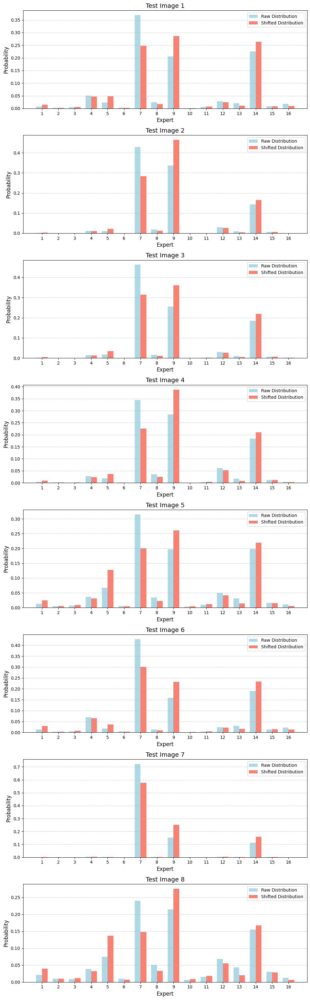

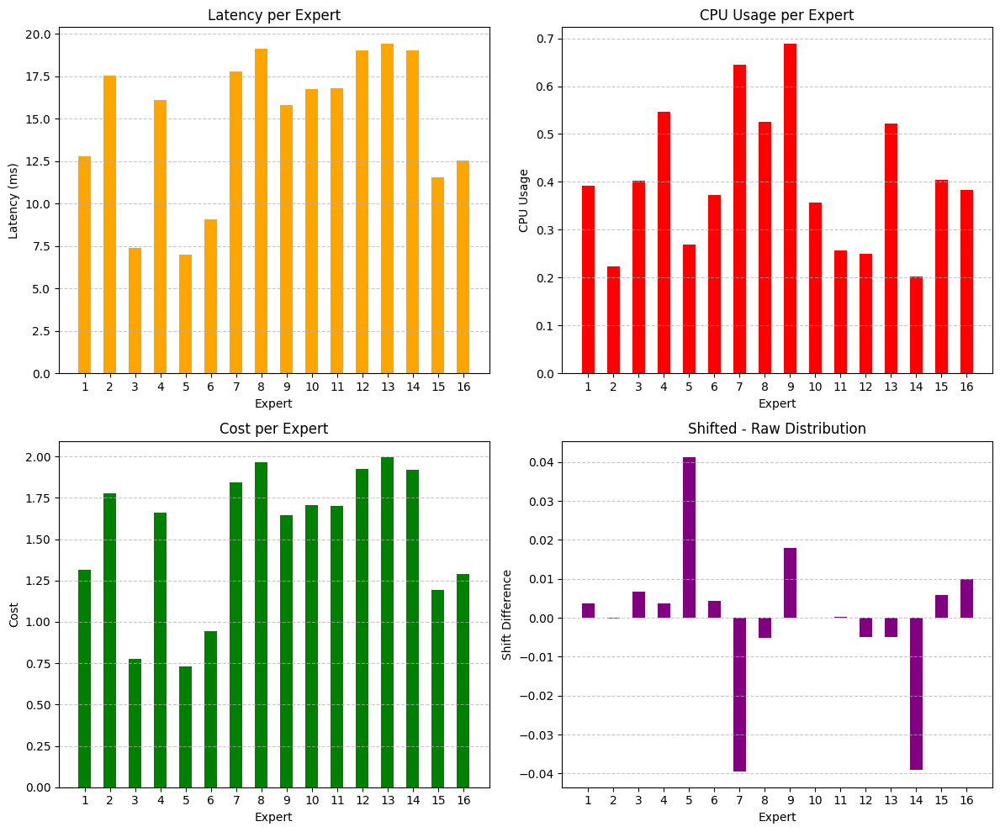

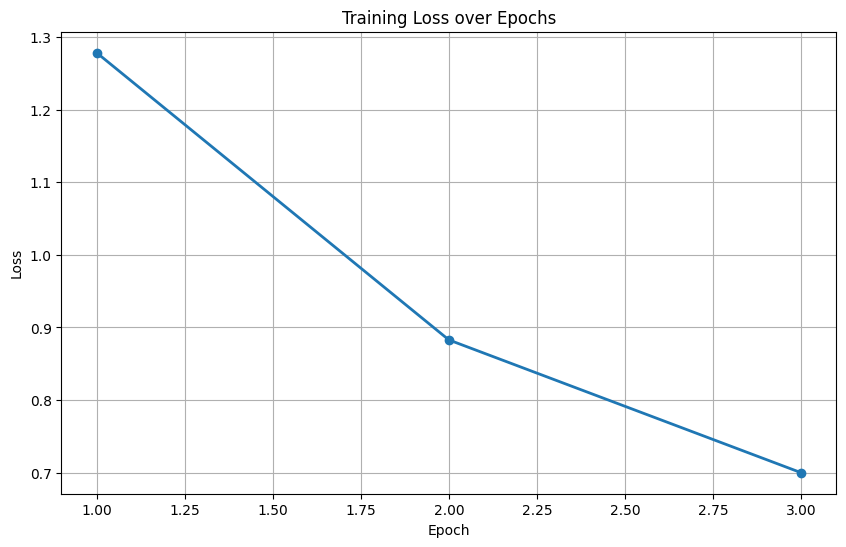

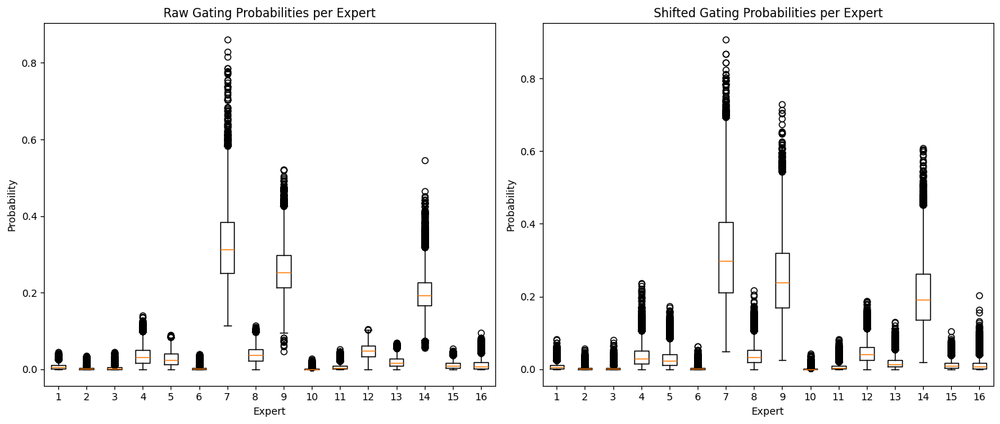

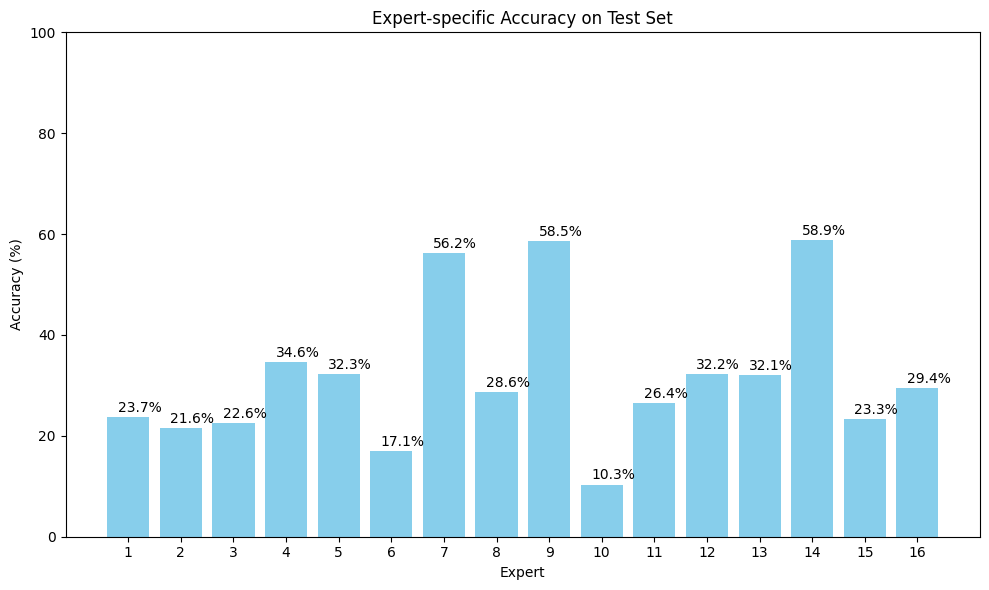

Expert-specific accuracies (%): [23.71, 21.6, 22.6, 34.58, 32.31, 17.08, 56.17, 28.63, 58.54, 10.35, 26.42, 32.23, 32.06, 58.88, 23.34, 29.41]


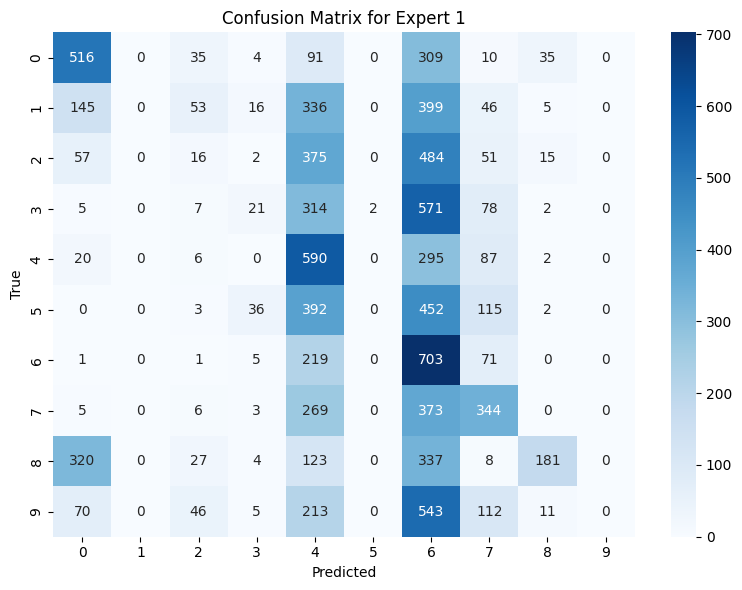

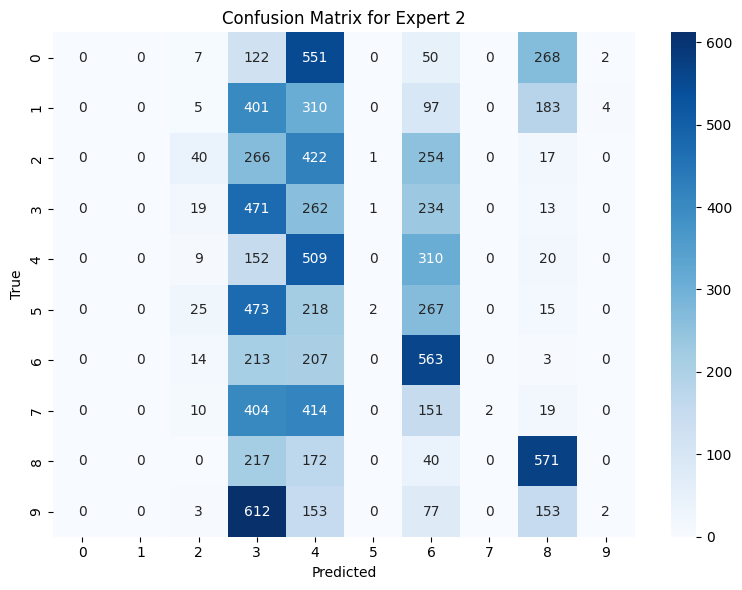

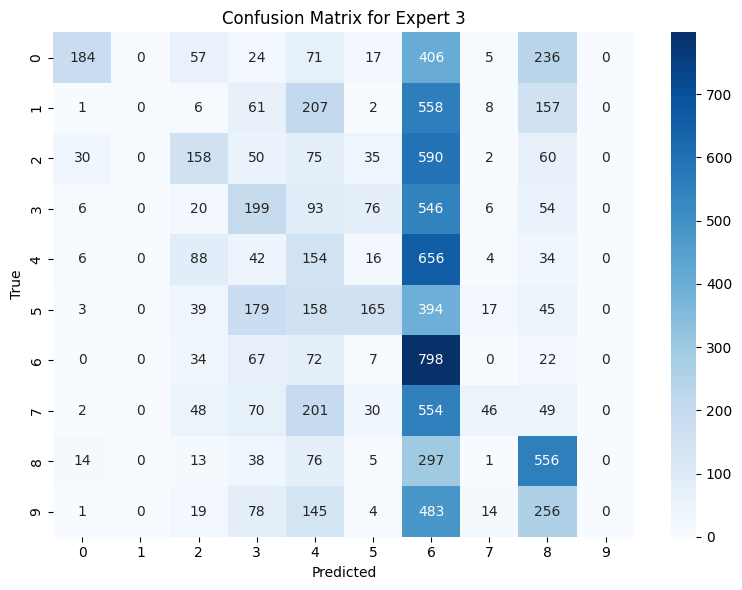

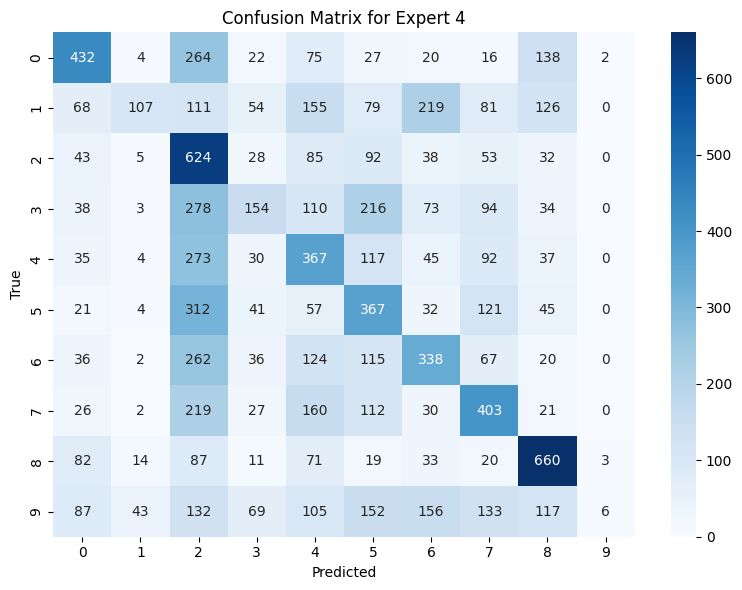

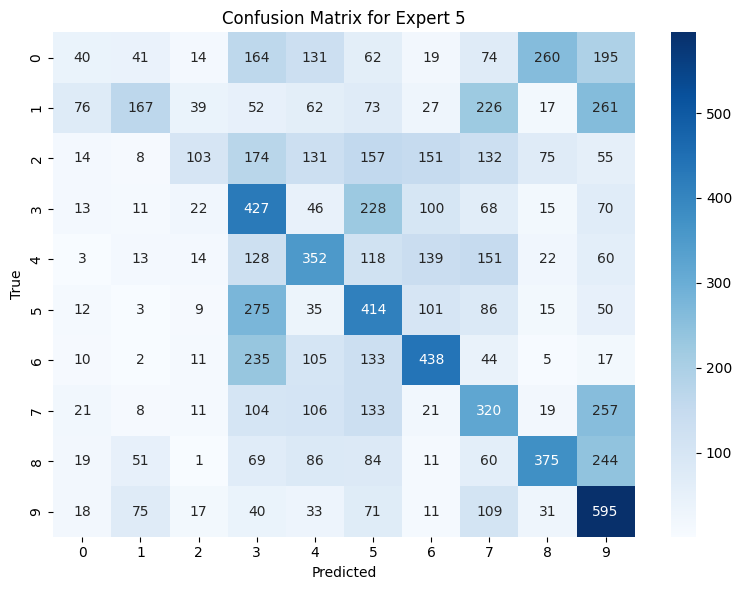

...

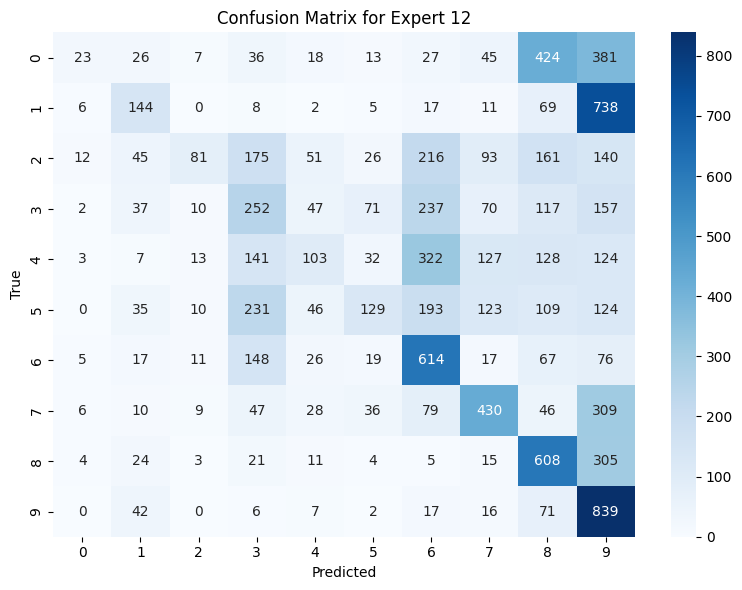

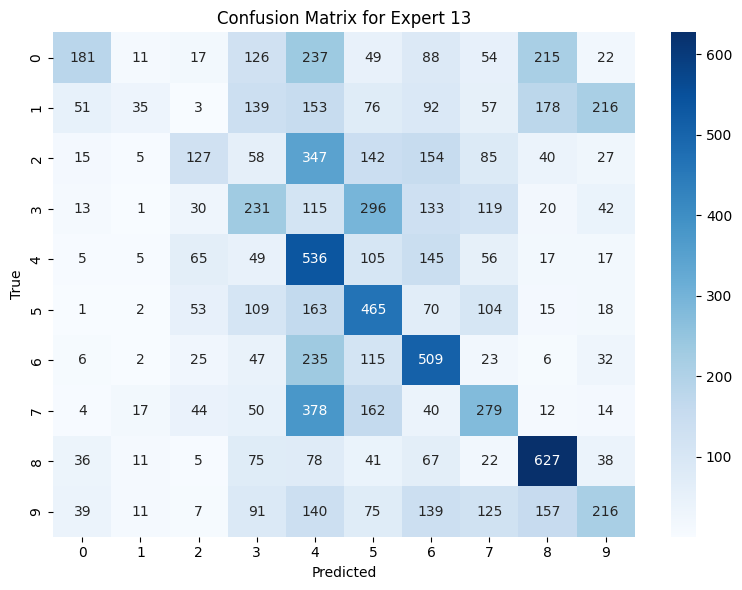

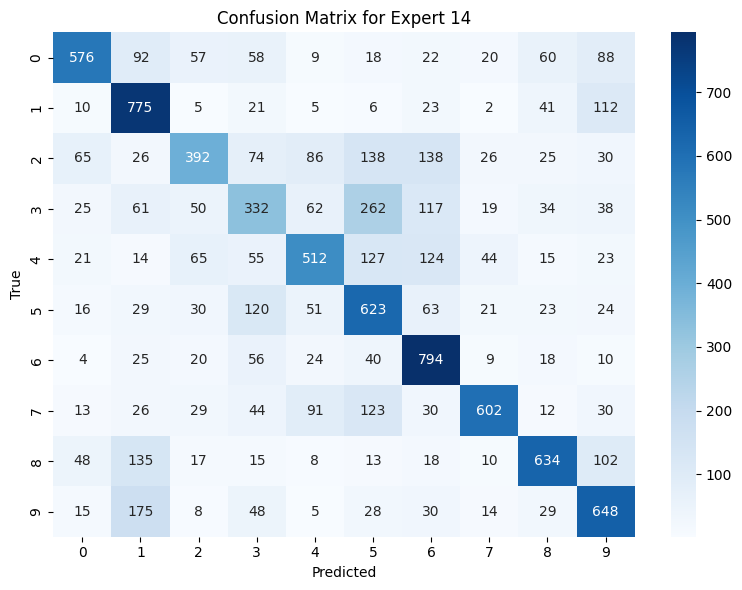

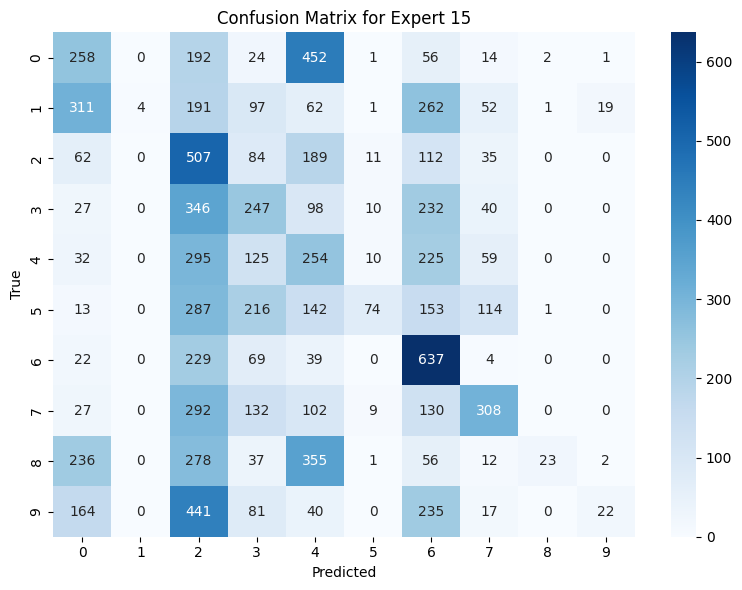

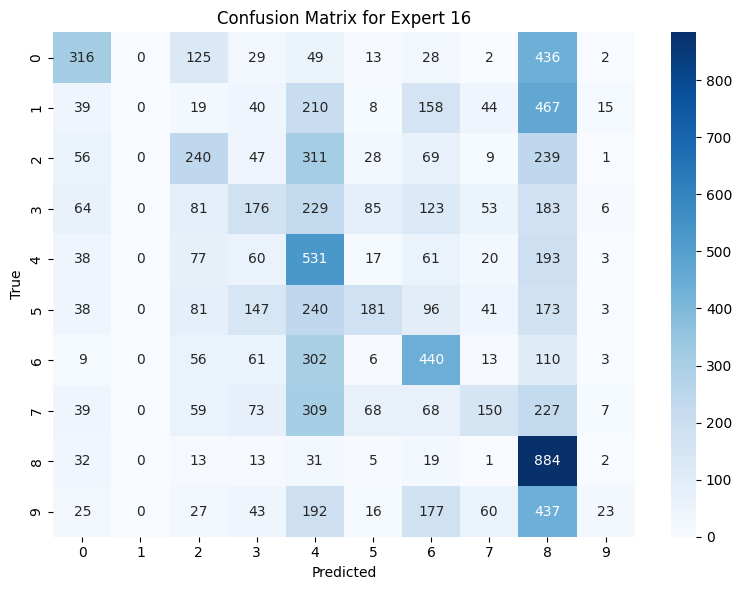


Training model with alpha1 = 0.05
  Epoch 1/3, Loss: 1.2250
  Epoch 2/3, Loss: 0.8300
  Epoch 3/3, Loss: 0.6371
  Test Accuracy: 74.08% - Mean Latency: 12.53 ms

Training model with alpha1 = 0.1
  Epoch 1/3, Loss: 1.2921
  Epoch 2/3, Loss: 0.9022
  Epoch 3/3, Loss: 0.7388
  Test Accuracy: 69.87% - Mean Latency: 12.48 ms

Training model with alpha1 = 0.2
  Epoch 1/3, Loss: 1.3396
  Epoch 2/3, Loss: 0.8965
  Epoch 3/3, Loss: 0.7381
  Test Accuracy: 71.37% - Mean Latency: 12.45 ms

Training model with alpha1 = 0.5
  Epoch 1/3, Loss: 1.6933
  Epoch 2/3, Loss: 1.3221
  Epoch 3/3, Loss: 1.1415
  Test Accuracy: 62.02% - Mean Latency: 12.59 ms

Training model with alpha1 = 1.0
  Epoch 1/3, Loss: 1.9066
  Epoch 2/3, Loss: 1.5790
  Epoch 3/3, Loss: 1.3787
  Test Accuracy: 56.41% - Mean Latency: 12.35 ms


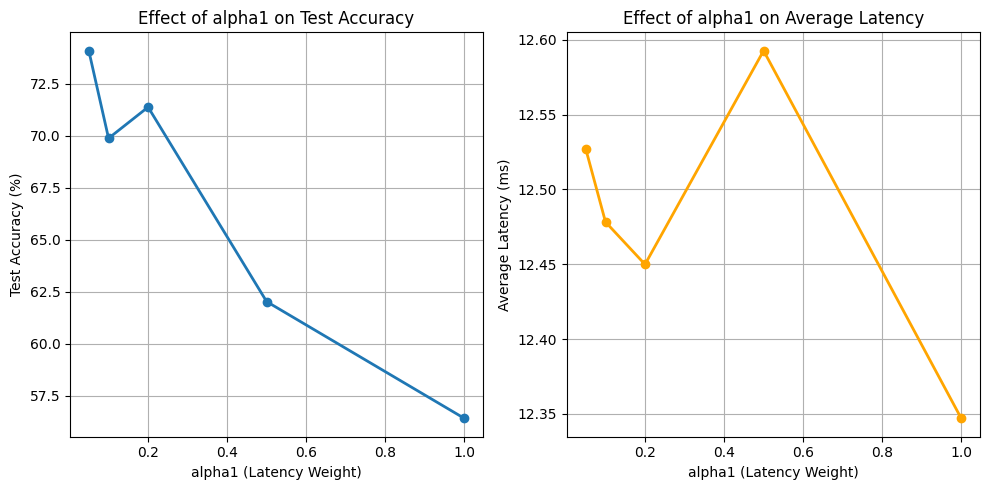

In [ ]:
"""
Complete MoE Code with Convolutional Backbone and Monitoring of Latency Hyperparameter Effect.

This code includes:
1. A stronger MoE model (using CNNs for both experts and gating network).
2. Analysis functions:
   - Plotting box plots of raw and shifted gating distributions over the test set.
   - Evaluating and plotting expert-specific accuracy.
   - Plotting confusion matrices for each expert.
3. An experimental function to monitor how the latency hyperparameter (alpha1)
   affects test accuracy and average simulated latency.
4. A main() function that trains a model, performs analysis, and then runs the experiment.
"""

import random
import csv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ------------------------
# Model definitions with CNN backbones
# ------------------------

class Expert(nn.Module):
    """Expert network with a convolutional feature extractor."""
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class GatingNetwork(nn.Module):
    """Gating network with a convolutional feature extractor."""
    def __init__(self, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # [B, 32, 32, 32]
            nn.ReLU(),
            nn.MaxPool2d(2),                             # [B, 32, 16, 16]
            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # [B, 64, 16, 16]
            nn.ReLU(),
            nn.MaxPool2d(2)                              # [B, 64, 8, 8]
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 64),
            nn.ReLU(),
            nn.Linear(64, num_experts)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        return self.classifier(x)

class MoE(nn.Module):
    """
    Mixture of Experts model with convolutional experts and gating network.
    Applies conditional distribution shift based on simulated system constraints.
    """
    def __init__(self, num_experts: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        # Simulate system metrics if not provided
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        # Get outputs from each expert and combine them using weighted probabilities.
        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

# ------------------------
# Analysis Functions
# ------------------------

def plot_gating_distribution_statistics(model: nn.Module, test_loader, device):
    """
    Collect raw and shifted gating probabilities over the test set and
    plot box plots to show their distributions per expert.
    """
    model.eval()
    all_raw = []
    all_shifted = []

    with torch.no_grad():
        for images, _ in test_loader:
            images = images.to(device)
            _, debug_info = model.forward_debug(images)
            all_raw.append(debug_info['raw_p'])
            all_shifted.append(debug_info['p'])

    all_raw = np.concatenate(all_raw, axis=0)   # shape: [N, num_experts]
    all_shifted = np.concatenate(all_shifted, axis=0)
    num_experts = model.num_experts

    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].boxplot([all_raw[:, i] for i in range(num_experts)])
    axs[0].set_title("Raw Gating Probabilities per Expert")
    axs[0].set_xlabel("Expert")
    axs[0].set_ylabel("Probability")
    axs[0].set_xticklabels(list(range(1, num_experts+1)))

    axs[1].boxplot([all_shifted[:, i] for i in range(num_experts)])
    axs[1].set_title("Shifted Gating Probabilities per Expert")
    axs[1].set_xlabel("Expert")
    axs[1].set_ylabel("Probability")
    axs[1].set_xticklabels(list(range(1, num_experts+1)))

    plt.tight_layout()
    plt.savefig("gating_distribution_statistics.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_expert_accuracy(model: nn.Module, test_loader, device):
    """
    Evaluate and plot the accuracy of each expert (used independently) on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    correct = [0] * num_experts
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0)
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                correct[i] += (predicted == labels).sum().item()
    accuracy = [100.0 * c / total for c in correct]

    experts = list(range(1, num_experts+1))
    plt.figure(figsize=(10,6))
    plt.bar(experts, accuracy, color='skyblue')
    plt.xlabel("Expert")
    plt.ylabel("Accuracy (%)")
    plt.title("Expert-specific Accuracy on Test Set")
    plt.xticks(experts)
    plt.ylim(0, 100)
    for i, acc in enumerate(accuracy):
        plt.text(experts[i] - 0.2, acc + 1, f"{acc:.1f}%", fontsize=10)
    plt.tight_layout()
    plt.savefig("expert_accuracy.png", dpi=300, bbox_inches="tight")
    plt.show()

    return accuracy

def plot_expert_confusion_matrices(model: nn.Module, test_loader, device):
    """
    Compute and plot confusion matrices for each expert's predictions on the test set.
    """
    model.eval()
    num_experts = model.num_experts
    expert_preds = [[] for _ in range(num_experts)]
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            all_labels.extend(labels.cpu().numpy())
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                expert_preds[i].extend(predicted.cpu().numpy())

    for i in range(num_experts):
        cm = confusion_matrix(all_labels, expert_preds[i])
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix for Expert {i+1}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_expert_{i+1}.png", dpi=300, bbox_inches="tight")
        plt.show()

# ------------------------
# Visualization Functions (Gate Shift and Network Status)
# ------------------------

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    """
    Plot the raw and shifted gating distributions for a batch of test images.
    """
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))

    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]

    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])

    raw_p = debug_info['raw_p']
    final_p = debug_info['p']

    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    """
    Plot network status metrics along with the distribution shift (shifted - raw)
    for each expert.
    """
    experts = list(range(1, len(debug_info["latency"]) + 1))
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5

    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)

    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------
# Monitoring Function for Hyperparameter Effect
# ------------------------

def monitor_accuracy_latency_effect(alpha1_values, num_experts, num_epochs, device, train_loader, test_loader):
    """
    For each alpha1 value (latency weight), train a new MoE model and then evaluate:
      - Test accuracy.
      - Average simulated latency.
    Returns lists of alpha1 values, test accuracies, and average latencies.
    """
    test_accuracies = []
    avg_latencies = []

    for a1 in alpha1_values:
        print(f"\nTraining model with alpha1 = {a1}")
        # Initialize a new model with the current alpha1 value.
        model = MoE(
            num_experts=num_experts,
            num_classes=10,
            alpha1=a1,         # Vary this parameter
            alpha2=0.1,
            beta=1.0,
            lambda_penalty=1.0,
            tau=10.0,
            lambda_balance=0.1
        ).to(device)

        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=1e-3)

        # Training loop for a few epochs
        for epoch in range(num_epochs):
            model.train()
            total_loss = 0.0
            for images, labels in train_loader:
                images = images.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                outputs, p, cost, latency, cpu_usage, penalty = model(images)
                loss_ce = criterion(outputs, labels)
                importance = p.sum(dim=0)
                load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
                loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
            avg_loss = total_loss / len(train_loader)
            print(f"  Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")

        # Evaluate on test set
        model.eval()
        correct = 0
        total = 0
        collected_latency = []
        with torch.no_grad():
            for images, labels in test_loader:
                images = images.to(device)
                labels = labels.to(device)
                outputs, p, cost, latency, cpu_usage, penalty = model(images)
                _, predicted = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                collected_latency.extend(latency.cpu().numpy())

        accuracy = 100.0 * correct / total
        mean_latency = np.mean(collected_latency)
        test_accuracies.append(accuracy)
        avg_latencies.append(mean_latency)
        print(f"  Test Accuracy: {accuracy:.2f}% - Mean Latency: {mean_latency:.2f} ms")

    return alpha1_values, test_accuracies, avg_latencies

# ------------------------
# Main Training and Evaluation
# ------------------------

def main():
    # Use CUDA if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

    num_experts = 16
    num_epochs = 3  # Use a small number for quick experiments

    # Train a primary model (if desired) and perform analysis.
    model = MoE(
        num_experts=num_experts,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=0.1
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    loss_history = []

    print("Training primary MoE model...")
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")

    # Evaluate primary model on test set
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Primary Model Test Accuracy (MoE): {100 * correct / total:.2f}%")

    # Visualizations for primary model
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)

    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)

    plt.figure(figsize=(10,6))
    plt.plot(range(1, num_epochs+1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()

    # Expert utilization analysis
    plot_gating_distribution_statistics(model, test_loader, device)
    expert_accuracies = evaluate_expert_accuracy(model, test_loader, device)
    print("Expert-specific accuracies (%):", expert_accuracies)
    plot_expert_confusion_matrices(model, test_loader, device)

    # ------------------------
    # Monitor the effect of the latency hyperparameter (alpha1)
    # ------------------------
    alpha1_values = [0.05, 0.1, 0.2, 0.5, 1.0]
    a1_vals, accuracies, latencies = monitor_accuracy_latency_effect(alpha1_values, num_experts, num_epochs, device, train_loader, test_loader)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(a1_vals, accuracies, marker='o', linewidth=2)
    plt.title("Effect of alpha1 on Test Accuracy")
    plt.xlabel("alpha1 (Latency Weight)")
    plt.ylabel("Test Accuracy (%)")
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(a1_vals, latencies, marker='o', linewidth=2, color='orange')
    plt.title("Effect of alpha1 on Average Latency")
    plt.xlabel("alpha1 (Latency Weight)")
    plt.ylabel("Average Latency (ms)")
    plt.grid(True)

    plt.tight_layout()
    plt.savefig("accuracy_latency_effect.png", dpi=300, bbox_inches="tight")
    plt.show()

if __name__ == "__main__":
    main()


# More stronger model version(second version)

In [ ]:
"""
Extended Mixture of Experts (MoE) for CIFAR10 with a stronger residual backbone.
This version uses custom residual blocks for both experts and the gating network,
while keeping the rest of the design (cost, load balancing, distribution shift,
and expert analysis functions) unchanged.
"""

import random
import csv
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix
import seaborn as sns

# ------------------------
# Residual Block Definition
# ------------------------

class BasicBlock(nn.Module):
    expansion = 1
    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(planes)
        self.relu  = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2   = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != planes:
            # Projection shortcut to match dimensions
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes)
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = self.relu(out)
        return out

# ------------------------
# Stronger Model Definitions using Residual Blocks
# ------------------------

class Expert(nn.Module):
    """Expert network with a residual backbone for CIFAR10 classification."""
    def __init__(self, num_classes: int):
        super(Expert, self).__init__()
        self.in_planes = 64
        # Initial convolution
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(64)
        self.relu  = nn.ReLU(inplace=True)
        # Residual layers
        self.layer1 = self._make_layer(BasicBlock, 64, 2, stride=1)
        self.layer2 = self._make_layer(BasicBlock, 128, 2, stride=2)
        self.layer3 = self._make_layer(BasicBlock, 256, 2, stride=2)
        # Global average pooling and classifier
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc      = nn.Linear(256, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for s in strides:
            layers.append(block(self.in_planes, planes, s))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.avgpool(out)
        out = torch.flatten(out, 1)
        return self.fc(out)

class GatingNetwork(nn.Module):
    """Gating network with a residual backbone that outputs a vector of size num_experts."""
    def __init__(self, num_experts: int):
        super(GatingNetwork, self).__init__()
        self.in_planes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(64)
        self.relu  = nn.ReLU(inplace=True)
        # Fewer layers for gating network
        self.layer1 = self._make_layer(BasicBlock, 64, 1, stride=1)
        self.layer2 = self._make_layer(BasicBlock, 128, 1, stride=2)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc      = nn.Linear(128, num_experts)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for s in strides:
            layers.append(block(self.in_planes, planes, s))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.avgpool(out)
        out = torch.flatten(out, 1)
        return self.fc(out)

class MoE(nn.Module):
    """
    Mixture of Experts (MoE) with strong residual experts and a residual gating network.
    The model computes a cost-adjusted gating distribution and uses a load balancing loss.
    """
    def __init__(self, num_experts: int, num_classes: int,
                 alpha1: float = 0.1, alpha2: float = 0.1, beta: float = 1.0,
                 lambda_penalty: float = 1.0, tau: float = 10.0,
                 lambda_balance: float = 0.1):
        super(MoE, self).__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([Expert(num_classes) for _ in range(num_experts)])
        self.gate = GatingNetwork(num_experts)
        self.alpha1 = alpha1
        self.alpha2 = alpha2
        self.beta = beta
        self.lambda_penalty = lambda_penalty
        self.tau = tau
        self.lambda_balance = lambda_balance

    def forward(self, x: torch.Tensor, system_state=None) -> tuple:
        batch_size = x.shape[0]
        # Simulate system metrics if not provided
        if system_state is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            latency, cpu_usage = system_state
            latency = torch.tensor(latency, device=x.device)
            cpu_usage = torch.tensor(cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        f = self.gate(x)
        raw_p = torch.softmax(f, dim=1)
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)

        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)
        return final_output, p, cost, latency, cpu_usage, penalty

    def forward_debug(self, x: torch.Tensor, sim_latency=None, sim_cpu_usage=None, sim_gate_scores=None) -> tuple:
        batch_size = x.shape[0]
        if sim_gate_scores is None:
            f = self.gate(x)
        else:
            f = sim_gate_scores
            if f.dim() == 1:
                f = f.unsqueeze(0).expand(batch_size, self.num_experts)

        raw_p = torch.softmax(f, dim=1)

        if sim_latency is None:
            latency = torch.tensor([random.uniform(5, 20) for _ in range(self.num_experts)], device=x.device)
        else:
            latency = torch.tensor(sim_latency, device=x.device)

        if sim_cpu_usage is None:
            cpu_usage = torch.tensor([random.uniform(0.2, 0.8) for _ in range(self.num_experts)], device=x.device)
        else:
            cpu_usage = torch.tensor(sim_cpu_usage, device=x.device)

        cost = self.alpha1 * latency + self.alpha2 * cpu_usage
        scores = f - self.beta * cost
        p = torch.softmax(scores, dim=1)

        expert_outputs = [expert(x).unsqueeze(2) for expert in self.experts]
        expert_outputs = torch.cat(expert_outputs, dim=2)
        final_output = torch.sum(expert_outputs * p.unsqueeze(1), dim=2)
        expected_cost = (p * cost).sum(dim=1).mean()
        penalty = self.lambda_penalty * torch.relu(expected_cost - self.tau)

        debug_info = {
            "f_scores": f.detach().cpu().numpy(),
            "raw_p": raw_p.detach().cpu().numpy(),
            "p": p.detach().cpu().numpy(),
            "cost": cost.detach().cpu().numpy(),
            "latency": latency.detach().cpu().numpy(),
            "cpu_usage": cpu_usage.detach().cpu().numpy(),
            "expected_cost": expected_cost.item(),
            "penalty": penalty.item()
        }
        return final_output, debug_info

# ------------------------
# (The rest of the analysis and visualization functions remain unchanged.)
# ------------------------

def plot_gating_distribution_statistics(model: nn.Module, test_loader, device):
    model.eval()
    all_raw = []
    all_shifted = []
    with torch.no_grad():
        for images, _ in test_loader:
            images = images.to(device)
            _, debug_info = model.forward_debug(images)
            all_raw.append(debug_info['raw_p'])
            all_shifted.append(debug_info['p'])
    all_raw = np.concatenate(all_raw, axis=0)
    all_shifted = np.concatenate(all_shifted, axis=0)
    num_experts = model.num_experts

    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].boxplot([all_raw[:, i] for i in range(num_experts)])
    axs[0].set_title("Raw Gating Probabilities per Expert")
    axs[0].set_xlabel("Expert")
    axs[0].set_ylabel("Probability")
    axs[0].set_xticklabels(list(range(1, num_experts+1)))

    axs[1].boxplot([all_shifted[:, i] for i in range(num_experts)])
    axs[1].set_title("Shifted Gating Probabilities per Expert")
    axs[1].set_xlabel("Expert")
    axs[1].set_ylabel("Probability")
    axs[1].set_xticklabels(list(range(1, num_experts+1)))

    plt.tight_layout()
    plt.savefig("gating_distribution_statistics.png", dpi=300, bbox_inches="tight")
    plt.show()

def evaluate_expert_accuracy(model: nn.Module, test_loader, device):
    model.eval()
    num_experts = model.num_experts
    correct = [0] * num_experts
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            total += labels.size(0)
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                correct[i] += (predicted == labels).sum().item()
    accuracy = [100.0 * c / total for c in correct]
    experts = list(range(1, num_experts+1))
    plt.figure(figsize=(10,6))
    plt.bar(experts, accuracy, color='skyblue')
    plt.xlabel("Expert")
    plt.ylabel("Accuracy (%)")
    plt.title("Expert-specific Accuracy on Test Set")
    plt.xticks(experts)
    plt.ylim(0, 100)
    for i, acc in enumerate(accuracy):
        plt.text(experts[i] - 0.2, acc + 1, f"{acc:.1f}%", fontsize=10)
    plt.tight_layout()
    plt.savefig("expert_accuracy.png", dpi=300, bbox_inches="tight")
    plt.show()
    return accuracy

def plot_expert_confusion_matrices(model: nn.Module, test_loader, device):
    model.eval()
    num_experts = model.num_experts
    expert_preds = [[] for _ in range(num_experts)]
    all_labels = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            all_labels.extend(labels.cpu().numpy())
            for i, expert in enumerate(model.experts):
                outputs = expert(images)
                _, predicted = torch.max(outputs, 1)
                expert_preds[i].extend(predicted.cpu().numpy())
    for i in range(num_experts):
        cm = confusion_matrix(all_labels, expert_preds[i])
        plt.figure(figsize=(8,6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.title(f"Confusion Matrix for Expert {i+1}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_expert_{i+1}.png", dpi=300, bbox_inches="tight")
        plt.show()

def plot_gate_shift_for_images(model: nn.Module, images: torch.Tensor, num_images: int = 4):
    model.eval()
    batch_size = images.shape[0]
    num_images = min(num_images, batch_size)
    experts = list(range(1, model.num_experts + 1))
    fig, axs = plt.subplots(num_images, 1, figsize=(10, 4 * num_images))
    if num_images == 1:
        axs = [axs]
    with torch.no_grad():
        _, debug_info = model.forward_debug(images[:num_images])
    raw_p = debug_info['raw_p']
    final_p = debug_info['p']
    for i in range(num_images):
        ax = axs[i]
        width = 0.35
        ax.bar([x - width/2 for x in experts], raw_p[i],
               width=width, label="Raw Distribution", color='lightblue')
        ax.bar([x + width/2 for x in experts], final_p[i],
               width=width, label="Shifted Distribution", color='salmon')
        ax.set_xlabel("Expert", fontsize=12)
        ax.set_ylabel("Probability", fontsize=12)
        ax.set_title(f"Test Image {i+1}", fontsize=14)
        ax.set_xticks(experts)
        ax.legend(fontsize=10)
        ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("gate_shift_comparison.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_network_status(debug_info: dict):
    experts = list(range(1, len(debug_info["latency"]) + 1))
    latency = debug_info["latency"]
    cpu_usage = debug_info["cpu_usage"]
    cost = debug_info["cost"]
    raw_p = debug_info["raw_p"][0]
    shifted_p = debug_info["p"][0]
    diff_p = np.array(shifted_p) - np.array(raw_p)
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    bar_width = 0.5
    axs[0, 0].bar(experts, latency, width=bar_width, color='orange')
    axs[0, 0].set_xlabel("Expert")
    axs[0, 0].set_ylabel("Latency (ms)")
    axs[0, 0].set_title("Latency per Expert")
    axs[0, 0].set_xticks(experts)
    axs[0, 0].grid(True, axis='y', linestyle='--', alpha=0.7)
    axs[0, 1].bar(experts, cpu_usage, width=bar_width, color='red')
    axs[0, 1].set_xlabel("Expert")
    axs[0, 1].set_ylabel("CPU Usage")
    axs[0, 1].set_title("CPU Usage per Expert")
    axs[0, 1].set_xticks(experts)
    axs[0, 1].grid(True, axis='y', linestyle='--', alpha=0.7)
    axs[1, 0].bar(experts, cost, width=bar_width, color='green')
    axs[1, 0].set_xlabel("Expert")
    axs[1, 0].set_ylabel("Cost")
    axs[1, 0].set_title("Cost per Expert")
    axs[1, 0].set_xticks(experts)
    axs[1, 0].grid(True, axis='y', linestyle='--', alpha=0.7)
    axs[1, 1].bar(experts, diff_p, width=bar_width, color='purple')
    axs[1, 1].set_xlabel("Expert")
    axs[1, 1].set_ylabel("Shift Difference")
    axs[1, 1].set_title("Shifted - Raw Distribution")
    axs[1, 1].set_xticks(experts)
    axs[1, 1].grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("network_status.png", dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------
# Main Training and Evaluation
# ------------------------

def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])
    train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)
    num_experts = 16
    model = MoE(
        num_experts=num_experts,
        num_classes=10,
        alpha1=0.1,
        alpha2=0.1,
        beta=1.0,
        lambda_penalty=1.0,
        tau=10.0,
        lambda_balance=10
    ).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    num_epochs = 5
    loss_history = []
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs, p, cost, latency, cpu_usage, penalty = model(images)
            loss_ce = criterion(outputs, labels)
            importance = p.sum(dim=0)
            load_balance_loss = ((importance / images.size(0) - 1.0/num_experts) ** 2).mean()
            loss = loss_ce + penalty + model.lambda_balance * load_balance_loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}, Penalty: {penalty.item():.4f}, LoadBalanceLoss: {load_balance_loss.item():.4f}")
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs, _, _, _, _, _ = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy (MoE): {100 * correct / total:.2f}%")
    dataiter = iter(test_loader)
    images, _ = next(dataiter)
    images = images[:8].to(device)
    plot_gate_shift_for_images(model, images, num_images=8)
    with torch.no_grad():
        _, debug_info = model.forward_debug(images)
    plot_network_status(debug_info)
    plt.figure(figsize=(10,6))
    plt.plot(range(1, num_epochs+1), loss_history, marker='o', linewidth=2)
    plt.title("Training Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.savefig("training_loss.png", dpi=300, bbox_inches="tight")
    plt.show()
    plot_gating_distribution_statistics(model, test_loader, device)
    expert_accuracies = evaluate_expert_accuracy(model, test_loader, device)
    print("Expert-specific accuracies (%):", expert_accuracies)
    plot_expert_confusion_matrices(model, test_loader, device)

if __name__ == "__main__":
    main()


Using device: cuda
Files already downloaded and verified
Files already downloaded and verified


KeyboardInterrupt: 